In [1]:
!ls
#https://ibb.co/HhyX9Yq
#!module load tensorflow=1.15.0

Desktop    GAN.jpg	       Pictures   Untitled.ipynb  data	  ondemand
Documents  GAN_tutorial.ipynb  Public	  Videos	  foo.py
Downloads  Music	       Templates  __pycache__	  mnist


Introduction
------------

This tutorial is aimed at giving a thorough explanation of Generative Adversarial Network (GAN). First, we will understand the basic components of GAN through example where we try to generate images from random noise that looks like images from specific context. Then, we will try to design a GAN model that can generate high resolution images from low resolution images. 

??The first portion of the tutorial is mostly taken from  with some detailed explanation added. (add medium link??)

In order to go through this tutorial, some basic understanding of how deep learning will be useful. Also, it would help to have a GPU. Let us begin: 

Generative Adversarial Networks
-------------------------------

What is a GAN?

GANs are a framework for teaching a DL model to capture the training data’s distribution so we can generate new data from that same distribution. GANs were invented by Ian Goodfellow in 2014 and first described in the paper 'Generative Adversarial Nets <https://papers.nips.cc/paper/5423-generative-adversarial-nets.pdf>'.

GAN belongs to the set of algorithms named *Generative models*. These algorithms belong to the *Unsupervised Learning* class, which is a paradigm of ML where the model tries to learn the underlying structure of the input data without any available ground truth. So, given input data $x$, these algorithms try to learn the distribution function of the input data $p(x)$. This also allows them to generate new instances of inputs. In contrast, in *Supervised learning*, the model tries to learn the mapping function $y' = f(x)$, where the ground truth $y$ corresponding to input $x$ is available. However, these kind of models are not allowed to generate synthetic inputs.

The basic structure of a GAN is as follows: ![](GAN.jpg)

There are two main components in a GAN:

1) *Generator* **G**: This is a model that tries to generate new data similar to the real samples. It can be thought of as similar to a human art forger who tries to forge real artworks to fake ones and tries to sell them.

2) *Discriminator* **D**: This is a model that tries to classify the input data to whether it is real or fake. More specifically, given an input data, it tries to determine whether the data is from the real samples or whether the data is generated by **G**. It can be thought of similar to a human expert who can distinguish between real artworks and artworks faked by the forger. 

During training, **G** is continuously try to fool the discriminator by generating better and better fakes, while **D** tries to become a better detective and correctly classify the real and fake samples. The training reaches its saturation level when **G** is generating perfect
fakes those look as if they came directly from the real sample, and **D** is left to always guess at 50% confidence that the generator output is real or fake.

Mathematical Modeling
----------------------

Let us define some notations for GAN which will be used throughout the tutorial.

Let $z$ be a latent space vector (which we will probably generate using some kind of distribution). 

Let $x$ represent the real input space which is visible only to **D**.


**Notations for G**:


Let $G(z,\theta_1)$ represent the model which is used as the Generator. Here, $\theta_1$ represents the set of parameters associated with **G**. For example, if **G** is a feed forward neural network, then **\theta_1** is the weights associated with its layers.

So, given the latent space $z$, the generator performs a mapping $G(z)$ using the parameters $\theta_1$, which is used as the fake samples.

**Notations for D**:

Let $D(y,\theta_2)$ represent the model which is used as the Discriminator. Similar to **G**, here, $\theta_2$ represents the set of parameters associated with **D**. 

Given any input $y$, the discriminator performs a mapping $D(y)$ using the parameters $\theta_2$. Here, $D(y) \in (0,1)$. More specifically, given an input $y$, $D(y)$ is the probability of $y$ sampled from input space $x$. This means that given a sample, **D** tries to determine whether the sample is originated from real input space $x$ or from generator **G**.

**Altogether**:

Given an input $y$, $D(y)$ should be HIGH when $y$ is sampled from the real input space $x$ and $D(y)$ should be low when $y$ is generated from **G**.

Therefore, the goal of **D** is to maximize $D(x)$ and minimize $D(G(z))$. Or, we can say that, the goal of **D** is to maximize both $D(x)$ and $1-D(G(z))$.

Whereas, the goal of **G** is to generate such fake samples $G(z)$ so that $1-D(G(z))$ is minimized. 

So, we can see that **D** and **G** is playing a minimax game here. In Goodfellow's paper, the loss function of this game is defined as:

\begin{align}\underset{G}{\text{min}} \underset{D}{\text{max}}V(D,G) = \mathbb{E}_{x\sim p_{data}(x)}\big[logD(x)\big] + \mathbb{E}_{z\sim p_{z}(z)}\big[log(1-D(G(z)))\big]\end{align}

where $p_{data}(x)$ is the distribution of real training dataset $x$ and $p_{z}(z)$ is the distribution of the latent space.

In theory, the solution to this minimax game is reached when $p_{data} = p_z$ and the discriminator guesses randomly if the inputs are real or fake. However, the convergence theory of GANs is still being actively researched and in reality models do not always train to this point.

Now that we have a basic understanding of how GAN works, let us get into the coding part. We will first import the dependencies that we will need.

In [2]:
from __future__ import print_function
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets
import numpy as np
import matplotlib.pyplot as plt

from foo import Logger

The last package is a logger class designed by 'Diego Gomez' <https://github.com/diegoalejogm>. This will help us visualize some things that has happened during training the GAN.

**Dataset**:

For the dataset, we will be using MNIST dataset(cite MNIST here??). MNIST training dataset consists of 60,000 black and white images of handwritten digits. The images are of size $28 \times 28$. We will load this data with some preprocessing. To be specific, the image pixels have values from 0 to 255. However, we will be normalizing them.

First we download the dataset to a folder of our current directory.

In [3]:
mnist_trainset = datasets.MNIST(root='./mnist', train=True, download=True, transform=None)
print(mnist_trainset)


Dataset MNIST
    Number of datapoints: 60000
    Root location: ./mnist
    Split: Train


We can see that it says that there are a total of 60000 datapoints. Next, we apply normalization over it using a transformation function. We also create a dataloader for the dataset so that we can later iterate through the Dataset. Although, there was no need for the Resize transformation regarding the image size, it demonstraes how would you maybe want to resize the images to a different size.

In [4]:
image_size = 28

def get_transformed_data():
    data_dir = './mnist'
    transform=transforms.Compose([
       transforms.Resize(image_size),
       transforms.CenterCrop(image_size),
       transforms.ToTensor(),
       transforms.Normalize((0.5,), (0.5,))
    ])
    return datasets.MNIST(root=data_dir, train=True, transform = transform, download=False)

data = get_transformed_data()# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)
print(num_batches)

600


Next, we define the models of the GAN. 

**Discriminator D**:

The job of the discriminator was to take input and return the probability of the image being generated from the real dataset. In this case, the Discriminator will take an input image of the same dimension as the dataset in MNIST and output the probability whether the image belongs to the dataset we have defined just now or whether it belongs to a different domain.

So, first things first, the first layer of the Discriminator will be a convolution layer. The convolution layer in PyTorch only need to know the number of input channels. In our case, it is 1. The number of output channel of this convolution layer is fixed 64 in this case. You can play around with it.

The rest of the network has three linear network stacked. Each linear layer will have a ReLU non-linearity activation function associated with it. The last layer has a SigMoid activation function that will generate an output within range (0,1).


In [63]:
class Discriminator(torch.nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        n_conv_channel = 32
        n_in = 32*6*6
        n_hidden_size_1 = 1024
        n_hidden_size_2 = 512
        n_out = 1
        
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, n_conv_channel, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True)
        )
        self.linear1 = nn.Sequential( 
            nn.Linear(n_in, n_hidden_size_1),
            nn.ReLU(inplace=True)
        )
        self.linear2 = nn.Sequential(
            nn.Linear(n_hidden_size_1, n_hidden_size_2),
            nn.ReLU(inplace=True)
        )
        self.outLayer = nn.Sequential(
            nn.Linear(n_hidden_size_2, n_out),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.conv1(x)
        #print(x.shape)
        x = x.view(x.size(0), 32*6*6)
        x = self.linear1(x)
        x = self.linear2(x)
        x = self.outLayer(x)
        return x
    
D = Discriminator()

We have defined the network. Let us just feed it with some random dummy inputs to see whether it produces outputs as desired and everything is well.

In [64]:
mock_input_batch = torch.zeros(10, 1, 28, 28).normal_(0, 0.02)
D.eval()
mock_output = D.forward(mock_input_batch)
D.train()
# print(mock_input_batch.shape)
# print(mock_output.shape)
# print(mock_output)

Discriminator(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
  )
  (linear1): Sequential(
    (0): Linear(in_features=1152, out_features=1024, bias=True)
    (1): ReLU(inplace=True)
  )
  (linear2): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): ReLU(inplace=True)
  )
  (outLayer): Sequential(
    (0): Linear(in_features=512, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

So, we can see that after feeding the discriminator with a batch of inputs, it is mapping each sample in the map to a probabilistic value in the range (0,1). So, the network is working as desired.

**Generator G**:

Similar to Discriminator **D**, we will also design the generator network **G**. Remember that the output of **G** will be fed as the input to **D**. So, the output of the generator will be an image of size $28 \times 28$ with a channel size of 1. It will also be useful for the Generator outputs to have values in the same range that we normalized the MNIST dataset into. 

The MNIST dataset had values in the range (0,1). The normalization function had a mean and std of 0.5 each. For each pixel of the image this transform performs the mapping of $pixel = (pixel - mean) / std$. So, the minimum value 0 is mapped to -1 and the maximum value 1 is mapped to +1. So, the MNIST images have a value range of $[-1,1]$. Therefore, in the generator function, we will use a tanH activation function in the last layer which also conveniently produces output in the range $[-1,1]$.

The overall structure of **G** is comprised of two deconvolution layer. As convolution layer downsamples an image, deconvolution layer upsamples an image. 
(Details of deconvolution layer will be written later)

In [65]:
n_latent_size = 100

class Generator(torch.nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        n_in = n_latent_size
        n_deconv_channel = 8
        
        self.deconv1 = nn.Sequential(
            nn.ConvTranspose2d(n_in,n_deconv_channel*2,kernel_size=11, stride=4, padding=2,bias=False),
            nn.ReLU(inplace=True)
        )
        self.deconv2 = nn.Sequential(
            nn.ConvTranspose2d(n_deconv_channel*2,n_deconv_channel,kernel_size=4, stride=2, padding=1,bias=False),
            nn.ReLU(inplace=True)
        )
        self.deconv3 = nn.Sequential(
            nn.ConvTranspose2d(n_deconv_channel,1,kernel_size=4, stride=2, padding=1,bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.deconv1(x)
        #print(x.shape)
        x = self.deconv2(x)
        #print(x.shape)
        x = self.deconv3(x)
        #print(x.shape)
        return x
    
G = Generator()

mock_input_batch = torch.zeros(10, 100, 1, 1).normal_(0, 0.02)
G.eval()
mock_output = G.forward(mock_input_batch)
G.train()
# print(mock_input_batch.shape)
print(mock_output.shape)
# #print(mock_output)
# print(torch.min(mock_output))
# print(torch.max(mock_output))

torch.Size([10, 1, 28, 28])


Note that the value of *n_latent_size* has been chosen arbitrarily. It actually represents the size of the data that will be sampled from the latent space by the Generator. You can change this value to see how the Generator learns to mimic the real input space with different such values. 

Below, we define a function that will create this random sample from the latent space and the output of this function will be fed as the input to the Generator. We also define two other helper function which will be used later.

In [66]:
def get_latent_sample(size):
    n = Variable(torch.randn(size, n_latent_size, 1, 1))
    return n

def ones_target(size):
    return Variable(torch.ones(size, 1))

def zeros_target(size):
    return Variable(torch.zeros(size, 1))


Description will be added regarding learning rate and optimizer.

In [67]:
learning_rate = 3e-4
D_optimizer = optim.Adam(D.parameters(), lr=learning_rate)
G_optimizer = optim.Adam(G.parameters(), lr=learning_rate)

Description will be added regarding binary cross entropy loss

In [68]:
loss = nn.BCELoss()

Description will be added regarding training of Discriminator

In [69]:
def train_D(optimizer, real_sample, G_sample):
    N = real_sample.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # Train on Real Data
    real_score = D(real_sample)
    # Calculate loss and backpropagate
    real_loss = loss(real_score, ones_target(N) )
    real_loss.backward()

    # Train on synthetic Data
    fake_score = D(G_sample)
    # Calculate loss and backpropagate
    fake_loss = loss(fake_score, zeros_target(N))
    fake_loss.backward()
    
    # Update weights
    optimizer.step()
    
    return real_loss + fake_loss, real_score, fake_score
#will add some dummy test here

Description will be added regarding training of Generator

In [70]:
def train_G(optimizer, G_sample):
    N = G_sample.size(0)    
    
    # Reset gradients
    optimizer.zero_grad()    
    
    # Sample noise and generate synthtetic data
    score = D(G_sample)    
    # loss and backpropagate
    G_loss = loss(score, ones_target(N))
    G_loss.backward()    
    
    # Update weights
    optimizer.step()    
    
    return G_loss
#will add some dummy test here

In [71]:
num_test_samples = 16
test_noise = get_latent_sample(num_test_samples)

Description will be added regarding overall training and the logger.

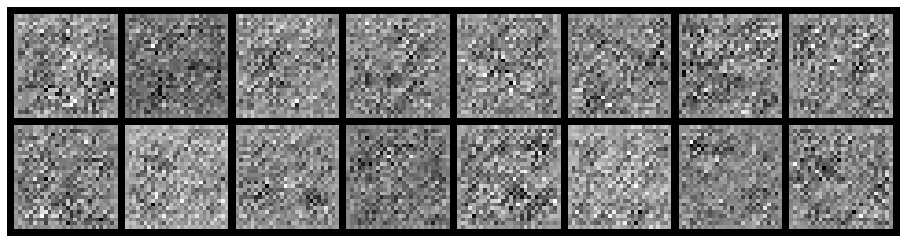

Epoch: [0/50], Batch Num: [0/600]
Discriminator Loss: 1.3866, Generator Loss: 0.6986
D(x): 0.4978, D(G(z)): 0.4979


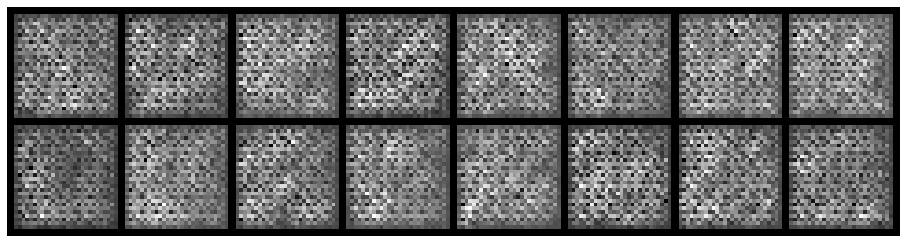

Epoch: [0/50], Batch Num: [100/600]
Discriminator Loss: 0.0005, Generator Loss: 7.7005
D(x): 1.0000, D(G(z)): 0.0005


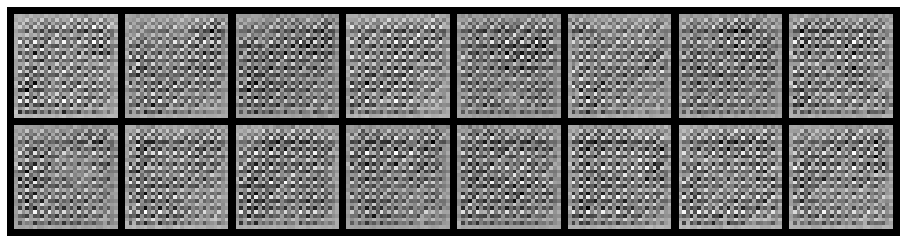

Epoch: [0/50], Batch Num: [200/600]
Discriminator Loss: 0.0000, Generator Loss: 11.3336
D(x): 1.0000, D(G(z)): 0.0000


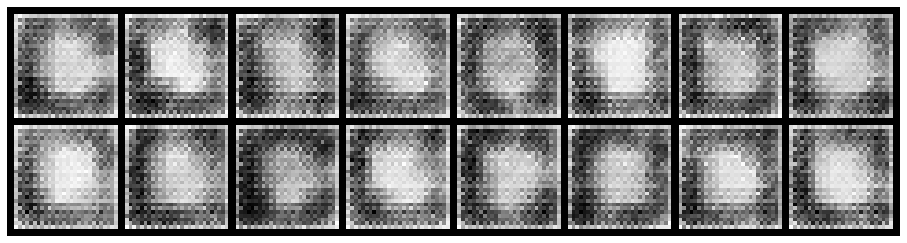

Epoch: [0/50], Batch Num: [300/600]
Discriminator Loss: 0.2158, Generator Loss: 3.4806
D(x): 1.0000, D(G(z)): 0.1386


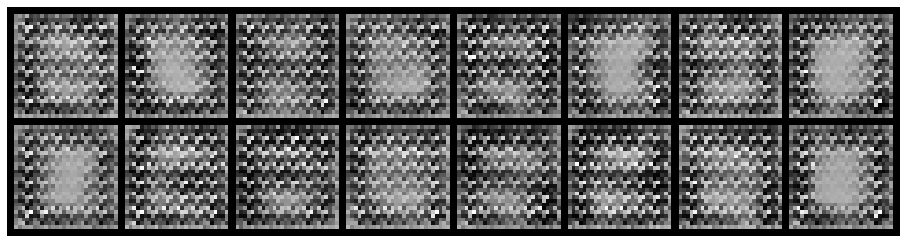

Epoch: [0/50], Batch Num: [400/600]
Discriminator Loss: 0.0105, Generator Loss: 6.8767
D(x): 0.9978, D(G(z)): 0.0081


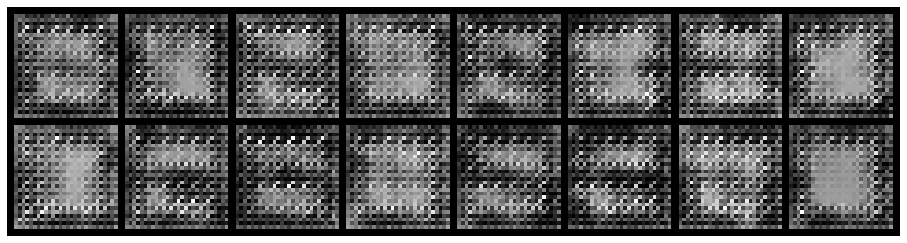

Epoch: [0/50], Batch Num: [500/600]
Discriminator Loss: 0.0180, Generator Loss: 9.6181
D(x): 0.9875, D(G(z)): 0.0035


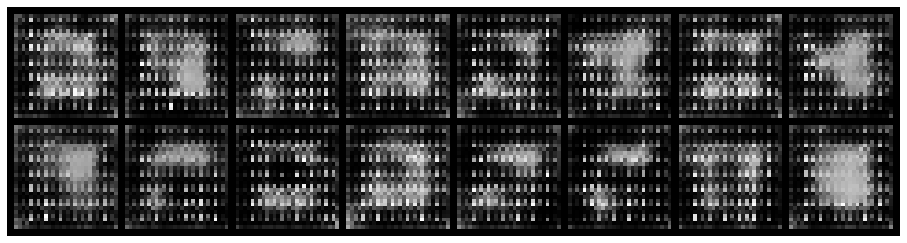

Epoch: [1/50], Batch Num: [0/600]
Discriminator Loss: 0.0055, Generator Loss: 9.5933
D(x): 0.9952, D(G(z)): 0.0004


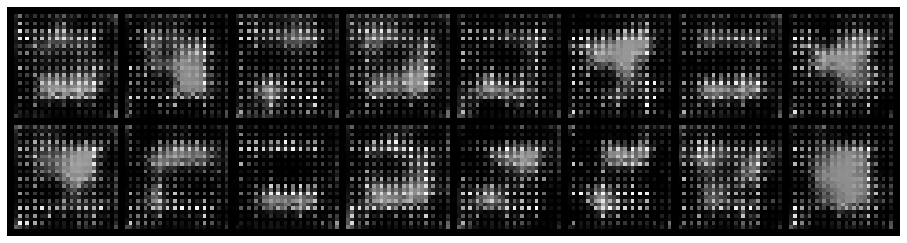

Epoch: [1/50], Batch Num: [100/600]
Discriminator Loss: 0.0010, Generator Loss: 14.1004
D(x): 1.0000, D(G(z)): 0.0009


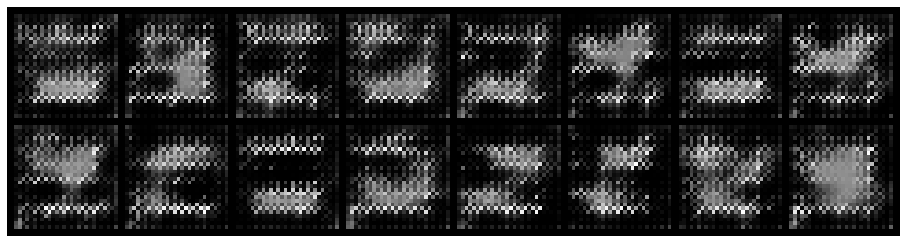

Epoch: [1/50], Batch Num: [200/600]
Discriminator Loss: 0.0846, Generator Loss: 8.2495
D(x): 1.0000, D(G(z)): 0.0572


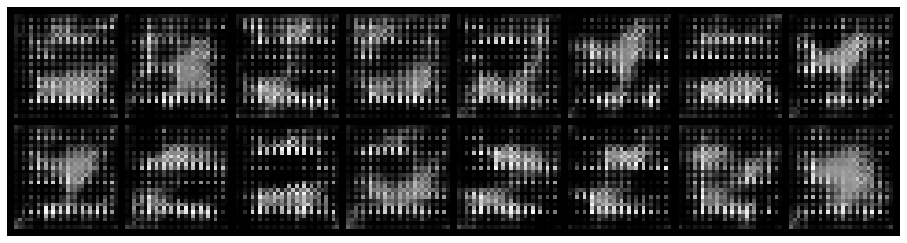

Epoch: [1/50], Batch Num: [300/600]
Discriminator Loss: 0.0763, Generator Loss: 15.0416
D(x): 0.9642, D(G(z)): 0.0003


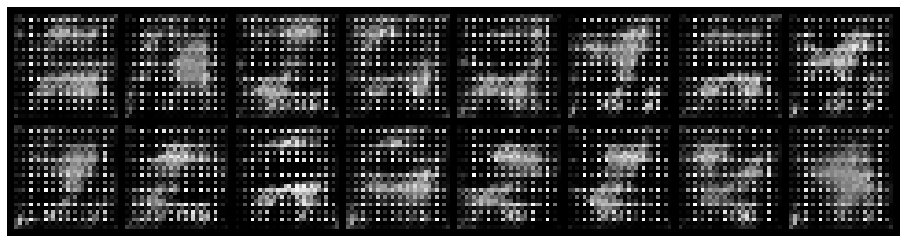

Epoch: [1/50], Batch Num: [400/600]
Discriminator Loss: 0.0061, Generator Loss: 17.0748
D(x): 0.9947, D(G(z)): 0.0000


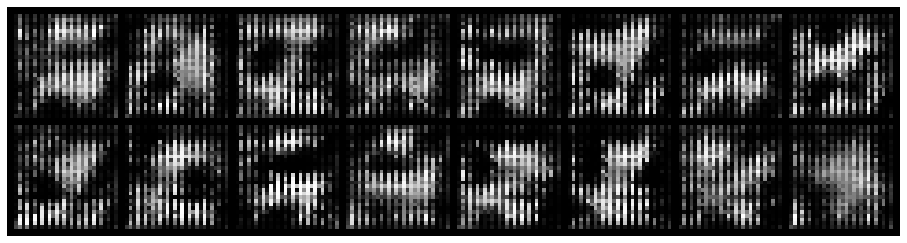

Epoch: [1/50], Batch Num: [500/600]
Discriminator Loss: 0.0171, Generator Loss: 13.9990
D(x): 0.9879, D(G(z)): 0.0006


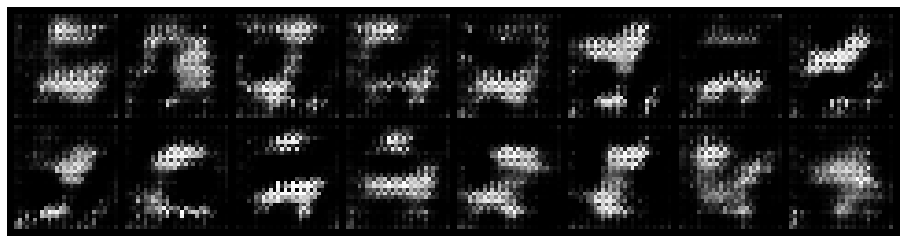

Epoch: [2/50], Batch Num: [0/600]
Discriminator Loss: 0.0743, Generator Loss: 5.2399
D(x): 0.9702, D(G(z)): 0.0191


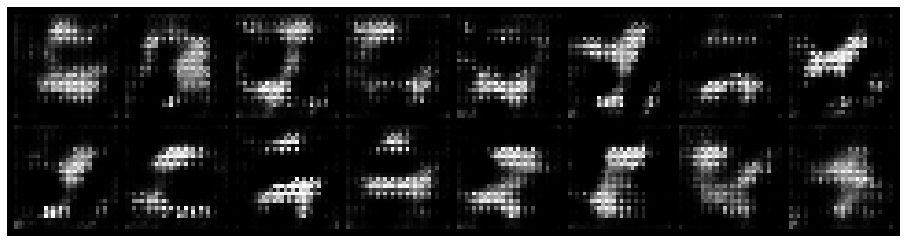

Epoch: [2/50], Batch Num: [100/600]
Discriminator Loss: 0.0563, Generator Loss: 7.5171
D(x): 0.9891, D(G(z)): 0.0186


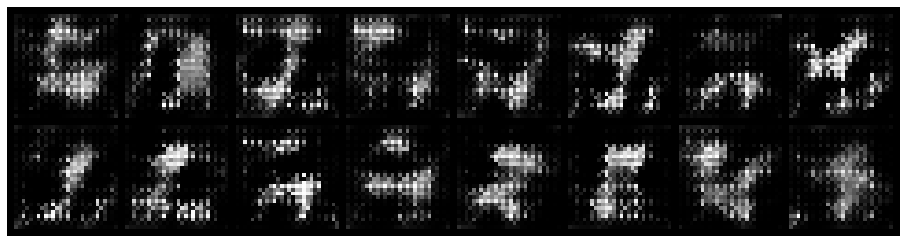

Epoch: [2/50], Batch Num: [200/600]
Discriminator Loss: 0.0145, Generator Loss: 10.1331
D(x): 0.9896, D(G(z)): 0.0029


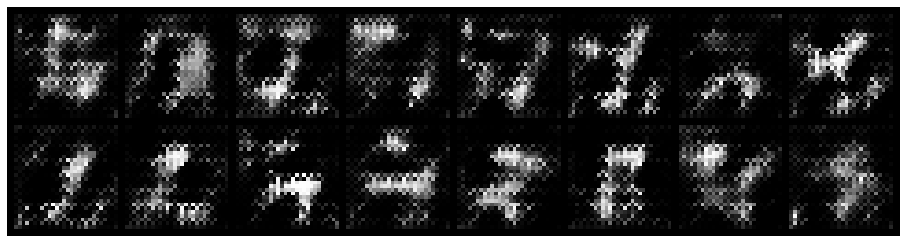

Epoch: [2/50], Batch Num: [300/600]
Discriminator Loss: 0.0072, Generator Loss: 8.4144
D(x): 0.9984, D(G(z)): 0.0054


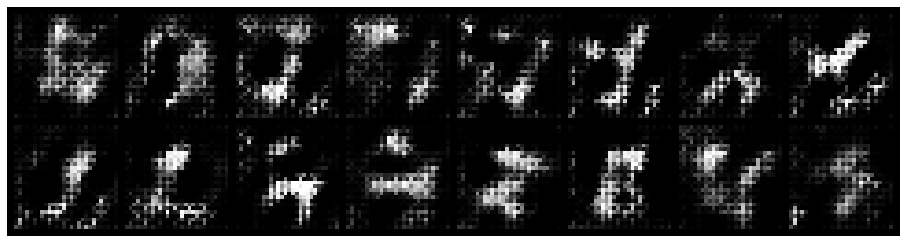

Epoch: [2/50], Batch Num: [400/600]
Discriminator Loss: 0.0603, Generator Loss: 6.2274
D(x): 0.9969, D(G(z)): 0.0423


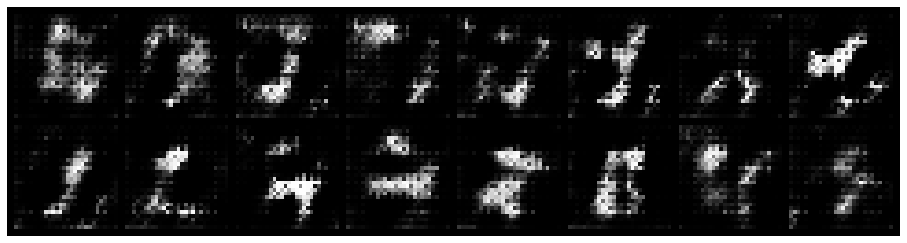

Epoch: [2/50], Batch Num: [500/600]
Discriminator Loss: 0.0774, Generator Loss: 6.2466
D(x): 0.9719, D(G(z)): 0.0225


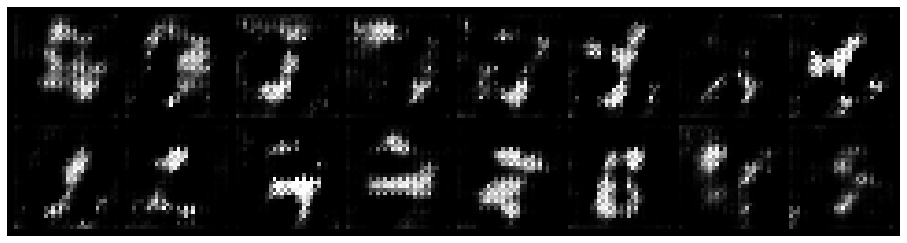

Epoch: [3/50], Batch Num: [0/600]
Discriminator Loss: 0.0176, Generator Loss: 9.6828
D(x): 0.9875, D(G(z)): 0.0036


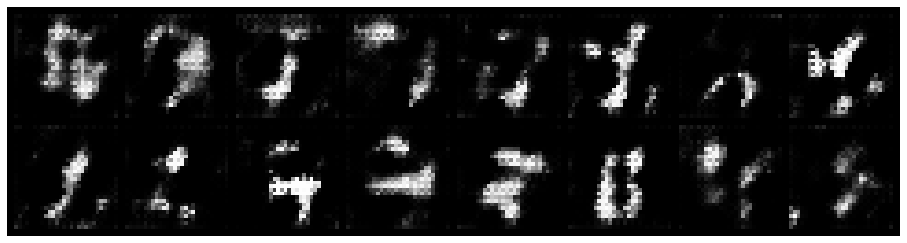

Epoch: [3/50], Batch Num: [100/600]
Discriminator Loss: 0.6350, Generator Loss: 6.1788
D(x): 0.9828, D(G(z)): 0.2864


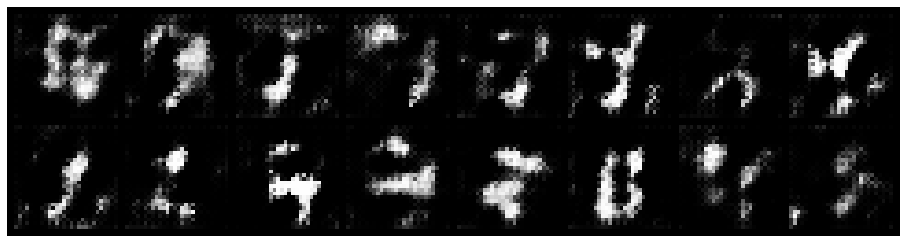

Epoch: [3/50], Batch Num: [200/600]
Discriminator Loss: 0.1084, Generator Loss: 7.3154
D(x): 0.9718, D(G(z)): 0.0362


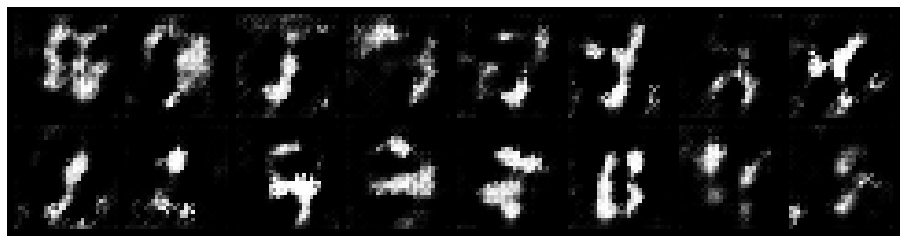

Epoch: [3/50], Batch Num: [300/600]
Discriminator Loss: 0.1953, Generator Loss: 3.3672
D(x): 0.9277, D(G(z)): 0.0401


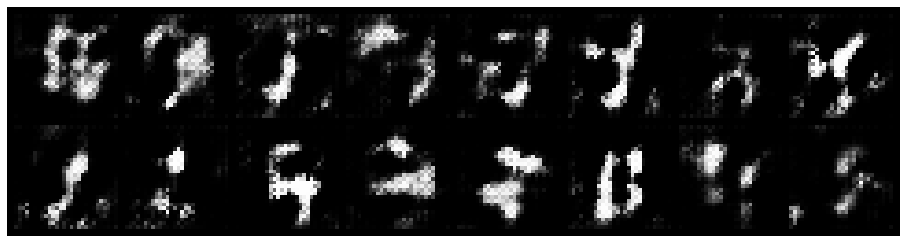

Epoch: [3/50], Batch Num: [400/600]
Discriminator Loss: 0.0678, Generator Loss: 6.2514
D(x): 0.9659, D(G(z)): 0.0227


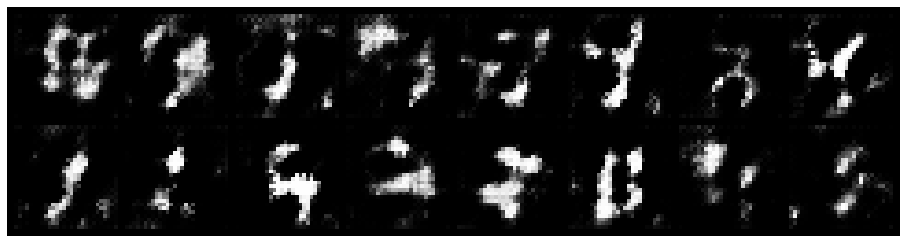

Epoch: [3/50], Batch Num: [500/600]
Discriminator Loss: 0.3150, Generator Loss: 5.5897
D(x): 0.8691, D(G(z)): 0.0240


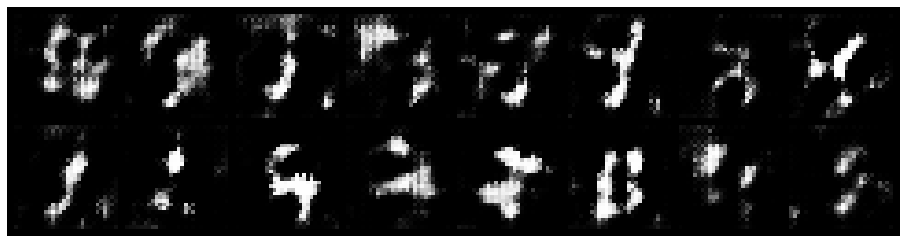

Epoch: [4/50], Batch Num: [0/600]
Discriminator Loss: 0.1168, Generator Loss: 5.6013
D(x): 0.9584, D(G(z)): 0.0282


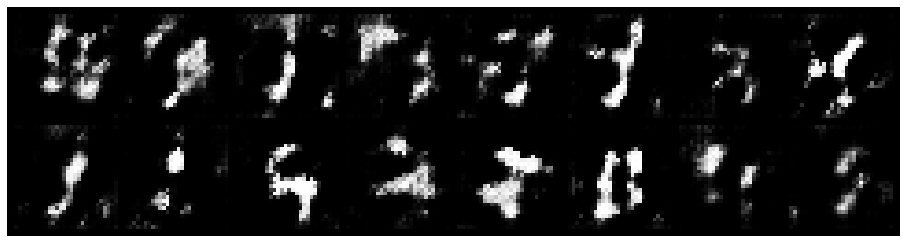

Epoch: [4/50], Batch Num: [100/600]
Discriminator Loss: 0.1367, Generator Loss: 5.7746
D(x): 0.9875, D(G(z)): 0.0824


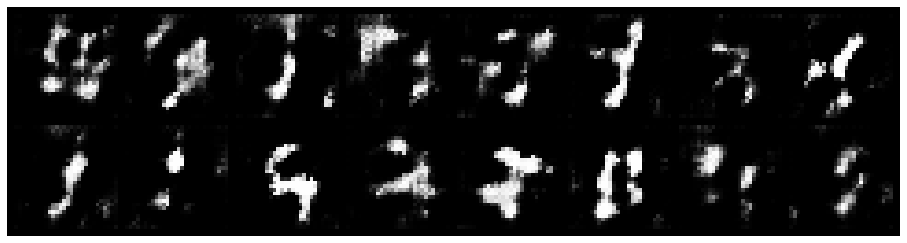

Epoch: [4/50], Batch Num: [200/600]
Discriminator Loss: 0.1881, Generator Loss: 3.9120
D(x): 0.9873, D(G(z)): 0.1019


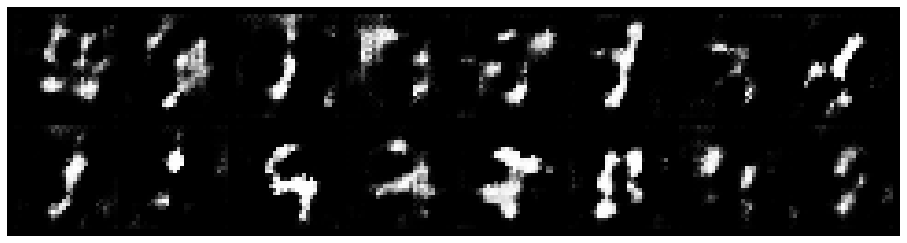

Epoch: [4/50], Batch Num: [300/600]
Discriminator Loss: 0.0456, Generator Loss: 3.8648
D(x): 0.9873, D(G(z)): 0.0269


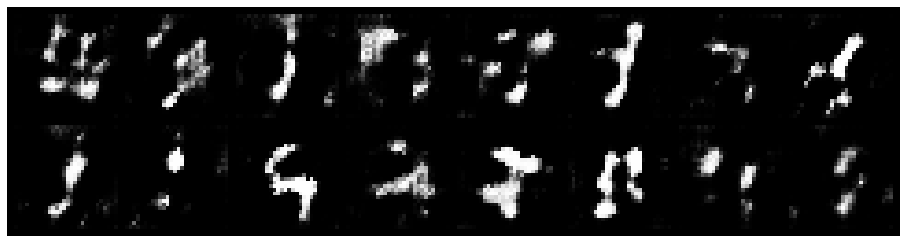

Epoch: [4/50], Batch Num: [400/600]
Discriminator Loss: 0.1225, Generator Loss: 5.5543
D(x): 0.9798, D(G(z)): 0.0640


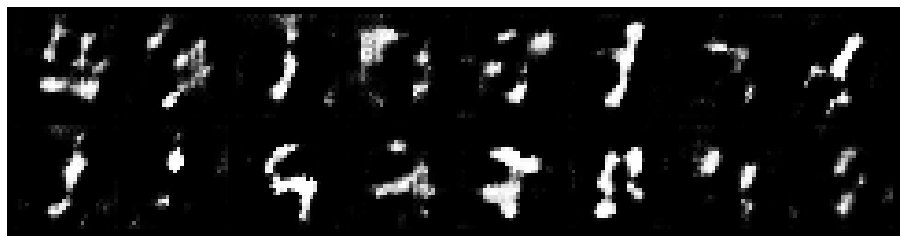

Epoch: [4/50], Batch Num: [500/600]
Discriminator Loss: 0.3226, Generator Loss: 6.2449
D(x): 0.8430, D(G(z)): 0.0079


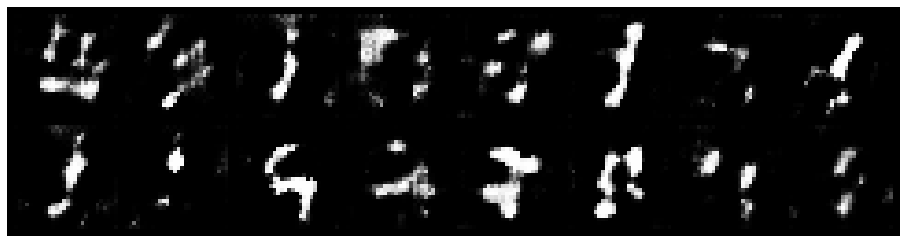

Epoch: [5/50], Batch Num: [0/600]
Discriminator Loss: 0.1012, Generator Loss: 5.7477
D(x): 0.9695, D(G(z)): 0.0413


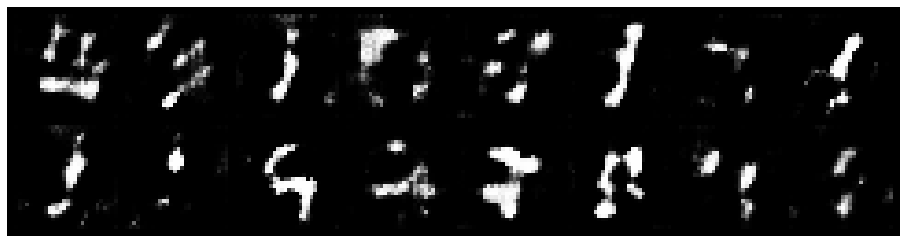

Epoch: [5/50], Batch Num: [100/600]
Discriminator Loss: 0.3227, Generator Loss: 6.0121
D(x): 0.8706, D(G(z)): 0.0040


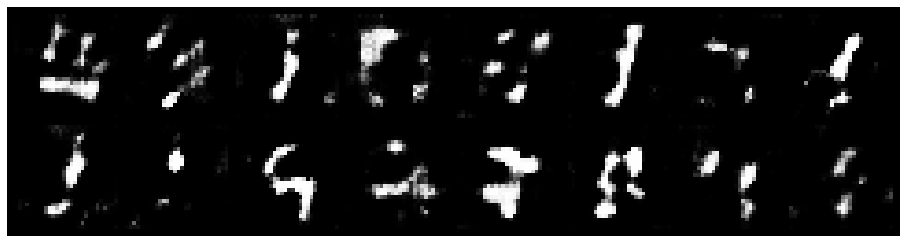

Epoch: [5/50], Batch Num: [200/600]
Discriminator Loss: 0.1426, Generator Loss: 5.2025
D(x): 0.9298, D(G(z)): 0.0270


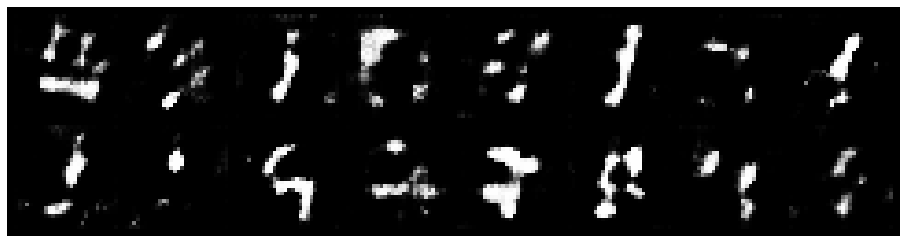

Epoch: [5/50], Batch Num: [300/600]
Discriminator Loss: 0.2628, Generator Loss: 6.8870
D(x): 0.9185, D(G(z)): 0.0281


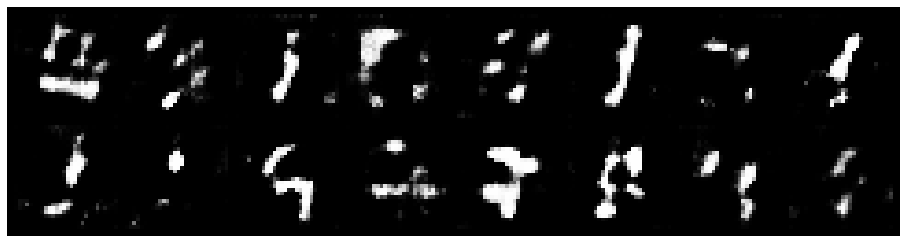

Epoch: [5/50], Batch Num: [400/600]
Discriminator Loss: 0.1456, Generator Loss: 5.9393
D(x): 0.9575, D(G(z)): 0.0466


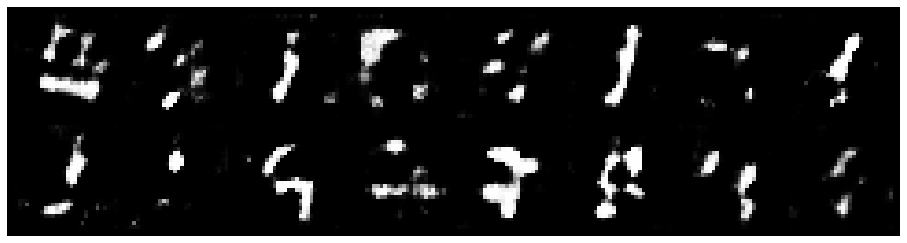

Epoch: [5/50], Batch Num: [500/600]
Discriminator Loss: 0.1910, Generator Loss: 5.8330
D(x): 0.9767, D(G(z)): 0.1091


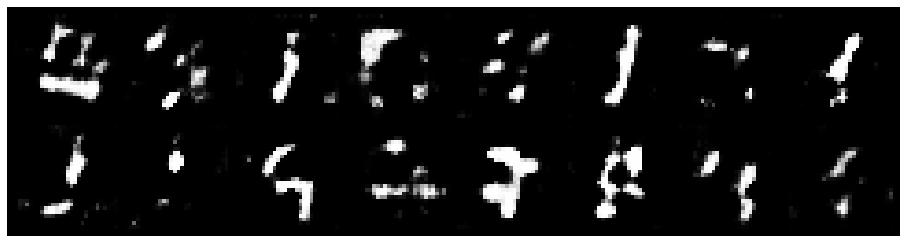

Epoch: [6/50], Batch Num: [0/600]
Discriminator Loss: 0.1432, Generator Loss: 4.5191
D(x): 0.9677, D(G(z)): 0.0664


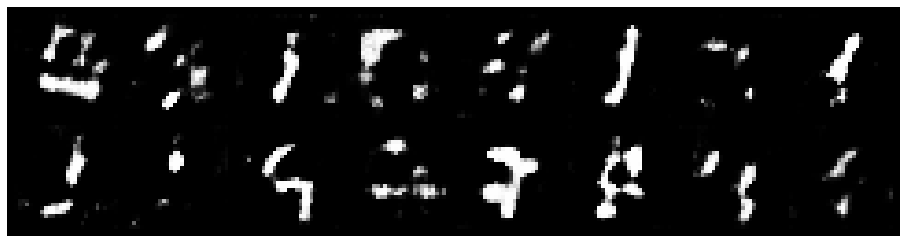

Epoch: [6/50], Batch Num: [100/600]
Discriminator Loss: 0.2568, Generator Loss: 5.9102
D(x): 0.9686, D(G(z)): 0.1277


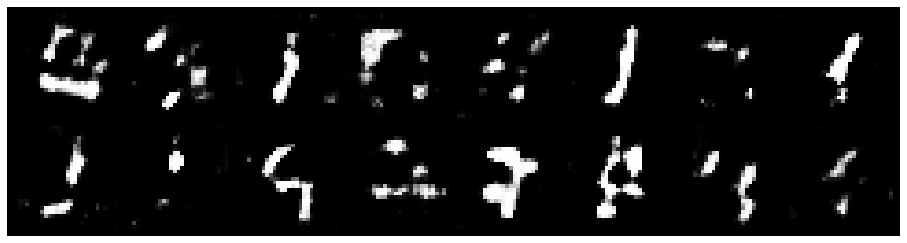

Epoch: [6/50], Batch Num: [200/600]
Discriminator Loss: 0.0883, Generator Loss: 4.4013
D(x): 0.9727, D(G(z)): 0.0429


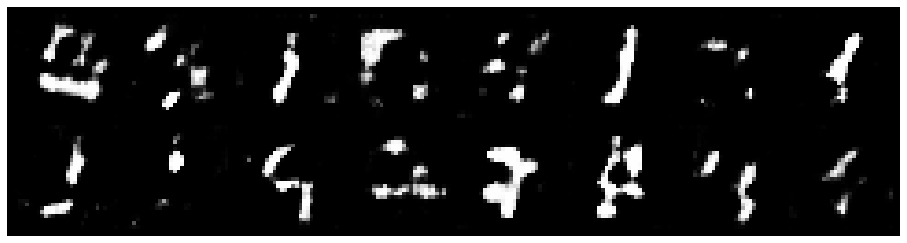

Epoch: [6/50], Batch Num: [300/600]
Discriminator Loss: 0.1611, Generator Loss: 5.9348
D(x): 0.9409, D(G(z)): 0.0420


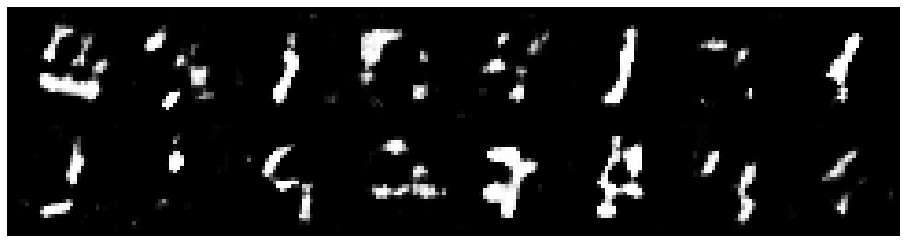

Epoch: [6/50], Batch Num: [400/600]
Discriminator Loss: 0.1399, Generator Loss: 5.9602
D(x): 0.9469, D(G(z)): 0.0493


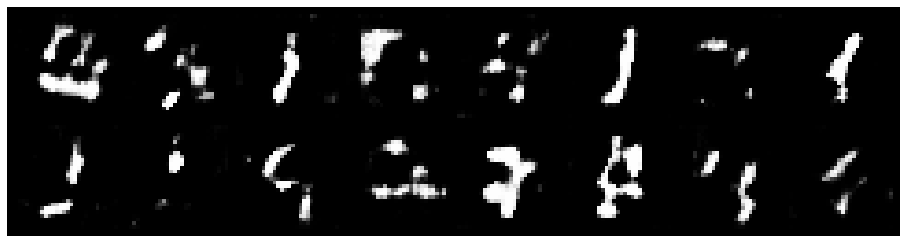

Epoch: [6/50], Batch Num: [500/600]
Discriminator Loss: 0.1983, Generator Loss: 5.1424
D(x): 0.9611, D(G(z)): 0.0784


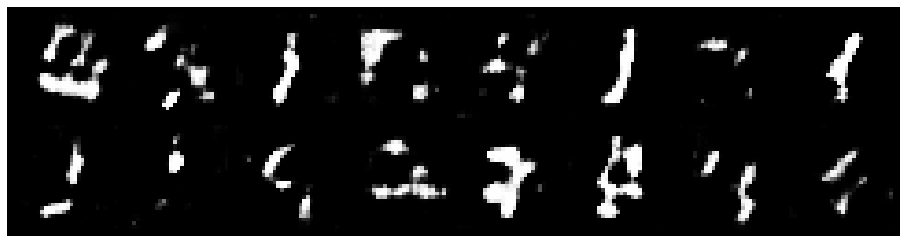

Epoch: [7/50], Batch Num: [0/600]
Discriminator Loss: 0.0995, Generator Loss: 6.6268
D(x): 0.9604, D(G(z)): 0.0435


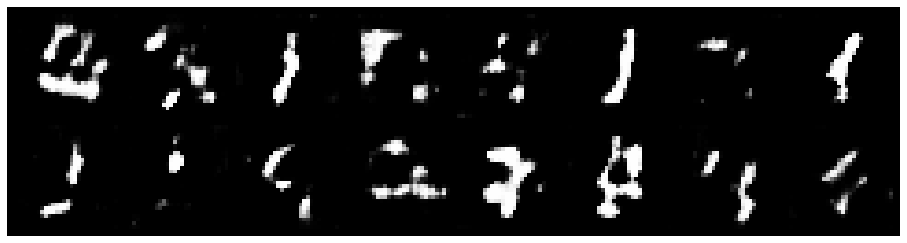

Epoch: [7/50], Batch Num: [100/600]
Discriminator Loss: 0.4593, Generator Loss: 6.3541
D(x): 0.9537, D(G(z)): 0.1614


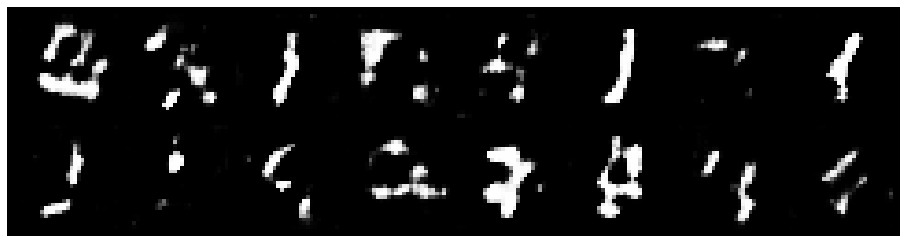

Epoch: [7/50], Batch Num: [200/600]
Discriminator Loss: 0.1793, Generator Loss: 5.7150
D(x): 0.9546, D(G(z)): 0.0472


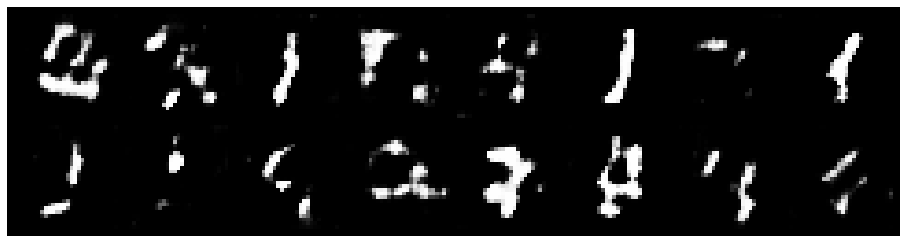

Epoch: [7/50], Batch Num: [300/600]
Discriminator Loss: 0.2277, Generator Loss: 6.6764
D(x): 0.9147, D(G(z)): 0.0475


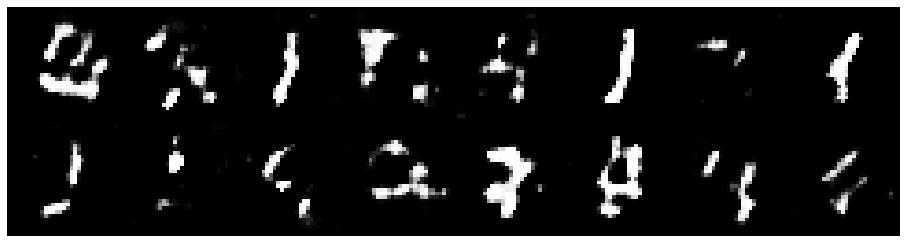

Epoch: [7/50], Batch Num: [400/600]
Discriminator Loss: 0.1245, Generator Loss: 4.7646
D(x): 0.9648, D(G(z)): 0.0703


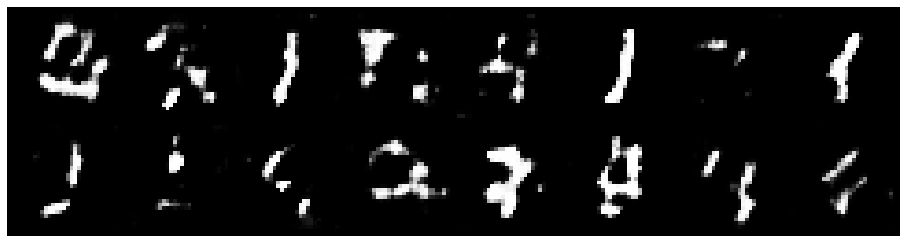

Epoch: [7/50], Batch Num: [500/600]
Discriminator Loss: 0.1487, Generator Loss: 4.9676
D(x): 0.9625, D(G(z)): 0.0749


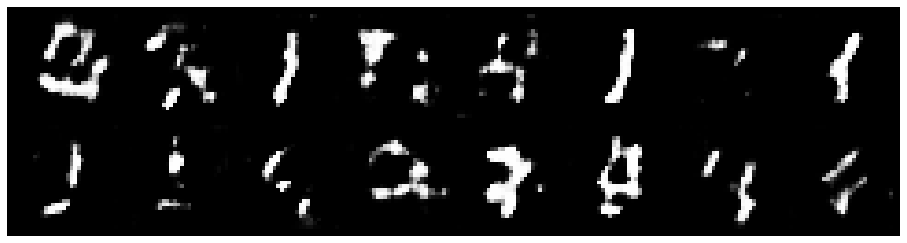

Epoch: [8/50], Batch Num: [0/600]
Discriminator Loss: 0.2560, Generator Loss: 6.3935
D(x): 0.9239, D(G(z)): 0.0614


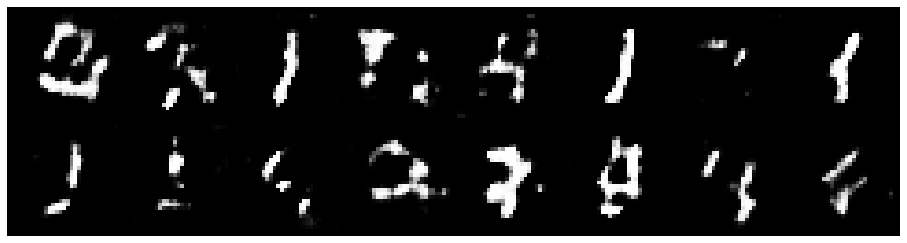

Epoch: [8/50], Batch Num: [100/600]
Discriminator Loss: 0.1234, Generator Loss: 5.0754
D(x): 0.9778, D(G(z)): 0.0669


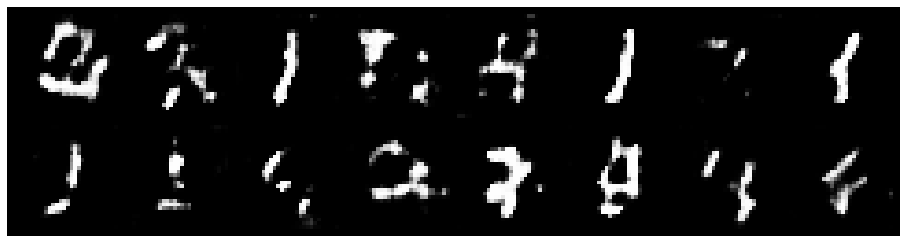

Epoch: [8/50], Batch Num: [200/600]
Discriminator Loss: 0.2042, Generator Loss: 6.8072
D(x): 0.9476, D(G(z)): 0.0488


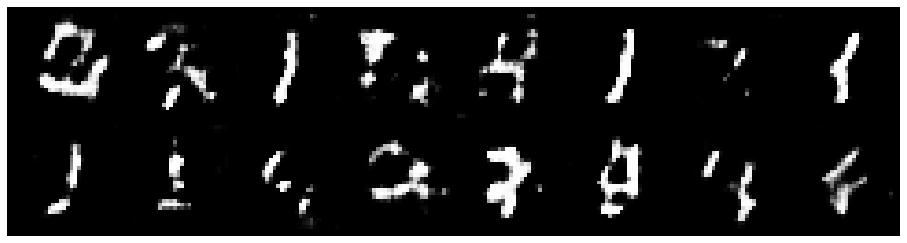

Epoch: [8/50], Batch Num: [300/600]
Discriminator Loss: 0.1463, Generator Loss: 4.7529
D(x): 0.9732, D(G(z)): 0.0706


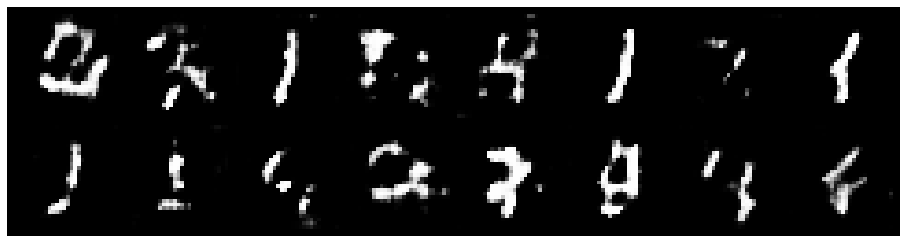

Epoch: [8/50], Batch Num: [400/600]
Discriminator Loss: 0.2340, Generator Loss: 4.6306
D(x): 0.9306, D(G(z)): 0.0468


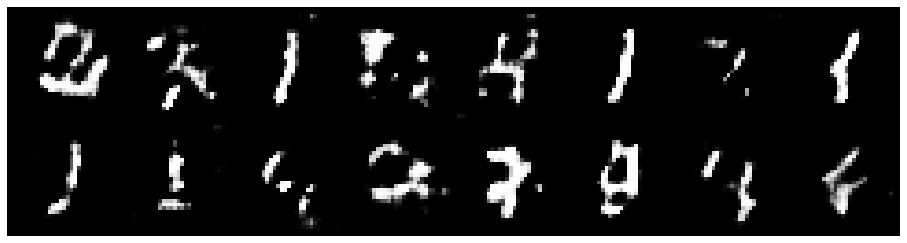

Epoch: [8/50], Batch Num: [500/600]
Discriminator Loss: 0.1489, Generator Loss: 4.6386
D(x): 0.9250, D(G(z)): 0.0328


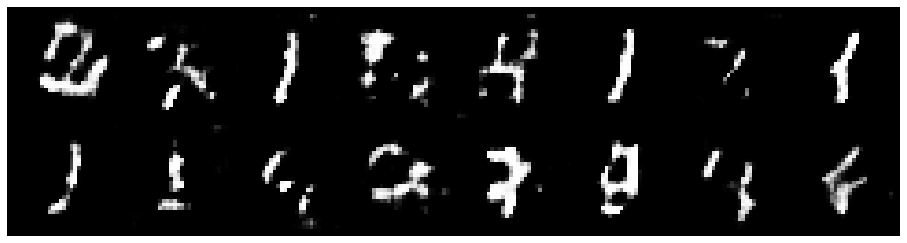

Epoch: [9/50], Batch Num: [0/600]
Discriminator Loss: 0.1337, Generator Loss: 5.2639
D(x): 0.9364, D(G(z)): 0.0366


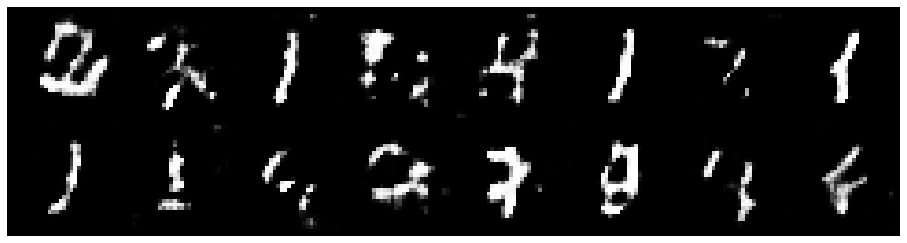

Epoch: [9/50], Batch Num: [100/600]
Discriminator Loss: 0.1098, Generator Loss: 4.1630
D(x): 0.9611, D(G(z)): 0.0491


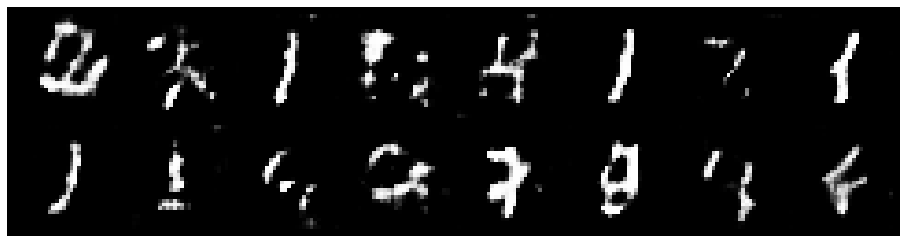

Epoch: [9/50], Batch Num: [200/600]
Discriminator Loss: 0.1973, Generator Loss: 5.0660
D(x): 0.8989, D(G(z)): 0.0333


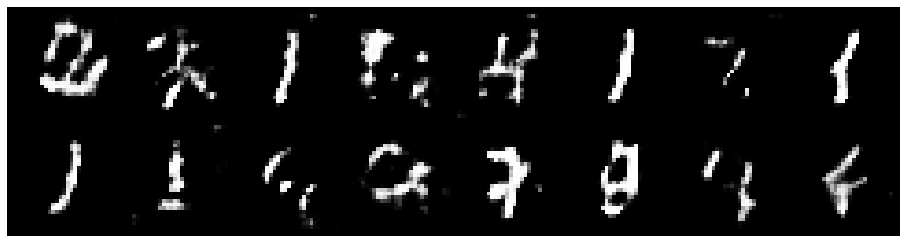

Epoch: [9/50], Batch Num: [300/600]
Discriminator Loss: 0.1598, Generator Loss: 5.9159
D(x): 0.9430, D(G(z)): 0.0475


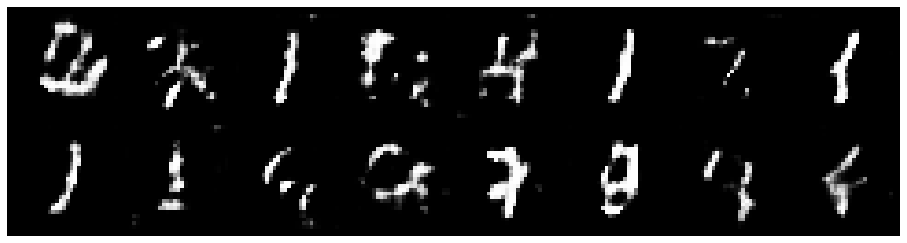

Epoch: [9/50], Batch Num: [400/600]
Discriminator Loss: 0.1428, Generator Loss: 5.9561
D(x): 0.9390, D(G(z)): 0.0289


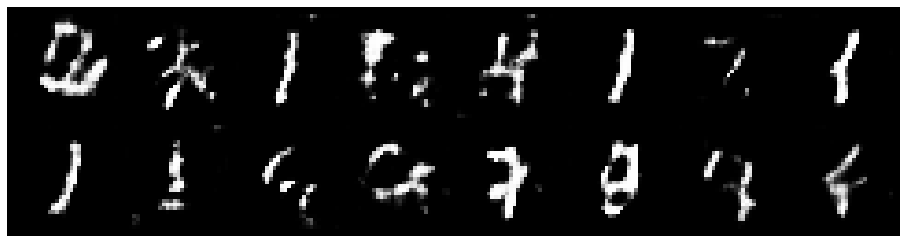

Epoch: [9/50], Batch Num: [500/600]
Discriminator Loss: 0.2281, Generator Loss: 4.9941
D(x): 0.9503, D(G(z)): 0.0807


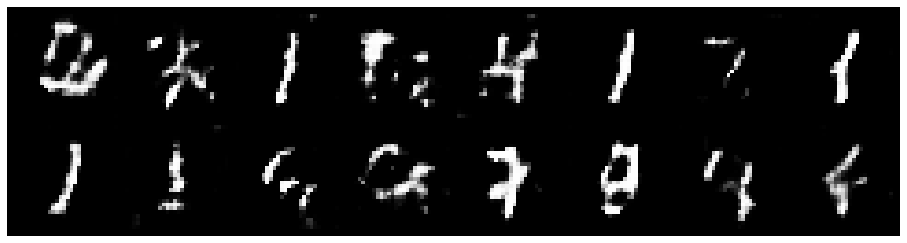

Epoch: [10/50], Batch Num: [0/600]
Discriminator Loss: 0.1221, Generator Loss: 5.1587
D(x): 0.9608, D(G(z)): 0.0579


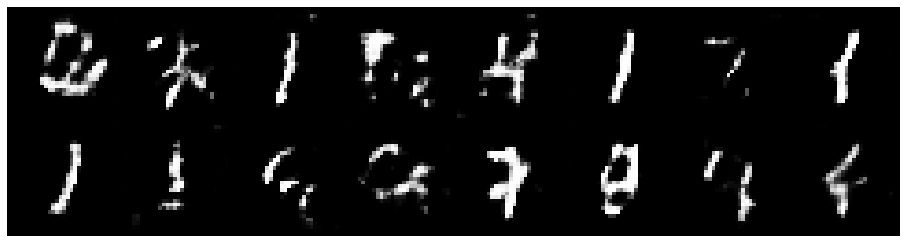

Epoch: [10/50], Batch Num: [100/600]
Discriminator Loss: 0.1320, Generator Loss: 5.8184
D(x): 0.9402, D(G(z)): 0.0341


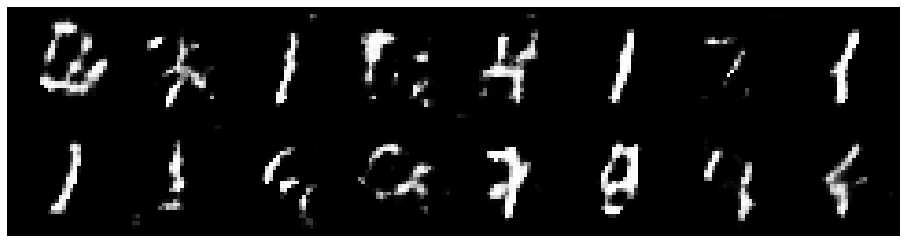

Epoch: [10/50], Batch Num: [200/600]
Discriminator Loss: 0.1671, Generator Loss: 4.8992
D(x): 0.9672, D(G(z)): 0.0758


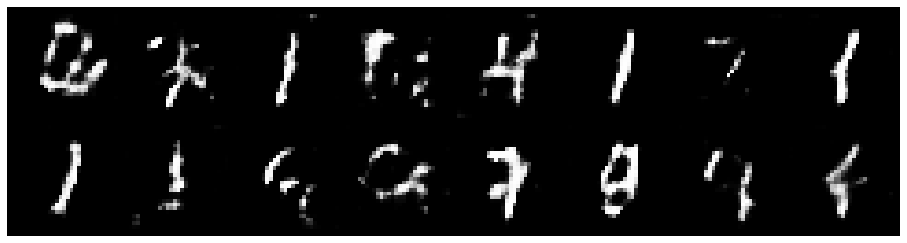

Epoch: [10/50], Batch Num: [300/600]
Discriminator Loss: 0.1328, Generator Loss: 6.7977
D(x): 0.9525, D(G(z)): 0.0232


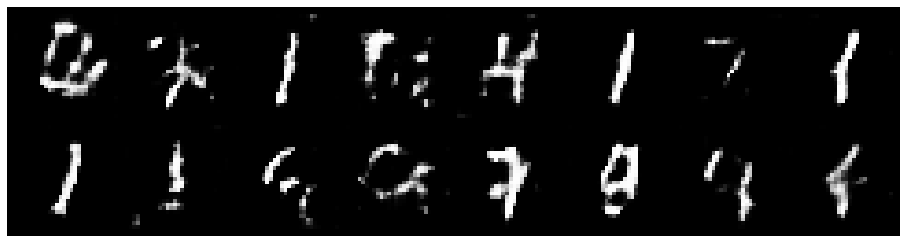

Epoch: [10/50], Batch Num: [400/600]
Discriminator Loss: 0.2476, Generator Loss: 6.6463
D(x): 0.9203, D(G(z)): 0.0506


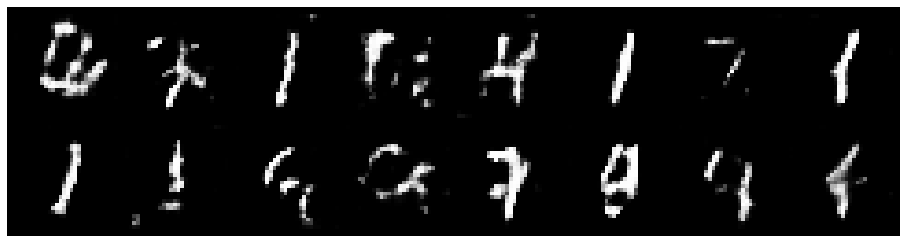

Epoch: [10/50], Batch Num: [500/600]
Discriminator Loss: 0.1061, Generator Loss: 5.3753
D(x): 0.9662, D(G(z)): 0.0431


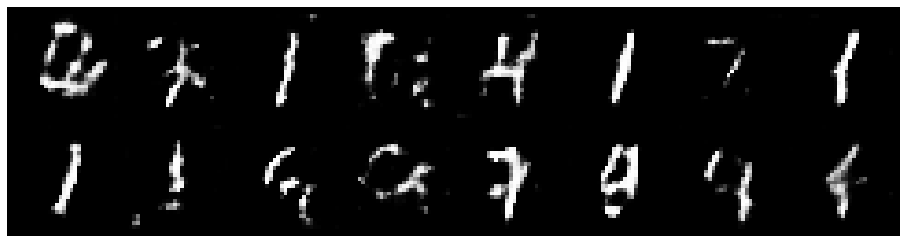

Epoch: [11/50], Batch Num: [0/600]
Discriminator Loss: 0.1989, Generator Loss: 5.6781
D(x): 0.9206, D(G(z)): 0.0519


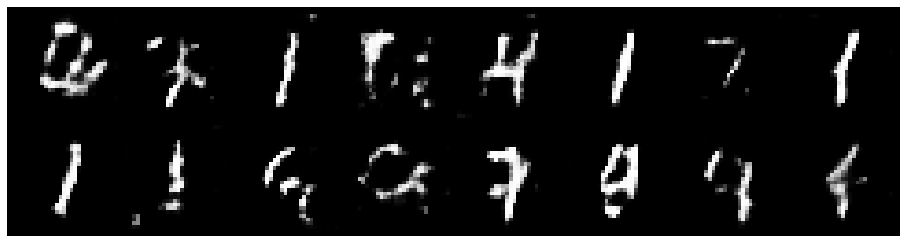

Epoch: [11/50], Batch Num: [100/600]
Discriminator Loss: 0.1426, Generator Loss: 4.7724
D(x): 0.9632, D(G(z)): 0.0570


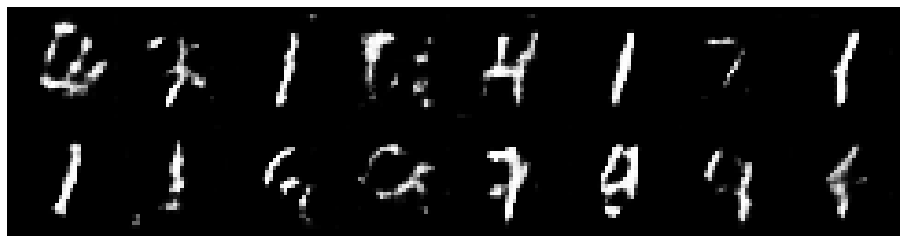

Epoch: [11/50], Batch Num: [200/600]
Discriminator Loss: 0.1478, Generator Loss: 4.4200
D(x): 0.9438, D(G(z)): 0.0449


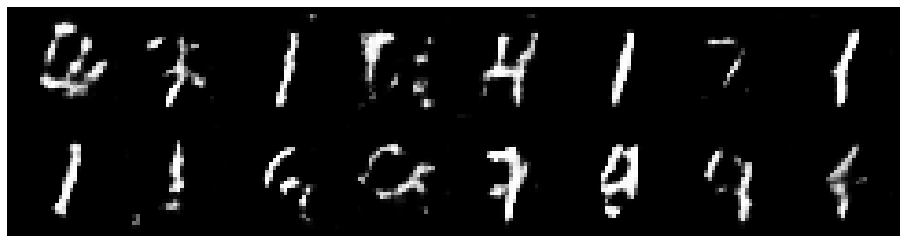

Epoch: [11/50], Batch Num: [300/600]
Discriminator Loss: 0.1369, Generator Loss: 4.5384
D(x): 0.9484, D(G(z)): 0.0451


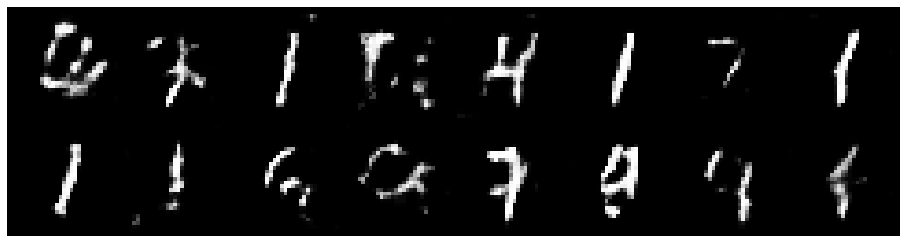

Epoch: [11/50], Batch Num: [400/600]
Discriminator Loss: 0.1408, Generator Loss: 5.5712
D(x): 0.9642, D(G(z)): 0.0506


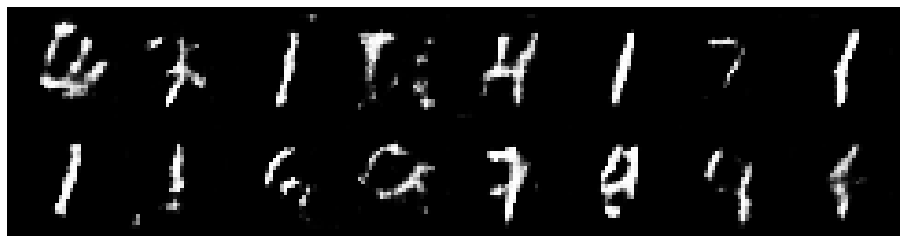

Epoch: [11/50], Batch Num: [500/600]
Discriminator Loss: 0.2071, Generator Loss: 4.9152
D(x): 0.9374, D(G(z)): 0.0475


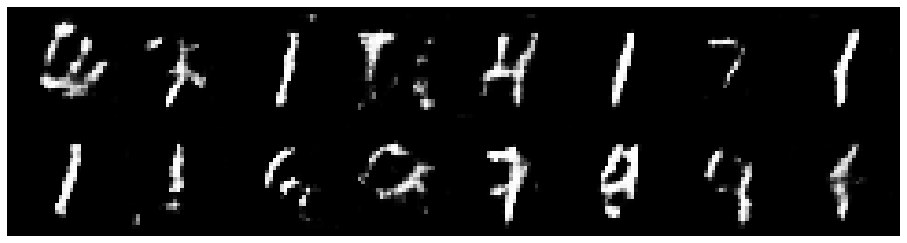

Epoch: [12/50], Batch Num: [0/600]
Discriminator Loss: 0.1294, Generator Loss: 6.3845
D(x): 0.9628, D(G(z)): 0.0576


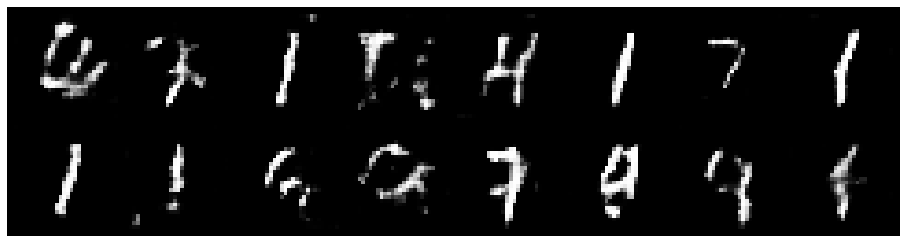

Epoch: [12/50], Batch Num: [100/600]
Discriminator Loss: 0.1139, Generator Loss: 6.1328
D(x): 0.9642, D(G(z)): 0.0373


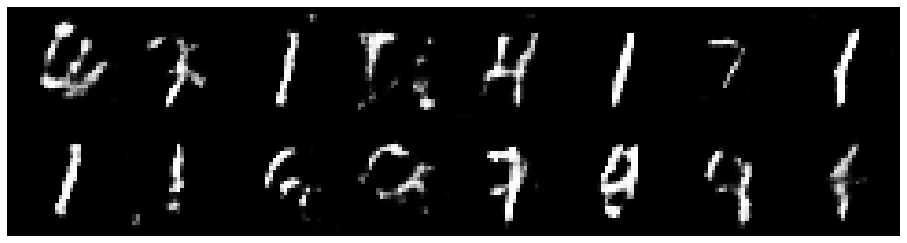

Epoch: [12/50], Batch Num: [200/600]
Discriminator Loss: 0.1989, Generator Loss: 5.1297
D(x): 0.9649, D(G(z)): 0.0891


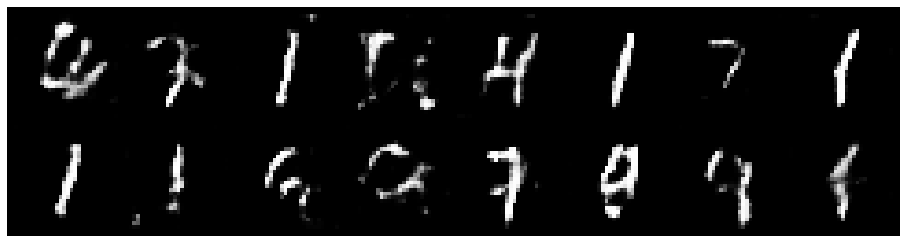

Epoch: [12/50], Batch Num: [300/600]
Discriminator Loss: 0.3361, Generator Loss: 5.2609
D(x): 0.8912, D(G(z)): 0.0383


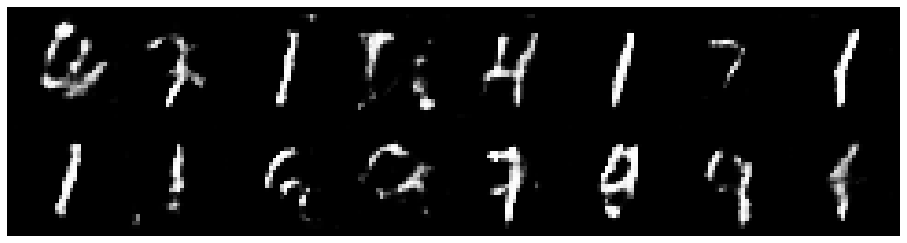

Epoch: [12/50], Batch Num: [400/600]
Discriminator Loss: 0.2250, Generator Loss: 5.4909
D(x): 0.9202, D(G(z)): 0.0591


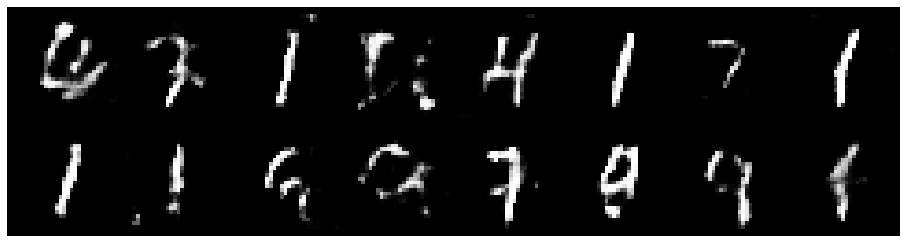

Epoch: [12/50], Batch Num: [500/600]
Discriminator Loss: 0.1307, Generator Loss: 5.5960
D(x): 0.9456, D(G(z)): 0.0323


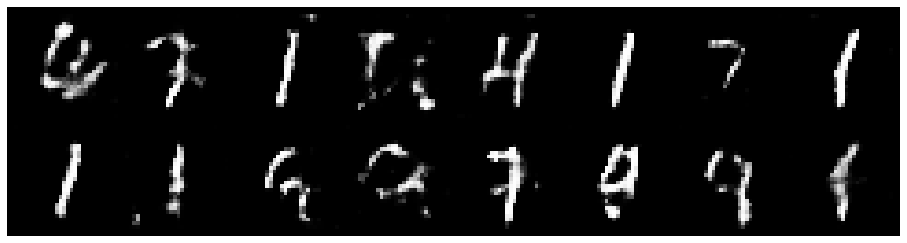

Epoch: [13/50], Batch Num: [0/600]
Discriminator Loss: 0.2122, Generator Loss: 4.9145
D(x): 0.9639, D(G(z)): 0.0899


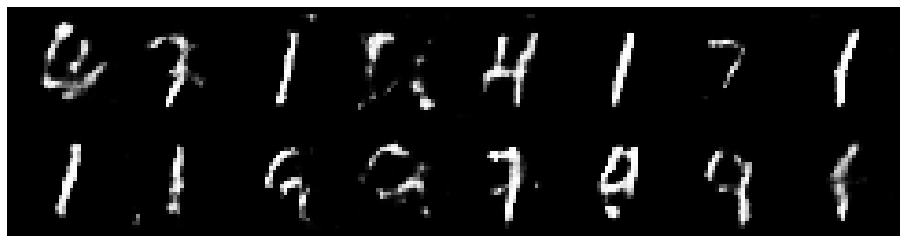

Epoch: [13/50], Batch Num: [100/600]
Discriminator Loss: 0.1165, Generator Loss: 4.7747
D(x): 0.9666, D(G(z)): 0.0486


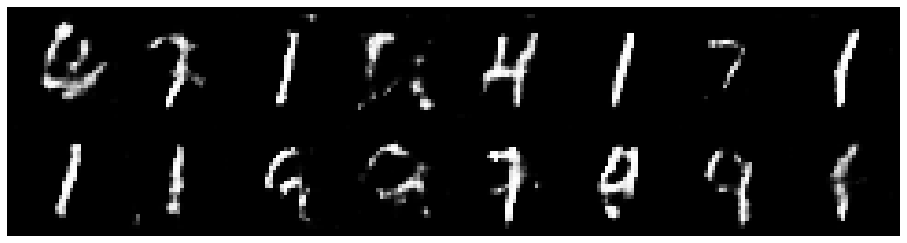

Epoch: [13/50], Batch Num: [200/600]
Discriminator Loss: 0.2493, Generator Loss: 6.0047
D(x): 0.9209, D(G(z)): 0.0503


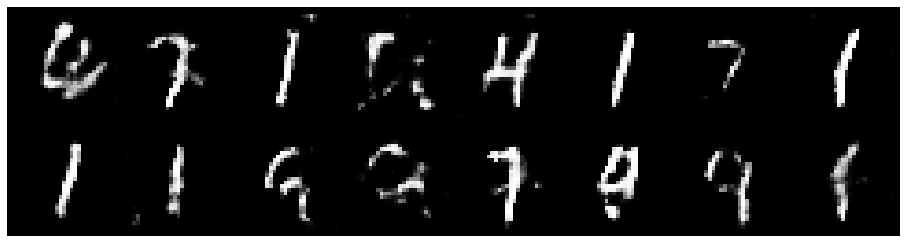

Epoch: [13/50], Batch Num: [300/600]
Discriminator Loss: 0.1795, Generator Loss: 5.7285
D(x): 0.9528, D(G(z)): 0.0423


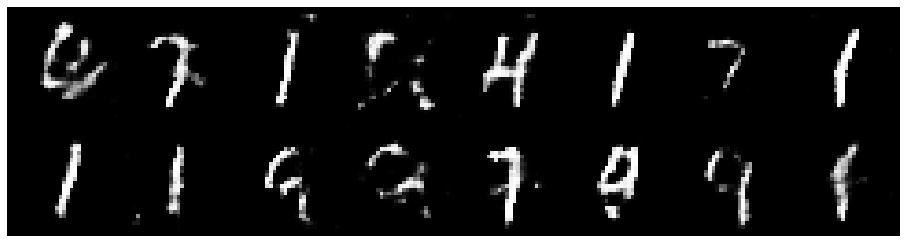

Epoch: [13/50], Batch Num: [400/600]
Discriminator Loss: 0.1350, Generator Loss: 4.3342
D(x): 0.9768, D(G(z)): 0.0702


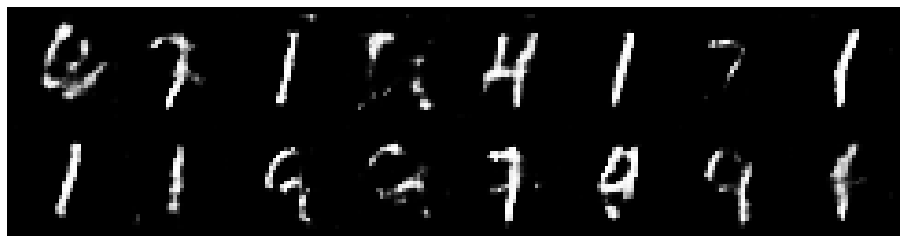

Epoch: [13/50], Batch Num: [500/600]
Discriminator Loss: 0.2395, Generator Loss: 5.0609
D(x): 0.9345, D(G(z)): 0.0849


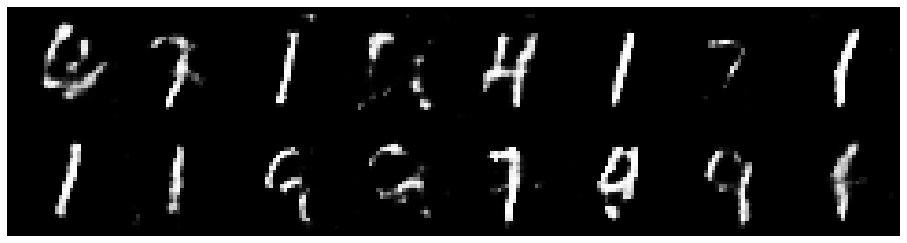

Epoch: [14/50], Batch Num: [0/600]
Discriminator Loss: 0.1982, Generator Loss: 4.5089
D(x): 0.9686, D(G(z)): 0.0799


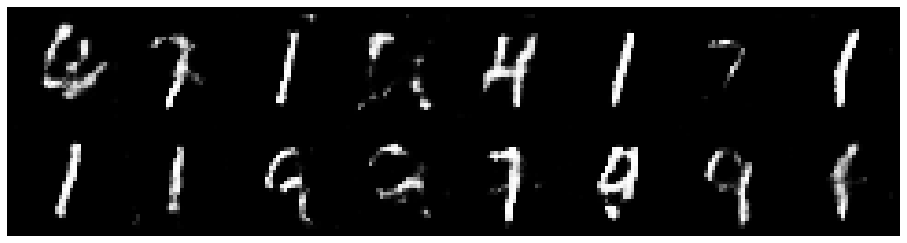

Epoch: [14/50], Batch Num: [100/600]
Discriminator Loss: 0.1947, Generator Loss: 5.0887
D(x): 0.9548, D(G(z)): 0.0647


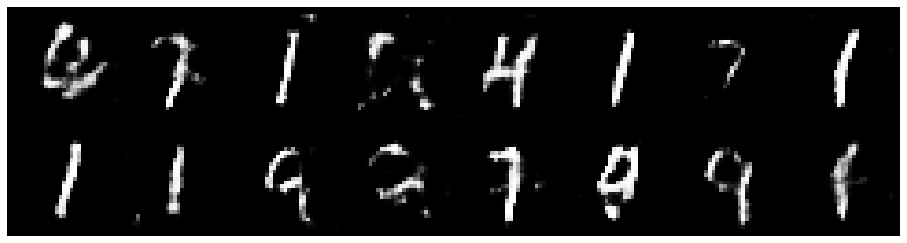

Epoch: [14/50], Batch Num: [200/600]
Discriminator Loss: 0.1468, Generator Loss: 5.2619
D(x): 0.9688, D(G(z)): 0.0614


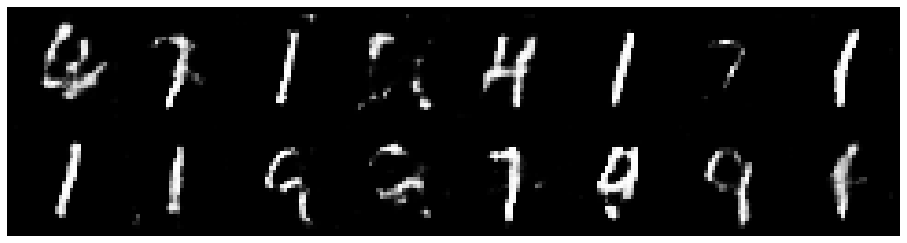

Epoch: [14/50], Batch Num: [300/600]
Discriminator Loss: 0.1922, Generator Loss: 5.2002
D(x): 0.9351, D(G(z)): 0.0536


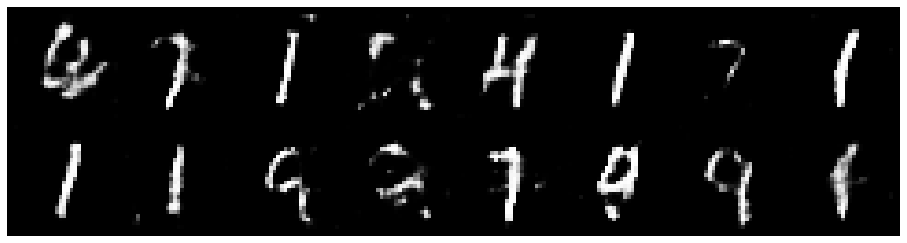

Epoch: [14/50], Batch Num: [400/600]
Discriminator Loss: 0.2245, Generator Loss: 5.0268
D(x): 0.9363, D(G(z)): 0.0555


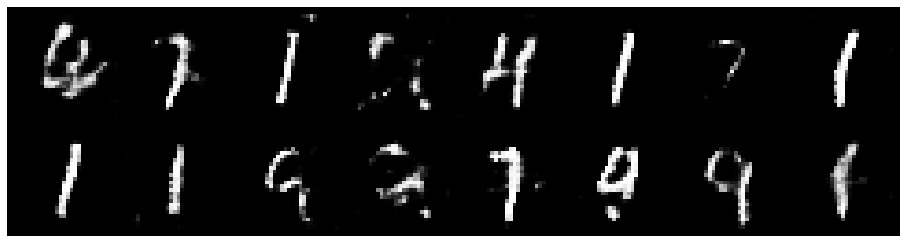

Epoch: [14/50], Batch Num: [500/600]
Discriminator Loss: 0.2110, Generator Loss: 5.3289
D(x): 0.9262, D(G(z)): 0.0463


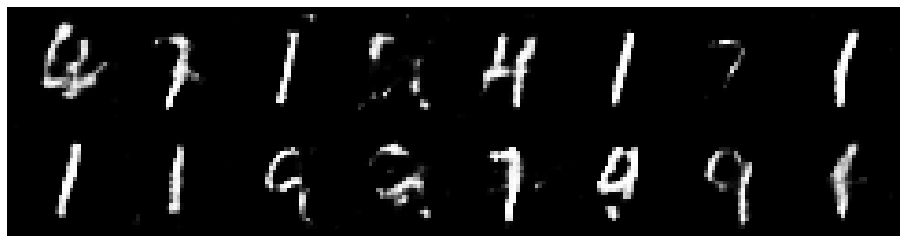

Epoch: [15/50], Batch Num: [0/600]
Discriminator Loss: 0.2121, Generator Loss: 6.0570
D(x): 0.9463, D(G(z)): 0.0603


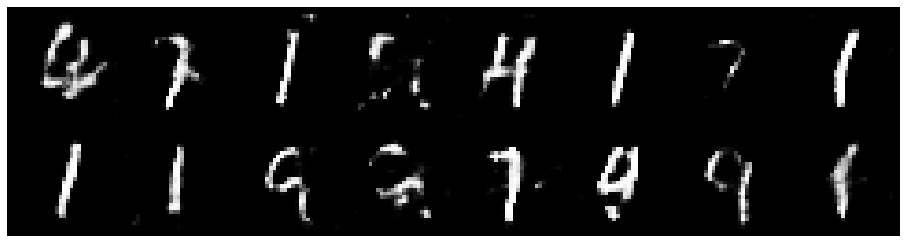

Epoch: [15/50], Batch Num: [100/600]
Discriminator Loss: 0.2229, Generator Loss: 5.4123
D(x): 0.9191, D(G(z)): 0.0416


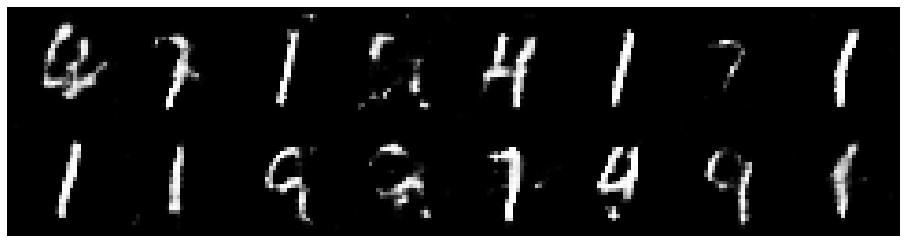

Epoch: [15/50], Batch Num: [200/600]
Discriminator Loss: 0.2055, Generator Loss: 4.8079
D(x): 0.9456, D(G(z)): 0.0629


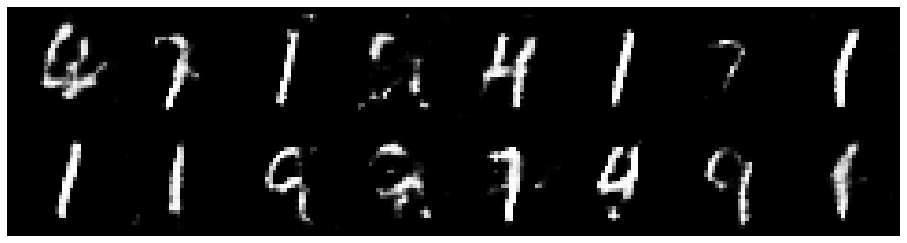

Epoch: [15/50], Batch Num: [300/600]
Discriminator Loss: 0.1938, Generator Loss: 5.7910
D(x): 0.9210, D(G(z)): 0.0259


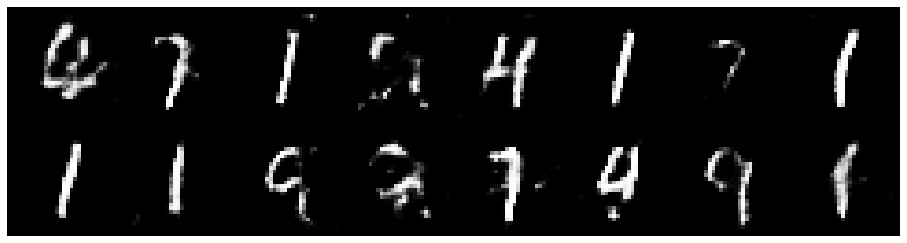

Epoch: [15/50], Batch Num: [400/600]
Discriminator Loss: 0.2046, Generator Loss: 5.0748
D(x): 0.9494, D(G(z)): 0.0619


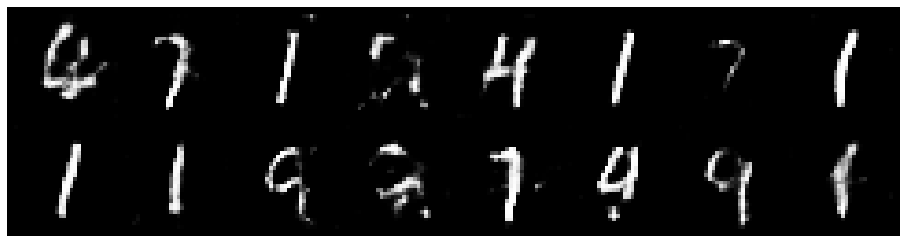

Epoch: [15/50], Batch Num: [500/600]
Discriminator Loss: 0.1957, Generator Loss: 6.1855
D(x): 0.9215, D(G(z)): 0.0181


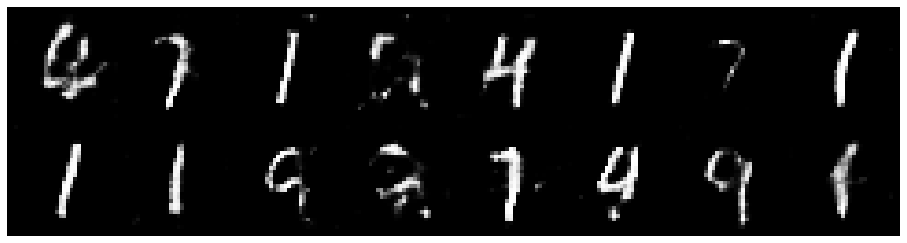

Epoch: [16/50], Batch Num: [0/600]
Discriminator Loss: 0.0665, Generator Loss: 4.3310
D(x): 0.9862, D(G(z)): 0.0405


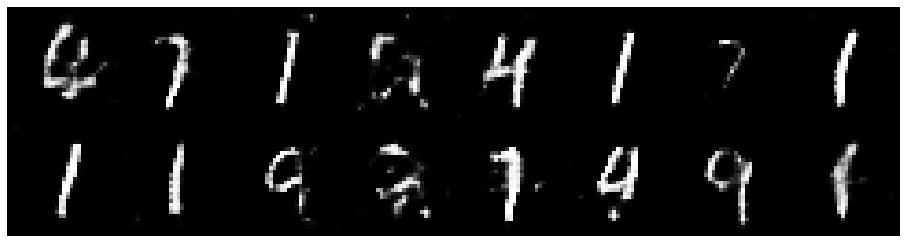

Epoch: [16/50], Batch Num: [100/600]
Discriminator Loss: 0.1218, Generator Loss: 5.2693
D(x): 0.9528, D(G(z)): 0.0227


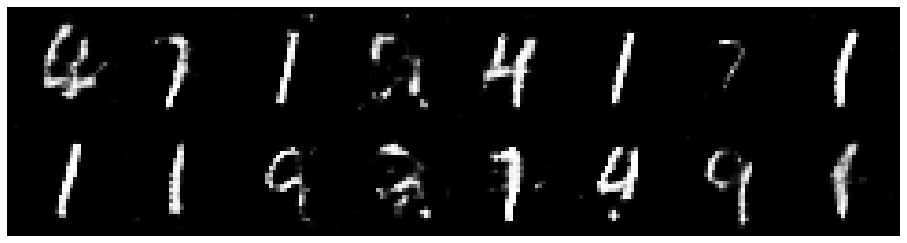

Epoch: [16/50], Batch Num: [200/600]
Discriminator Loss: 0.1548, Generator Loss: 5.3389
D(x): 0.9762, D(G(z)): 0.0914


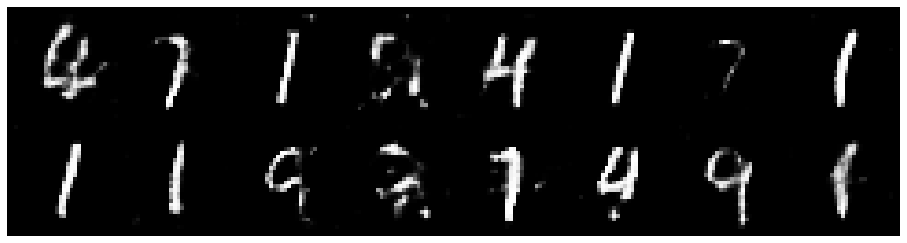

Epoch: [16/50], Batch Num: [300/600]
Discriminator Loss: 0.2441, Generator Loss: 5.5373
D(x): 0.9124, D(G(z)): 0.0317


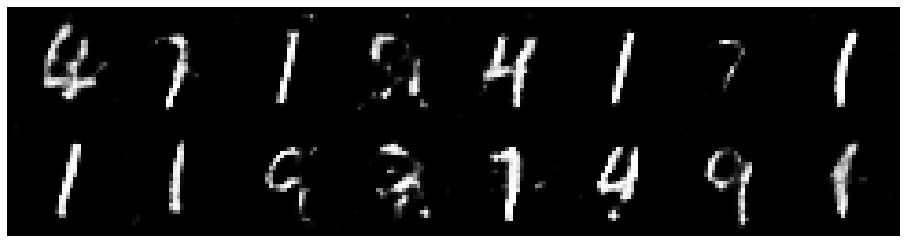

Epoch: [16/50], Batch Num: [400/600]
Discriminator Loss: 0.1853, Generator Loss: 4.4236
D(x): 0.9354, D(G(z)): 0.0372


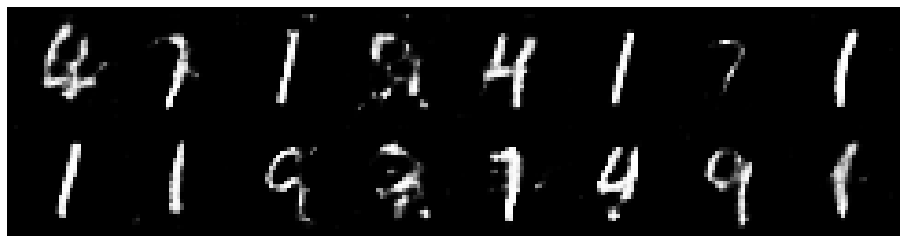

Epoch: [16/50], Batch Num: [500/600]
Discriminator Loss: 0.1512, Generator Loss: 4.2479
D(x): 0.9632, D(G(z)): 0.0538


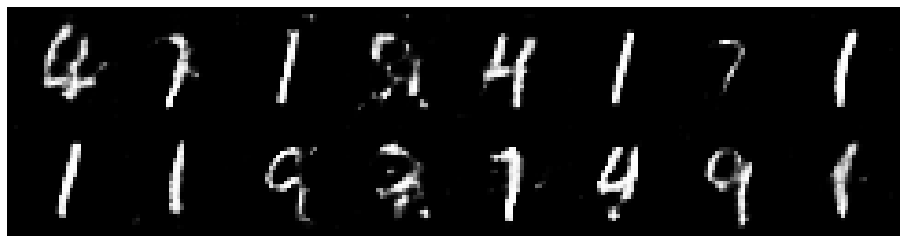

Epoch: [17/50], Batch Num: [0/600]
Discriminator Loss: 0.1306, Generator Loss: 5.3929
D(x): 0.9577, D(G(z)): 0.0366


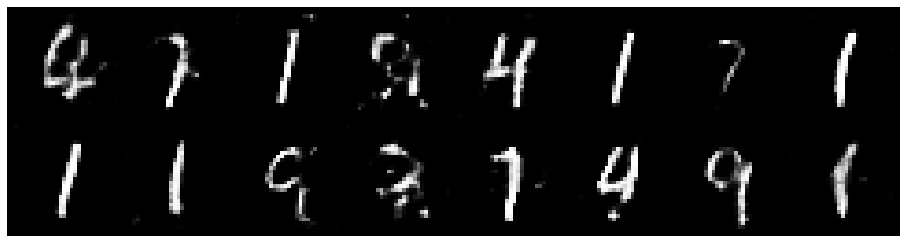

Epoch: [17/50], Batch Num: [100/600]
Discriminator Loss: 0.1369, Generator Loss: 5.4752
D(x): 0.9608, D(G(z)): 0.0674


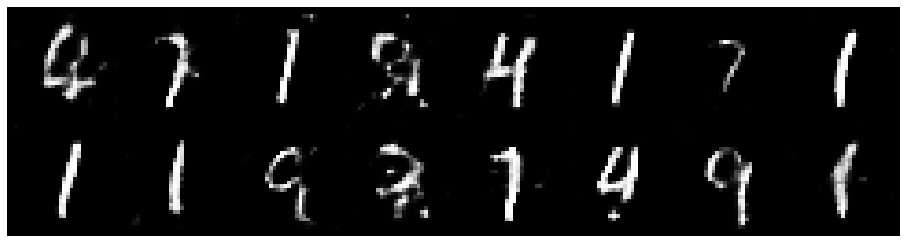

Epoch: [17/50], Batch Num: [200/600]
Discriminator Loss: 0.2906, Generator Loss: 4.7982
D(x): 0.9195, D(G(z)): 0.0741


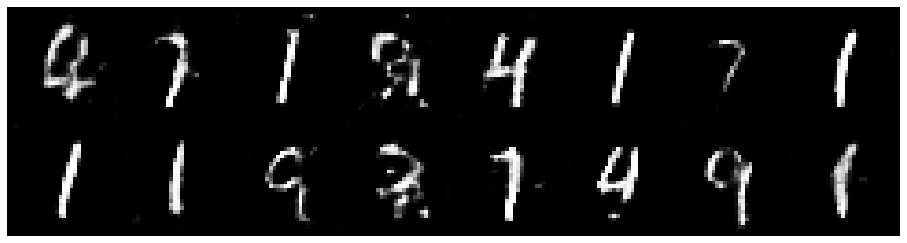

Epoch: [17/50], Batch Num: [300/600]
Discriminator Loss: 0.1427, Generator Loss: 4.2720
D(x): 0.9586, D(G(z)): 0.0552


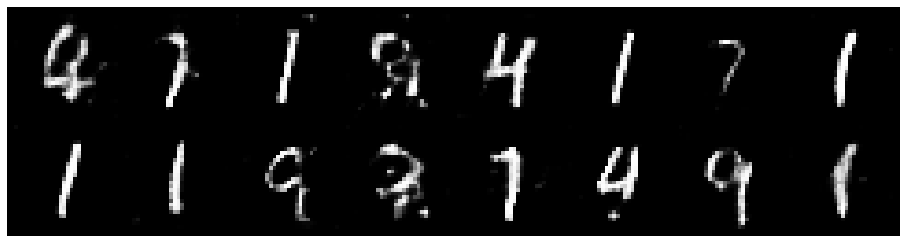

Epoch: [17/50], Batch Num: [400/600]
Discriminator Loss: 0.1032, Generator Loss: 4.9144
D(x): 0.9652, D(G(z)): 0.0428


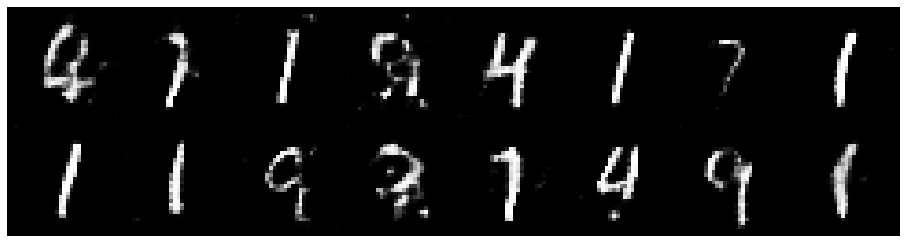

Epoch: [17/50], Batch Num: [500/600]
Discriminator Loss: 0.1970, Generator Loss: 5.1800
D(x): 0.9279, D(G(z)): 0.0403


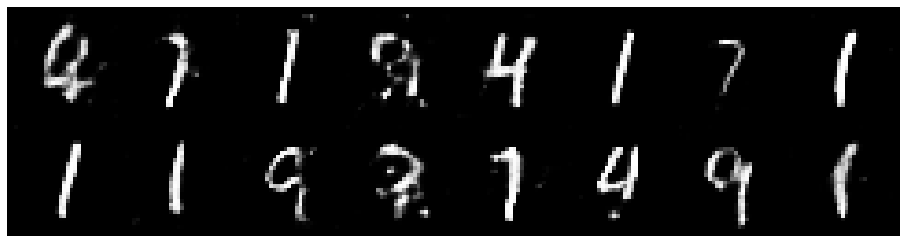

Epoch: [18/50], Batch Num: [0/600]
Discriminator Loss: 0.0668, Generator Loss: 5.3998
D(x): 0.9735, D(G(z)): 0.0251


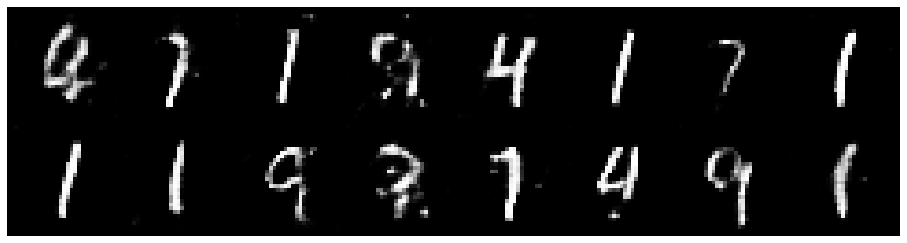

Epoch: [18/50], Batch Num: [100/600]
Discriminator Loss: 0.1406, Generator Loss: 5.0953
D(x): 0.9424, D(G(z)): 0.0390


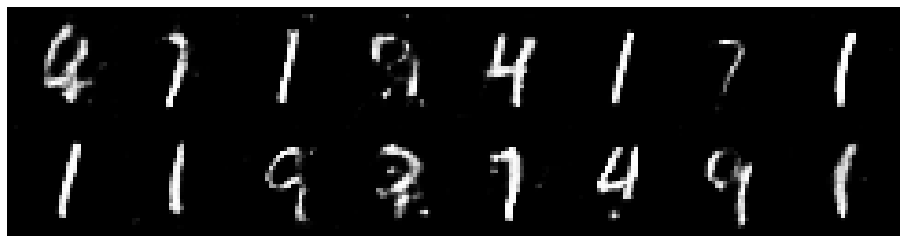

Epoch: [18/50], Batch Num: [200/600]
Discriminator Loss: 0.1259, Generator Loss: 5.8410
D(x): 0.9621, D(G(z)): 0.0487


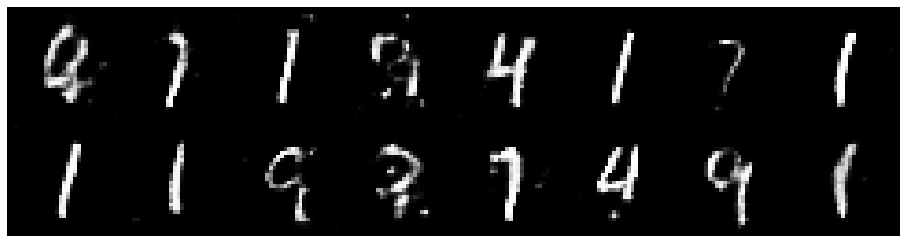

Epoch: [18/50], Batch Num: [300/600]
Discriminator Loss: 0.1238, Generator Loss: 4.7901
D(x): 0.9900, D(G(z)): 0.0745


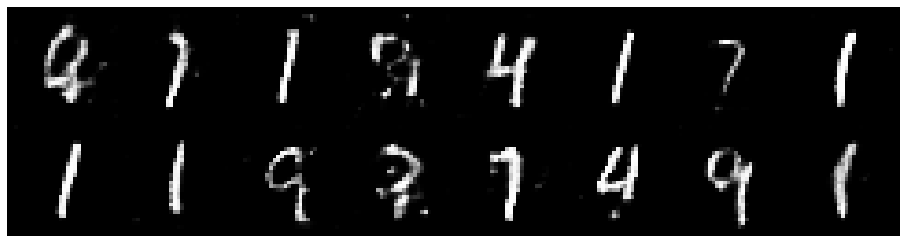

Epoch: [18/50], Batch Num: [400/600]
Discriminator Loss: 0.1366, Generator Loss: 5.7276
D(x): 0.9575, D(G(z)): 0.0400


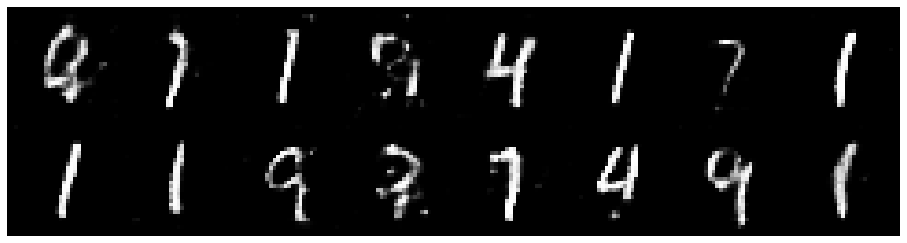

Epoch: [18/50], Batch Num: [500/600]
Discriminator Loss: 0.1446, Generator Loss: 4.7928
D(x): 0.9563, D(G(z)): 0.0585


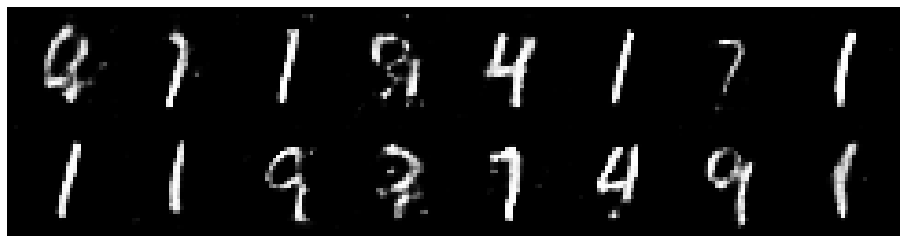

Epoch: [19/50], Batch Num: [0/600]
Discriminator Loss: 0.1350, Generator Loss: 5.8900
D(x): 0.9421, D(G(z)): 0.0261


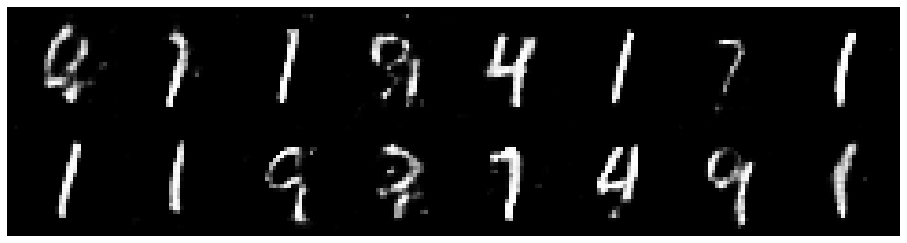

Epoch: [19/50], Batch Num: [100/600]
Discriminator Loss: 0.1479, Generator Loss: 5.4639
D(x): 0.9557, D(G(z)): 0.0563


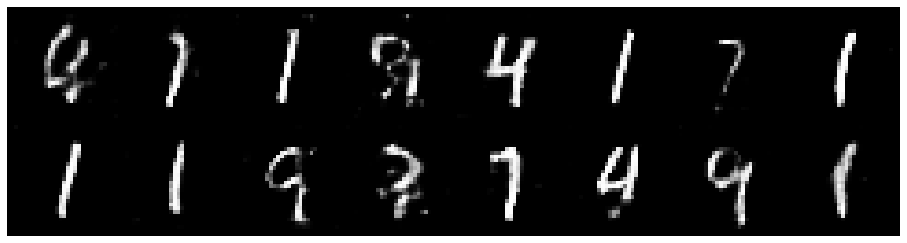

Epoch: [19/50], Batch Num: [200/600]
Discriminator Loss: 0.1690, Generator Loss: 5.4684
D(x): 0.9410, D(G(z)): 0.0369


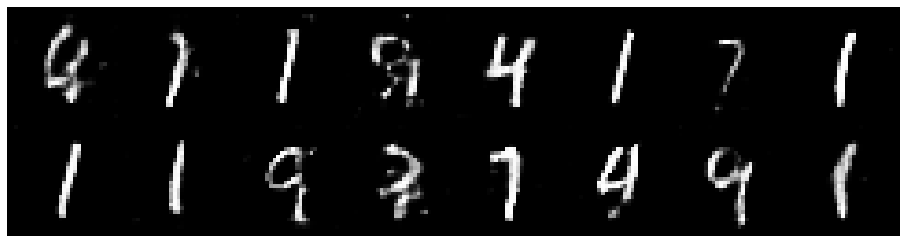

Epoch: [19/50], Batch Num: [300/600]
Discriminator Loss: 0.1159, Generator Loss: 5.4204
D(x): 0.9520, D(G(z)): 0.0358


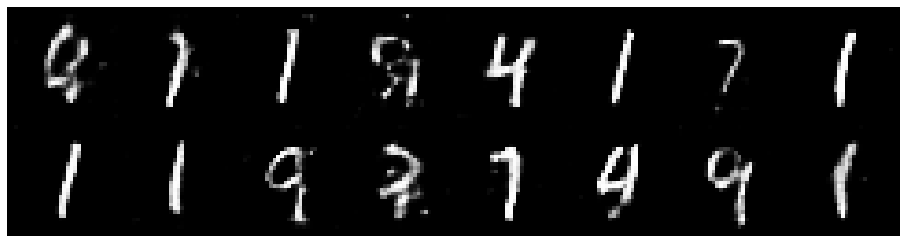

Epoch: [19/50], Batch Num: [400/600]
Discriminator Loss: 0.1008, Generator Loss: 5.4938
D(x): 0.9755, D(G(z)): 0.0522


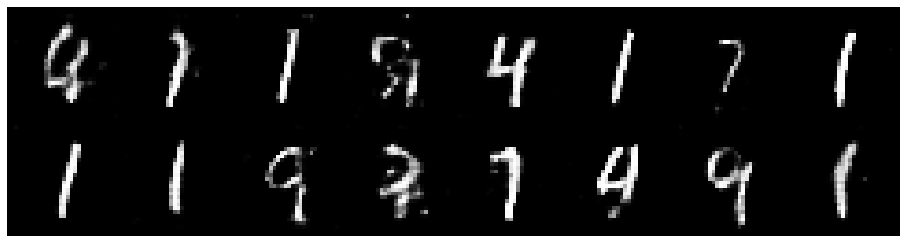

Epoch: [19/50], Batch Num: [500/600]
Discriminator Loss: 0.1065, Generator Loss: 5.6650
D(x): 0.9554, D(G(z)): 0.0333


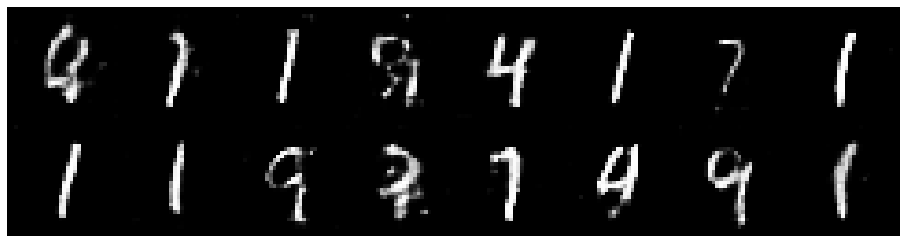

Epoch: [20/50], Batch Num: [0/600]
Discriminator Loss: 0.2251, Generator Loss: 5.3469
D(x): 0.9380, D(G(z)): 0.0883


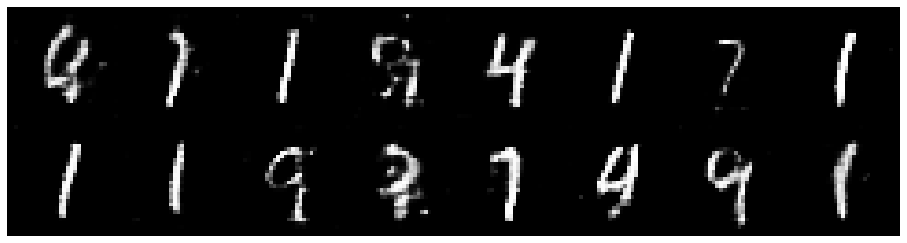

Epoch: [20/50], Batch Num: [100/600]
Discriminator Loss: 0.1008, Generator Loss: 5.6910
D(x): 0.9762, D(G(z)): 0.0408


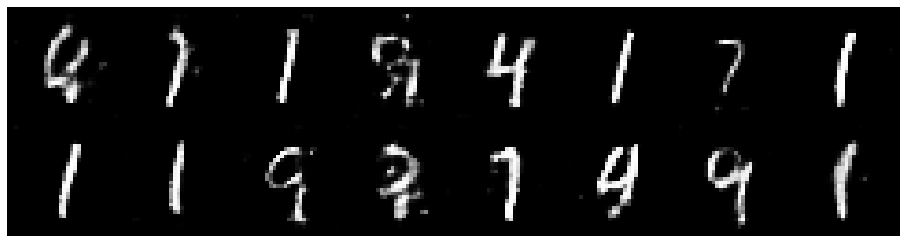

Epoch: [20/50], Batch Num: [200/600]
Discriminator Loss: 0.1490, Generator Loss: 4.3145
D(x): 0.9663, D(G(z)): 0.0630


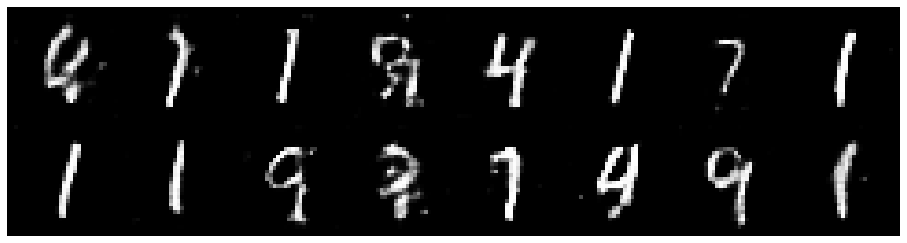

Epoch: [20/50], Batch Num: [300/600]
Discriminator Loss: 0.1881, Generator Loss: 5.6235
D(x): 0.9349, D(G(z)): 0.0435


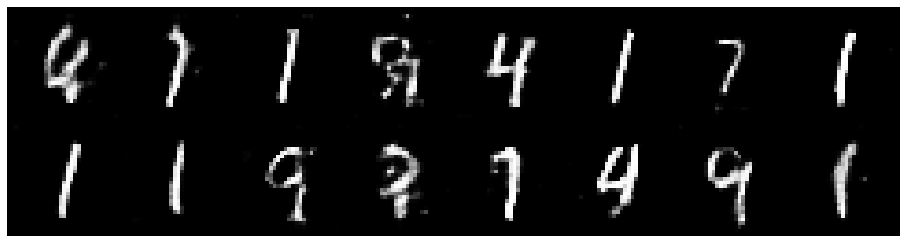

Epoch: [20/50], Batch Num: [400/600]
Discriminator Loss: 0.1184, Generator Loss: 5.8543
D(x): 0.9588, D(G(z)): 0.0218


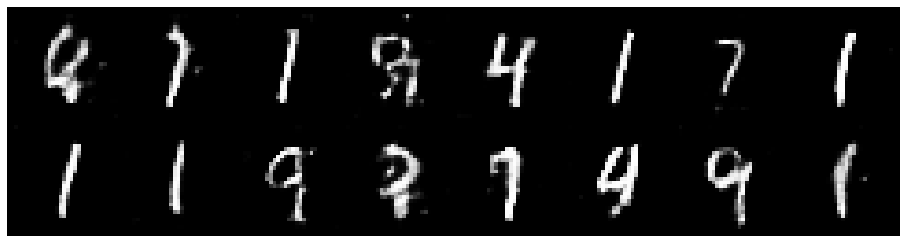

Epoch: [20/50], Batch Num: [500/600]
Discriminator Loss: 0.1818, Generator Loss: 4.7621
D(x): 0.9407, D(G(z)): 0.0584


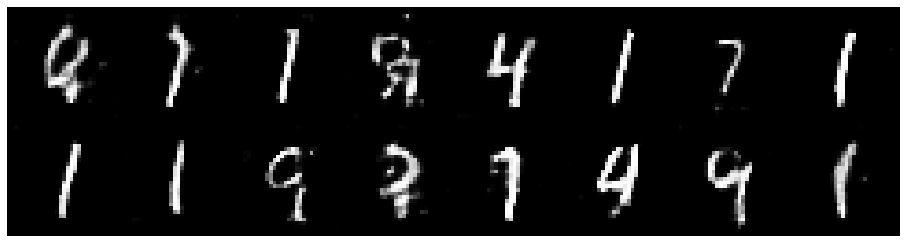

Epoch: [21/50], Batch Num: [0/600]
Discriminator Loss: 0.1008, Generator Loss: 5.1501
D(x): 0.9625, D(G(z)): 0.0294


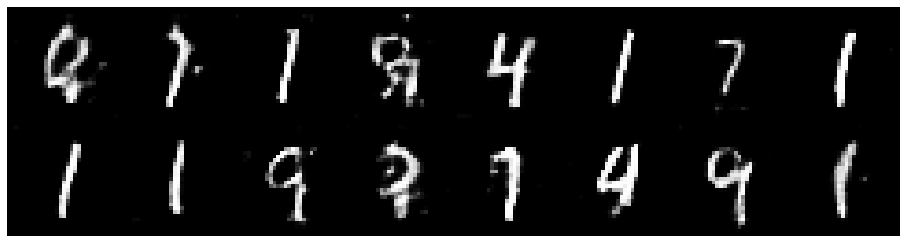

Epoch: [21/50], Batch Num: [100/600]
Discriminator Loss: 0.2779, Generator Loss: 7.4272
D(x): 0.9175, D(G(z)): 0.0389


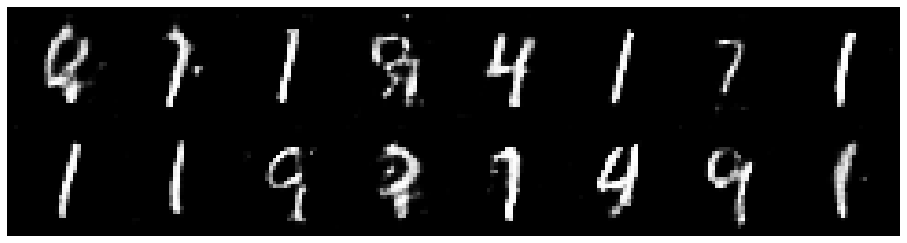

Epoch: [21/50], Batch Num: [200/600]
Discriminator Loss: 0.1950, Generator Loss: 5.6898
D(x): 0.9565, D(G(z)): 0.0762


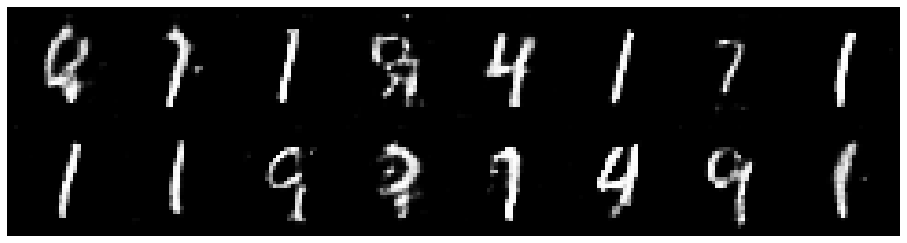

Epoch: [21/50], Batch Num: [300/600]
Discriminator Loss: 0.1461, Generator Loss: 5.2745
D(x): 0.9567, D(G(z)): 0.0442


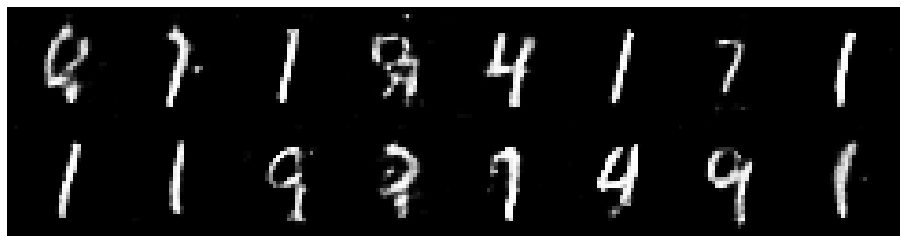

Epoch: [21/50], Batch Num: [400/600]
Discriminator Loss: 0.1150, Generator Loss: 5.2805
D(x): 0.9793, D(G(z)): 0.0516


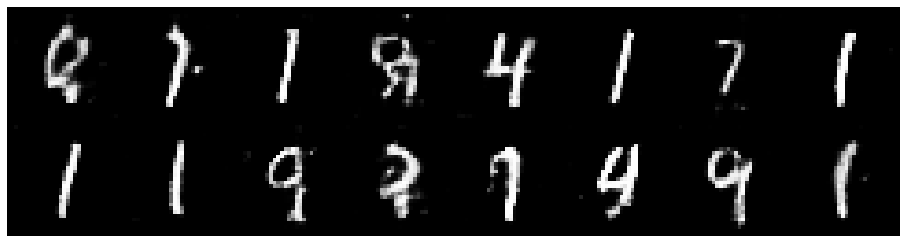

Epoch: [21/50], Batch Num: [500/600]
Discriminator Loss: 0.1470, Generator Loss: 5.3301
D(x): 0.9579, D(G(z)): 0.0498


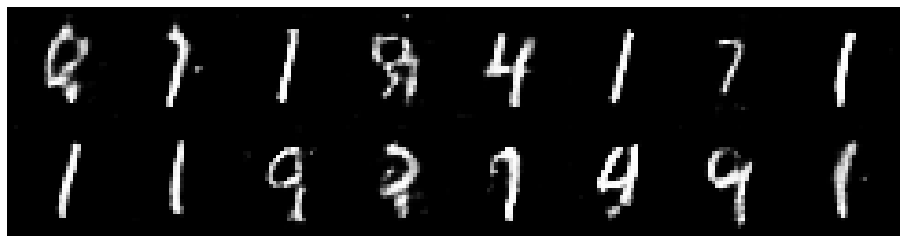

Epoch: [22/50], Batch Num: [0/600]
Discriminator Loss: 0.0920, Generator Loss: 6.1785
D(x): 0.9696, D(G(z)): 0.0376


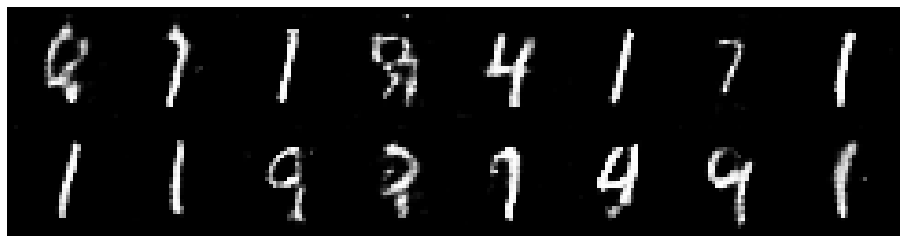

Epoch: [22/50], Batch Num: [100/600]
Discriminator Loss: 0.1711, Generator Loss: 5.2243
D(x): 0.9493, D(G(z)): 0.0443


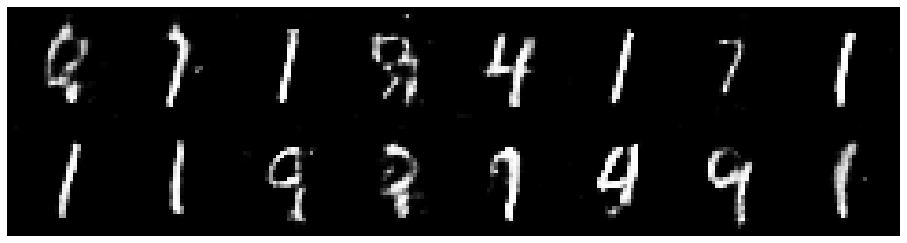

Epoch: [22/50], Batch Num: [200/600]
Discriminator Loss: 0.1042, Generator Loss: 5.3718
D(x): 0.9551, D(G(z)): 0.0270


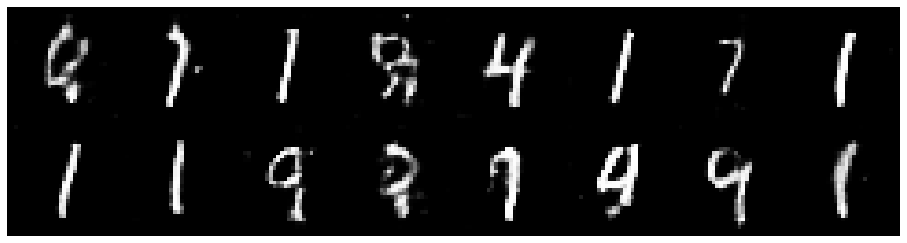

Epoch: [22/50], Batch Num: [300/600]
Discriminator Loss: 0.1277, Generator Loss: 5.5808
D(x): 0.9654, D(G(z)): 0.0563


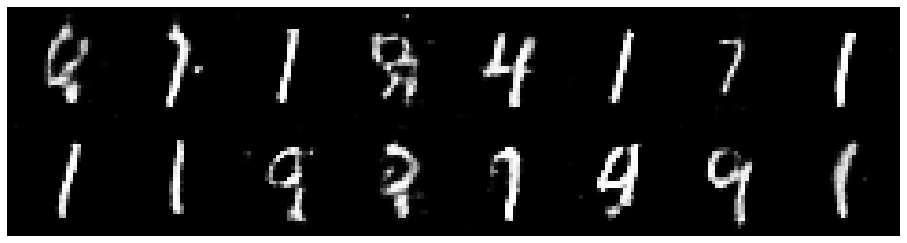

Epoch: [22/50], Batch Num: [400/600]
Discriminator Loss: 0.1600, Generator Loss: 4.7522
D(x): 0.9694, D(G(z)): 0.0815


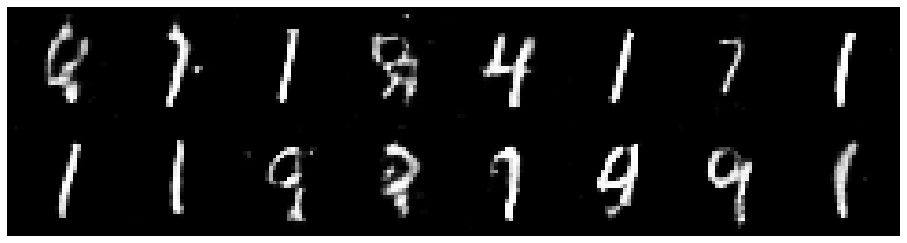

Epoch: [22/50], Batch Num: [500/600]
Discriminator Loss: 0.2705, Generator Loss: 5.0340
D(x): 0.9116, D(G(z)): 0.0575


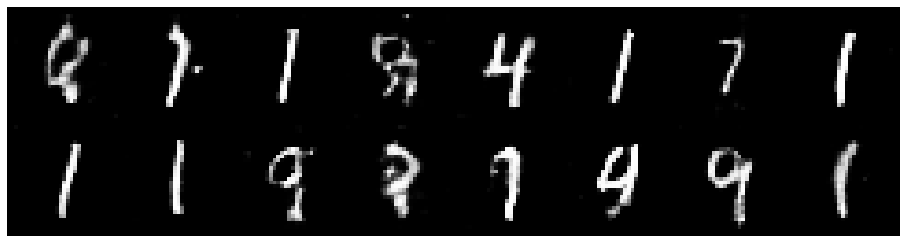

Epoch: [23/50], Batch Num: [0/600]
Discriminator Loss: 0.0812, Generator Loss: 5.7787
D(x): 0.9781, D(G(z)): 0.0416


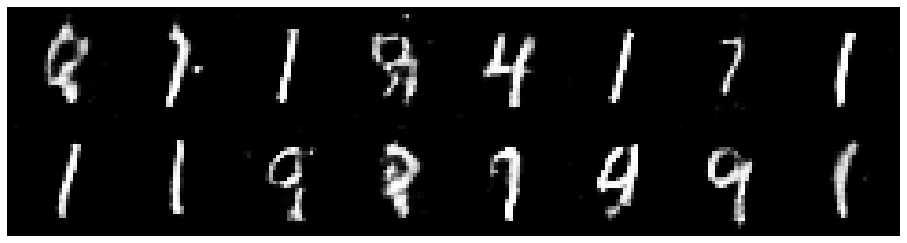

Epoch: [23/50], Batch Num: [100/600]
Discriminator Loss: 0.2341, Generator Loss: 5.8540
D(x): 0.9107, D(G(z)): 0.0416


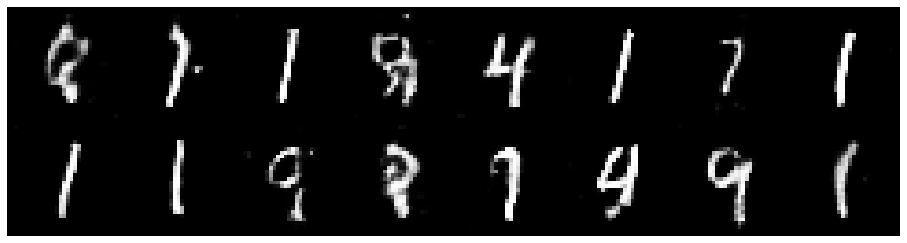

Epoch: [23/50], Batch Num: [200/600]
Discriminator Loss: 0.1937, Generator Loss: 5.9392
D(x): 0.9474, D(G(z)): 0.0495


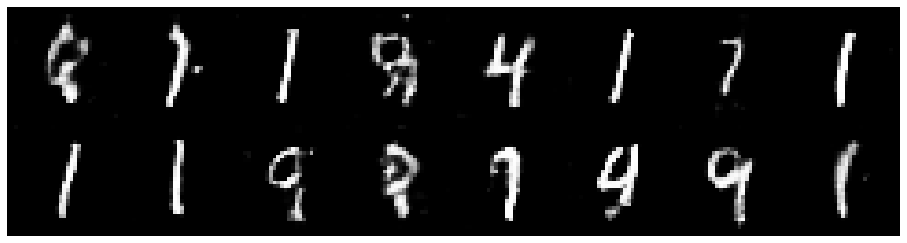

Epoch: [23/50], Batch Num: [300/600]
Discriminator Loss: 0.1335, Generator Loss: 5.4490
D(x): 0.9674, D(G(z)): 0.0517


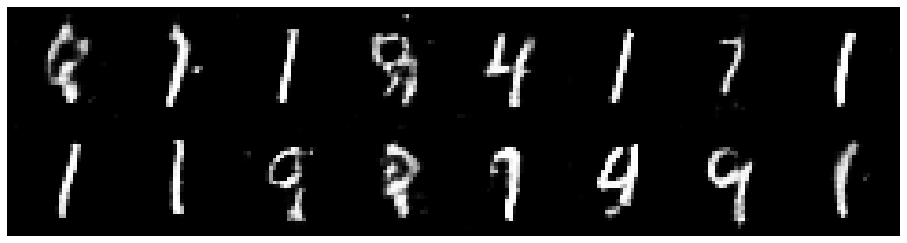

Epoch: [23/50], Batch Num: [400/600]
Discriminator Loss: 0.1948, Generator Loss: 5.6321
D(x): 0.9603, D(G(z)): 0.0877


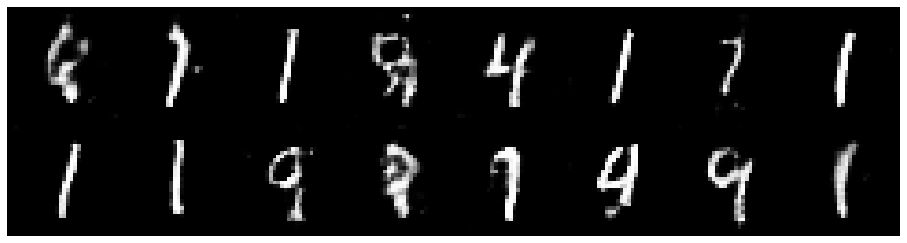

Epoch: [23/50], Batch Num: [500/600]
Discriminator Loss: 0.1700, Generator Loss: 5.2923
D(x): 0.9491, D(G(z)): 0.0550


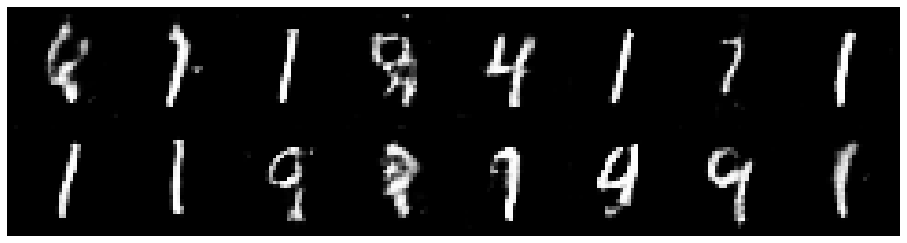

Epoch: [24/50], Batch Num: [0/600]
Discriminator Loss: 0.0898, Generator Loss: 5.1397
D(x): 0.9712, D(G(z)): 0.0435


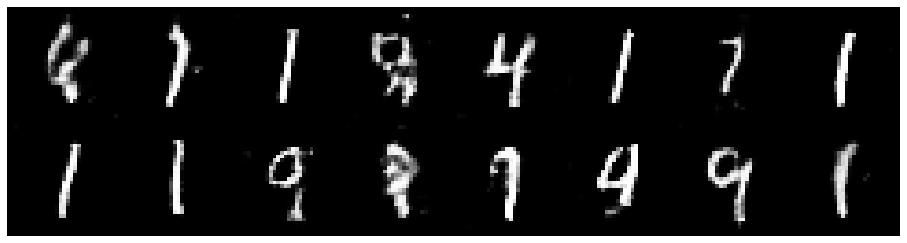

Epoch: [24/50], Batch Num: [100/600]
Discriminator Loss: 0.1360, Generator Loss: 5.7181
D(x): 0.9457, D(G(z)): 0.0223


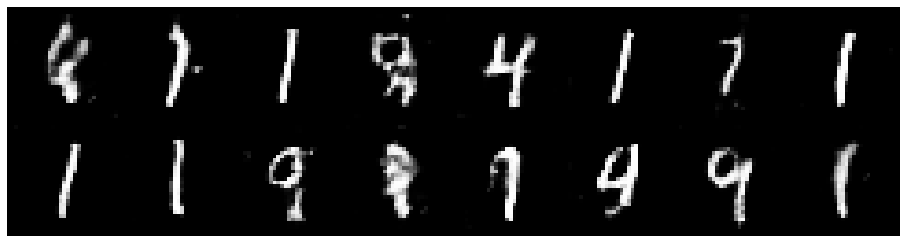

Epoch: [24/50], Batch Num: [200/600]
Discriminator Loss: 0.1021, Generator Loss: 5.4546
D(x): 0.9797, D(G(z)): 0.0627


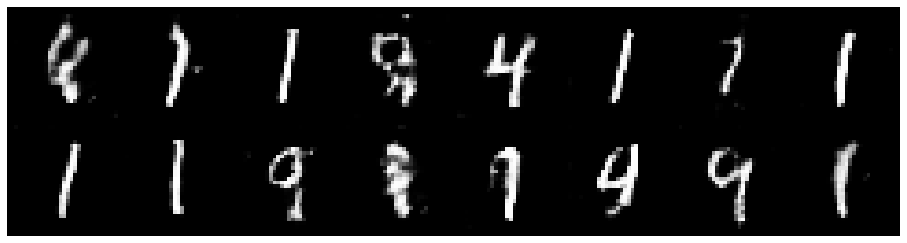

Epoch: [24/50], Batch Num: [300/600]
Discriminator Loss: 0.1315, Generator Loss: 5.8468
D(x): 0.9557, D(G(z)): 0.0523


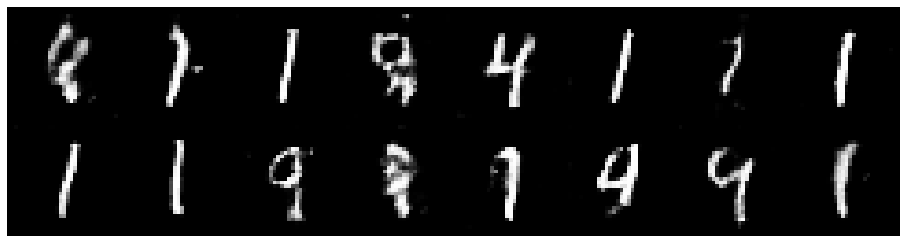

Epoch: [24/50], Batch Num: [400/600]
Discriminator Loss: 0.1804, Generator Loss: 5.8879
D(x): 0.9209, D(G(z)): 0.0225


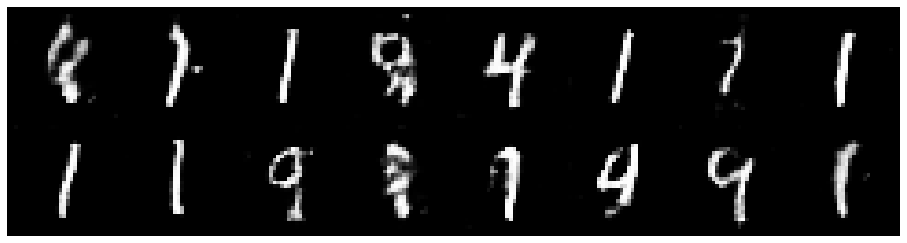

Epoch: [24/50], Batch Num: [500/600]
Discriminator Loss: 0.1926, Generator Loss: 5.3643
D(x): 0.9290, D(G(z)): 0.0505


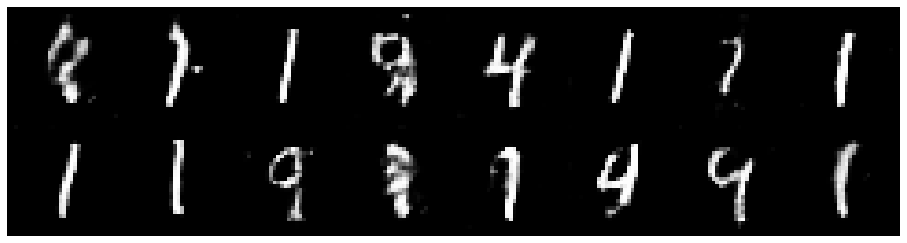

Epoch: [25/50], Batch Num: [0/600]
Discriminator Loss: 0.1062, Generator Loss: 5.9879
D(x): 0.9535, D(G(z)): 0.0216


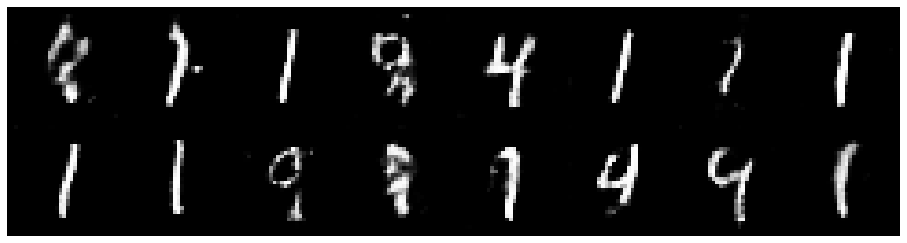

Epoch: [25/50], Batch Num: [100/600]
Discriminator Loss: 0.1341, Generator Loss: 5.7513
D(x): 0.9378, D(G(z)): 0.0302


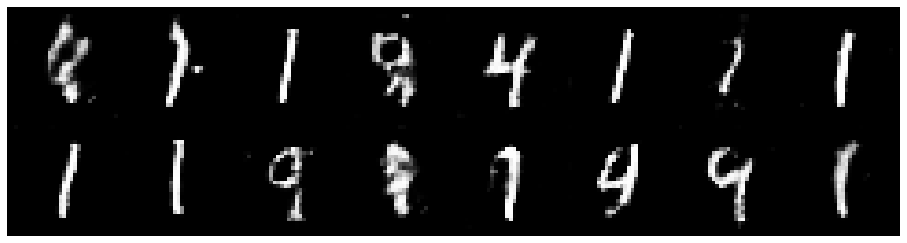

Epoch: [25/50], Batch Num: [200/600]
Discriminator Loss: 0.1950, Generator Loss: 5.3775
D(x): 0.9226, D(G(z)): 0.0513


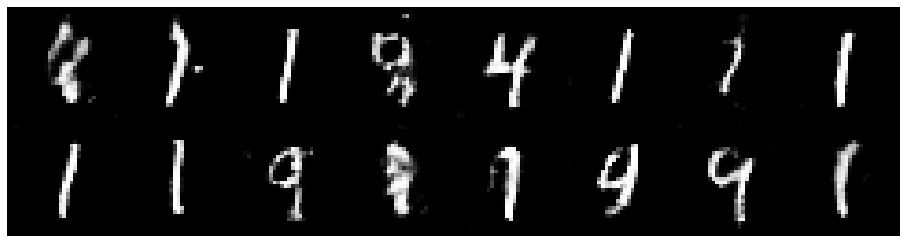

Epoch: [25/50], Batch Num: [300/600]
Discriminator Loss: 0.1227, Generator Loss: 5.2978
D(x): 0.9749, D(G(z)): 0.0558


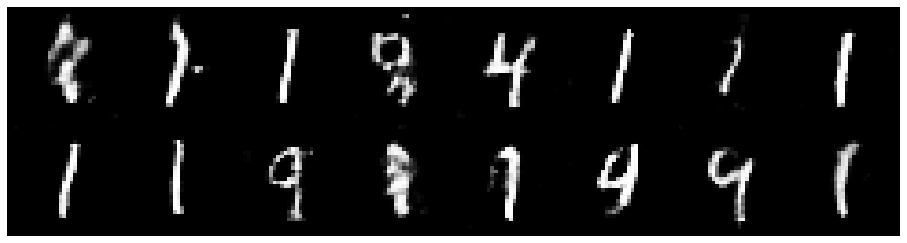

Epoch: [25/50], Batch Num: [400/600]
Discriminator Loss: 0.1328, Generator Loss: 4.6101
D(x): 0.9547, D(G(z)): 0.0549


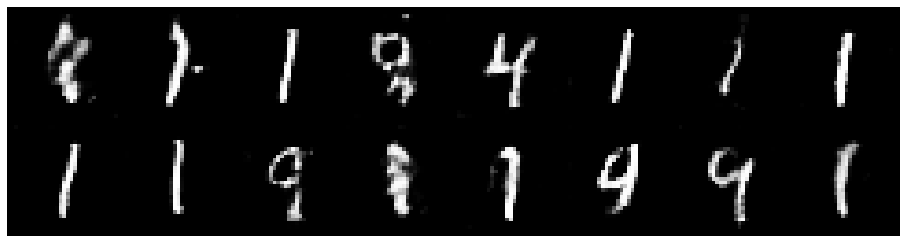

Epoch: [25/50], Batch Num: [500/600]
Discriminator Loss: 0.1107, Generator Loss: 5.3183
D(x): 0.9599, D(G(z)): 0.0260


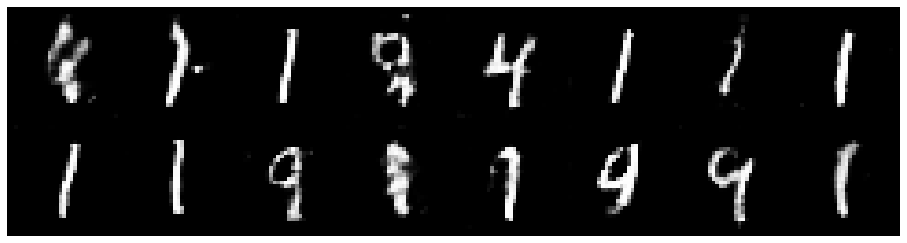

Epoch: [26/50], Batch Num: [0/600]
Discriminator Loss: 0.1890, Generator Loss: 6.2069
D(x): 0.9318, D(G(z)): 0.0482


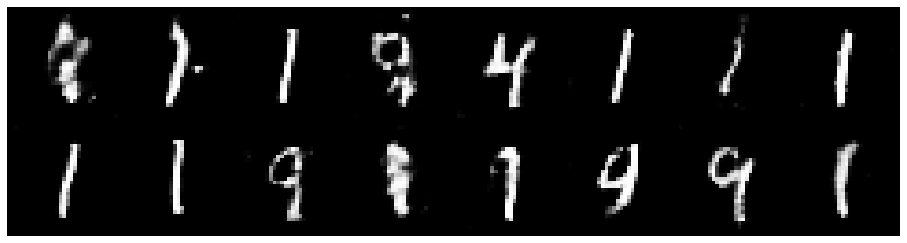

Epoch: [26/50], Batch Num: [100/600]
Discriminator Loss: 0.1693, Generator Loss: 6.7516
D(x): 0.9460, D(G(z)): 0.0363


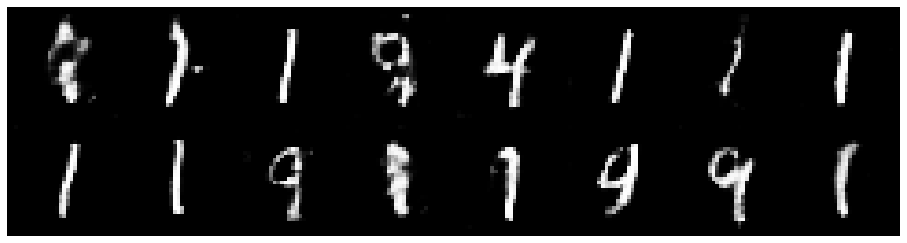

Epoch: [26/50], Batch Num: [200/600]
Discriminator Loss: 0.1124, Generator Loss: 6.5772
D(x): 0.9707, D(G(z)): 0.0418


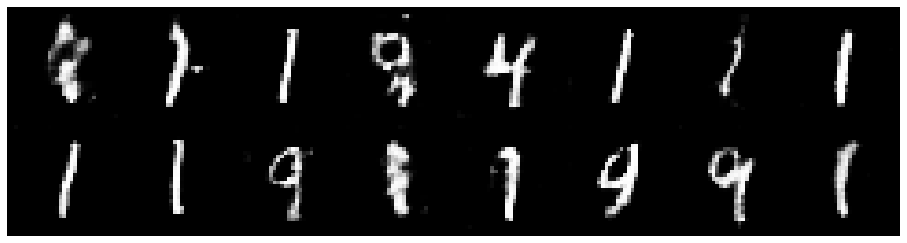

Epoch: [26/50], Batch Num: [300/600]
Discriminator Loss: 0.1843, Generator Loss: 6.1985
D(x): 0.9257, D(G(z)): 0.0183


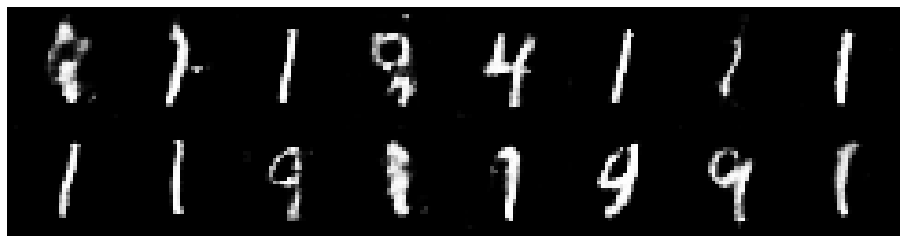

Epoch: [26/50], Batch Num: [400/600]
Discriminator Loss: 0.1564, Generator Loss: 5.4561
D(x): 0.9709, D(G(z)): 0.0644


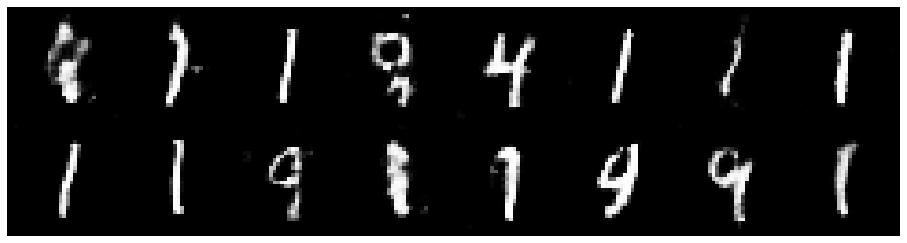

Epoch: [26/50], Batch Num: [500/600]
Discriminator Loss: 0.1266, Generator Loss: 4.7279
D(x): 0.9881, D(G(z)): 0.0671


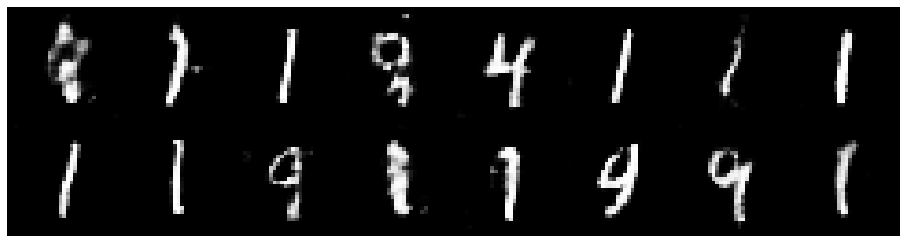

Epoch: [27/50], Batch Num: [0/600]
Discriminator Loss: 0.1375, Generator Loss: 5.9090
D(x): 0.9484, D(G(z)): 0.0369


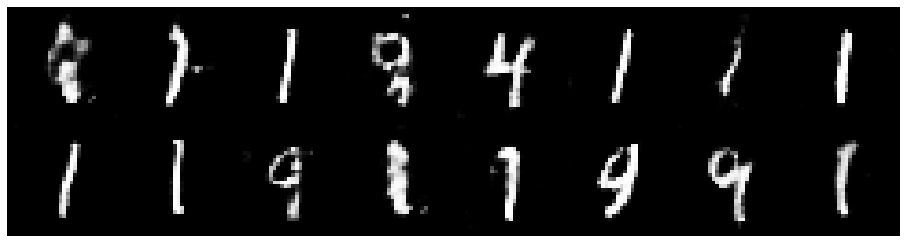

Epoch: [27/50], Batch Num: [100/600]
Discriminator Loss: 0.1697, Generator Loss: 5.6449
D(x): 0.9595, D(G(z)): 0.0508


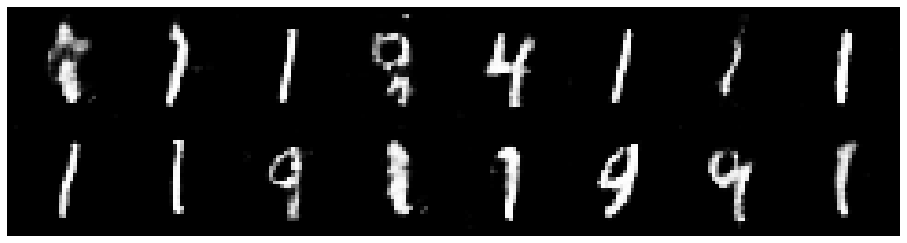

Epoch: [27/50], Batch Num: [200/600]
Discriminator Loss: 0.1612, Generator Loss: 5.8707
D(x): 0.9551, D(G(z)): 0.0686


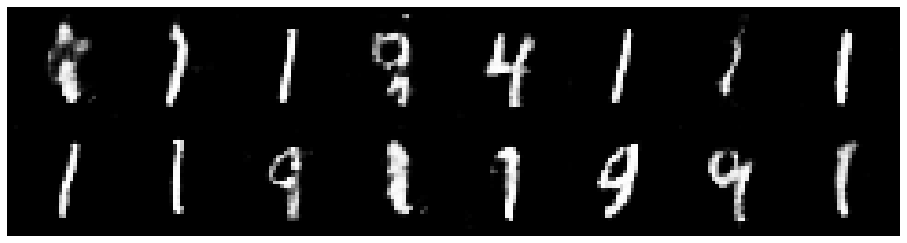

Epoch: [27/50], Batch Num: [300/600]
Discriminator Loss: 0.0742, Generator Loss: 6.7163
D(x): 0.9708, D(G(z)): 0.0212


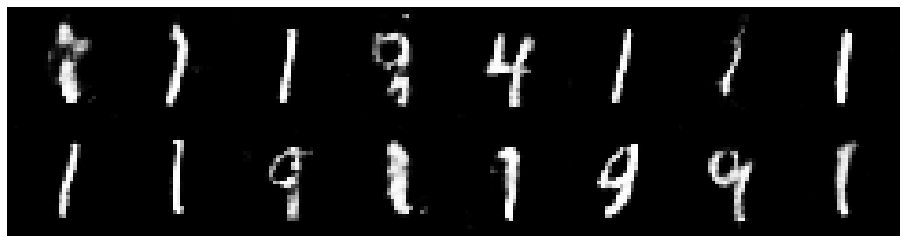

Epoch: [27/50], Batch Num: [400/600]
Discriminator Loss: 0.1515, Generator Loss: 5.8081
D(x): 0.9492, D(G(z)): 0.0338


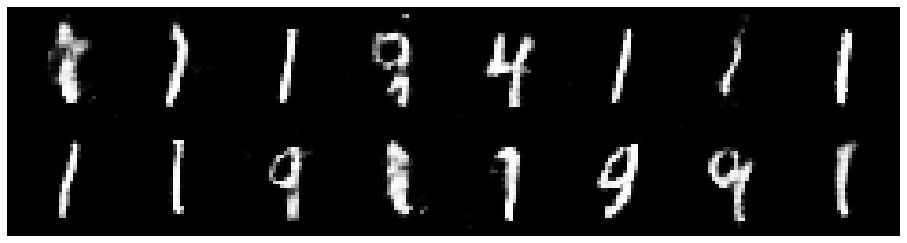

Epoch: [27/50], Batch Num: [500/600]
Discriminator Loss: 0.1588, Generator Loss: 5.6880
D(x): 0.9473, D(G(z)): 0.0259


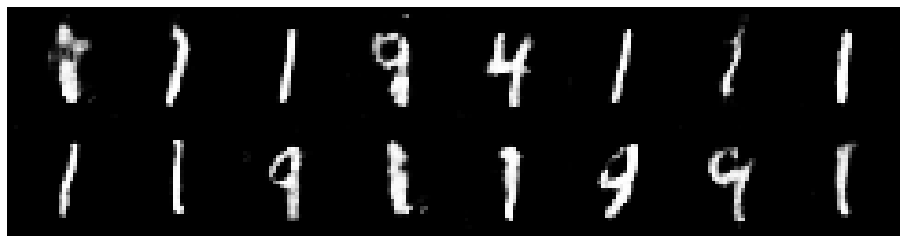

Epoch: [29/50], Batch Num: [300/600]
Discriminator Loss: 0.0983, Generator Loss: 5.6022
D(x): 0.9727, D(G(z)): 0.0388


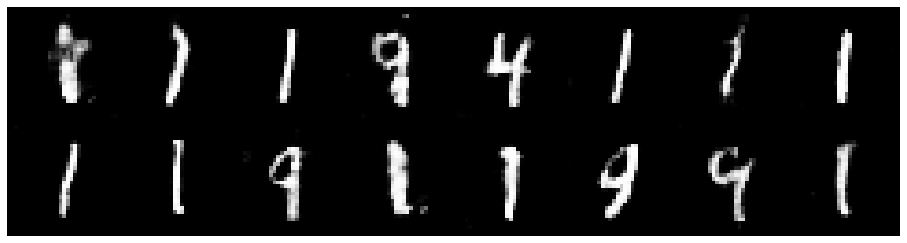

Epoch: [29/50], Batch Num: [400/600]
Discriminator Loss: 0.2252, Generator Loss: 5.8605
D(x): 0.9041, D(G(z)): 0.0239


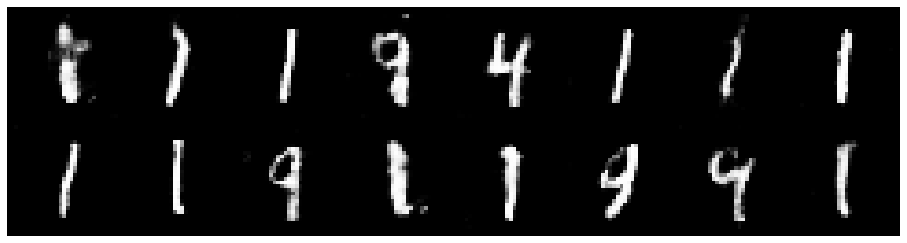

Epoch: [29/50], Batch Num: [500/600]
Discriminator Loss: 0.1490, Generator Loss: 6.0532
D(x): 0.9340, D(G(z)): 0.0261


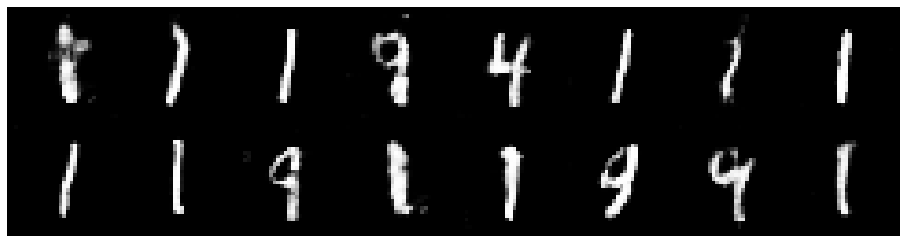

Epoch: [30/50], Batch Num: [0/600]
Discriminator Loss: 0.0522, Generator Loss: 6.0146
D(x): 0.9804, D(G(z)): 0.0228


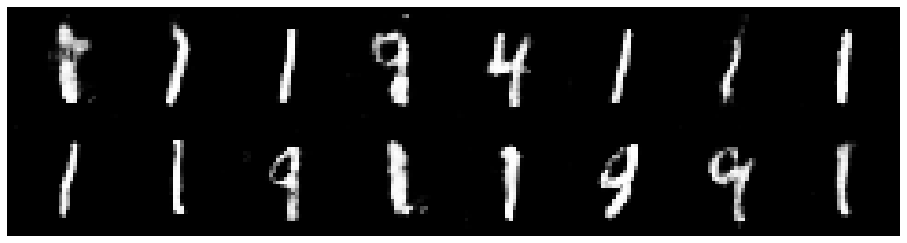

Epoch: [30/50], Batch Num: [100/600]
Discriminator Loss: 0.0815, Generator Loss: 6.2318
D(x): 0.9898, D(G(z)): 0.0553


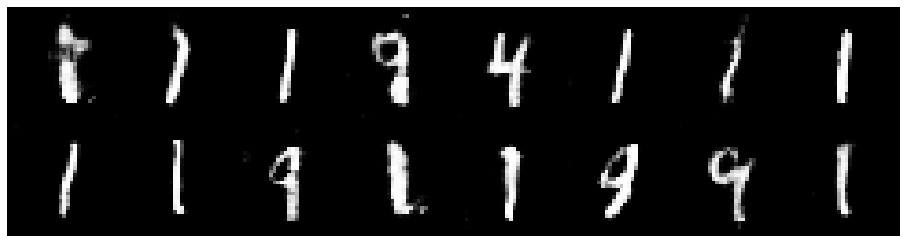

Epoch: [30/50], Batch Num: [200/600]
Discriminator Loss: 0.1708, Generator Loss: 5.4556
D(x): 0.9705, D(G(z)): 0.0698


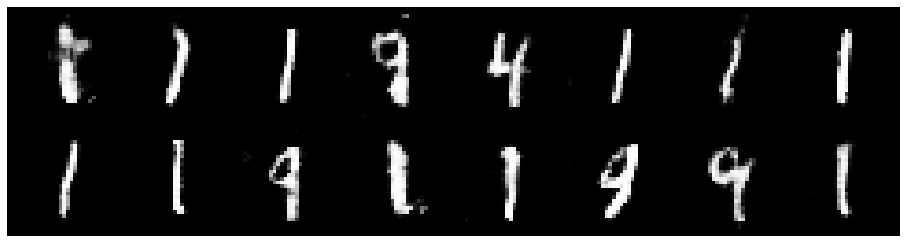

Epoch: [30/50], Batch Num: [300/600]
Discriminator Loss: 0.1241, Generator Loss: 5.3326
D(x): 0.9568, D(G(z)): 0.0262


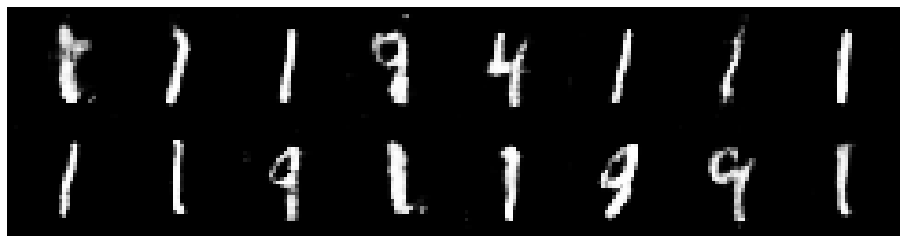

Epoch: [30/50], Batch Num: [400/600]
Discriminator Loss: 0.1384, Generator Loss: 6.1561
D(x): 0.9562, D(G(z)): 0.0523


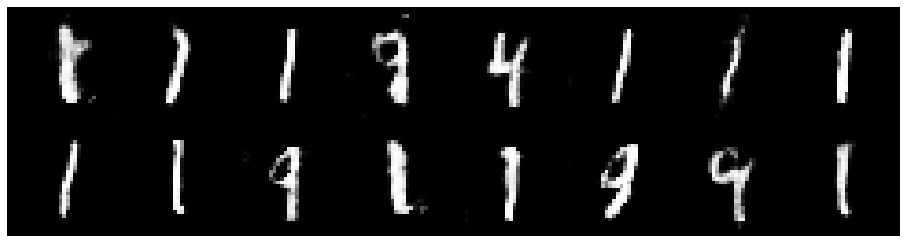

Epoch: [30/50], Batch Num: [500/600]
Discriminator Loss: 0.1292, Generator Loss: 5.8701
D(x): 0.9548, D(G(z)): 0.0444


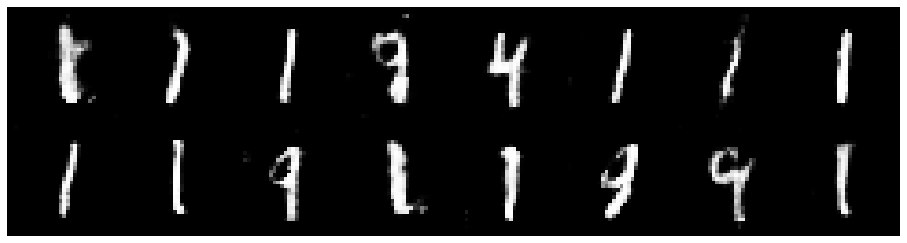

Epoch: [31/50], Batch Num: [0/600]
Discriminator Loss: 0.0802, Generator Loss: 5.9316
D(x): 0.9634, D(G(z)): 0.0178


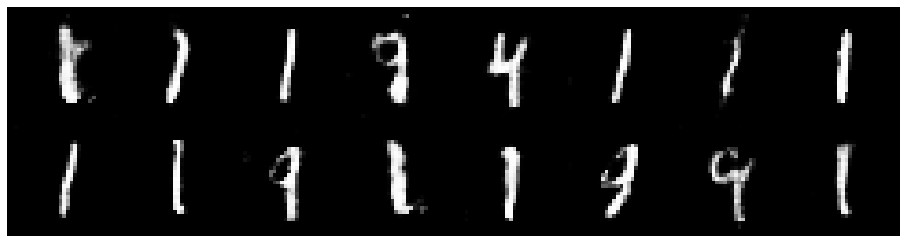

Epoch: [31/50], Batch Num: [100/600]
Discriminator Loss: 0.1980, Generator Loss: 6.0799
D(x): 0.9469, D(G(z)): 0.0373


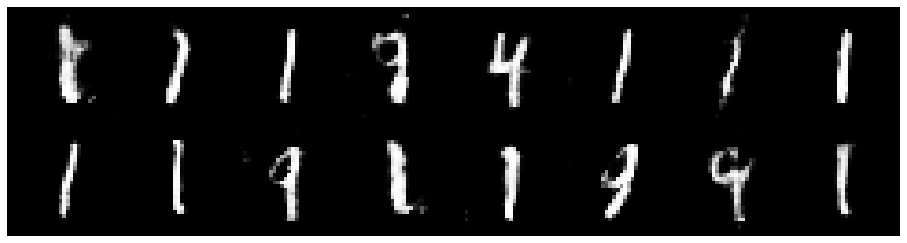

Epoch: [31/50], Batch Num: [200/600]
Discriminator Loss: 0.0543, Generator Loss: 7.0280
D(x): 0.9753, D(G(z)): 0.0142


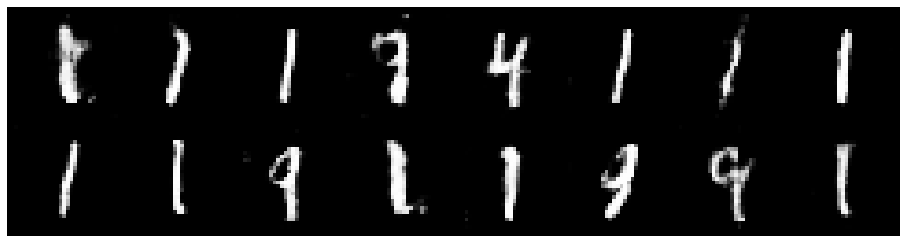

Epoch: [31/50], Batch Num: [300/600]
Discriminator Loss: 0.2991, Generator Loss: 5.9416
D(x): 0.9197, D(G(z)): 0.0584


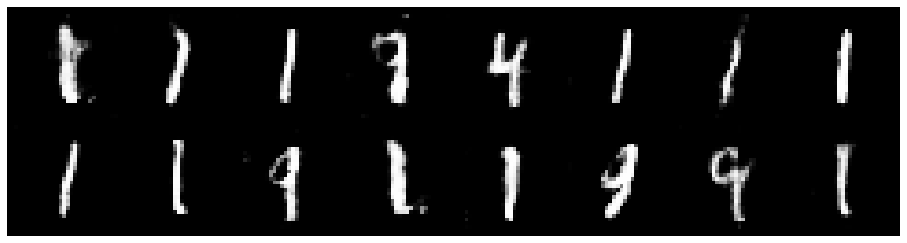

Epoch: [31/50], Batch Num: [400/600]
Discriminator Loss: 0.1622, Generator Loss: 5.8060
D(x): 0.9478, D(G(z)): 0.0390


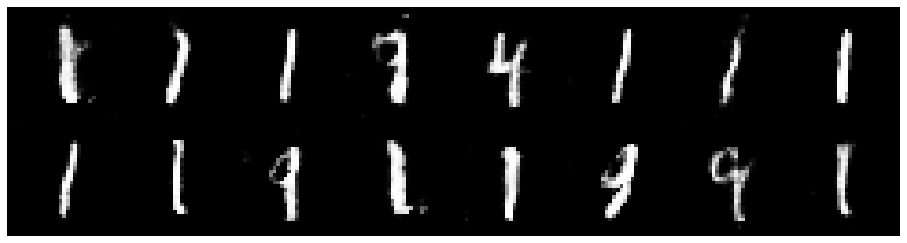

Epoch: [31/50], Batch Num: [500/600]
Discriminator Loss: 0.1364, Generator Loss: 5.7318
D(x): 0.9715, D(G(z)): 0.0712


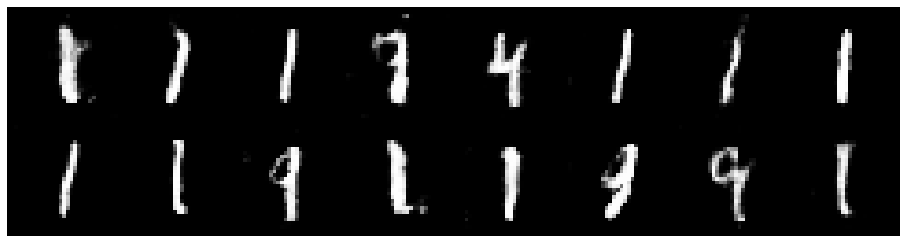

Epoch: [32/50], Batch Num: [0/600]
Discriminator Loss: 0.1433, Generator Loss: 5.6700
D(x): 0.9617, D(G(z)): 0.0363


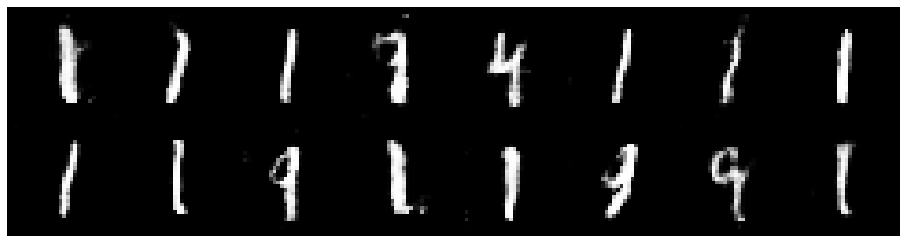

Epoch: [32/50], Batch Num: [100/600]
Discriminator Loss: 0.0774, Generator Loss: 6.3948
D(x): 0.9662, D(G(z)): 0.0204


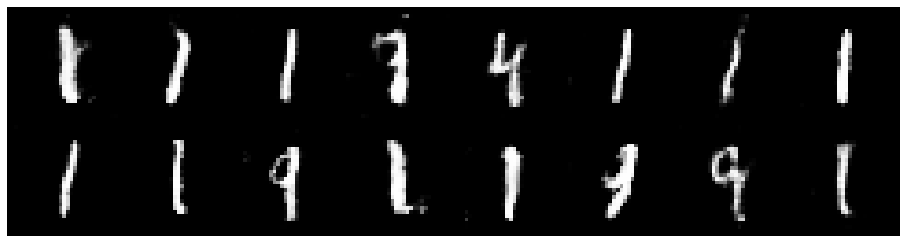

Epoch: [32/50], Batch Num: [200/600]
Discriminator Loss: 0.1718, Generator Loss: 5.4767
D(x): 0.9620, D(G(z)): 0.0831


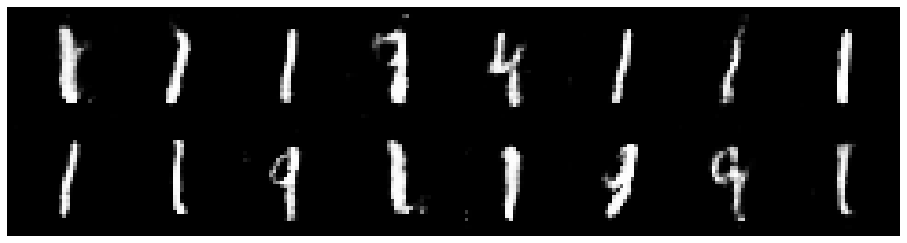

Epoch: [32/50], Batch Num: [300/600]
Discriminator Loss: 0.0671, Generator Loss: 5.7776
D(x): 0.9812, D(G(z)): 0.0225


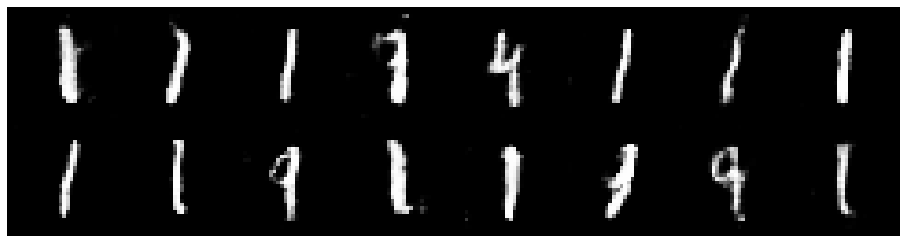

Epoch: [32/50], Batch Num: [400/600]
Discriminator Loss: 0.1745, Generator Loss: 5.6823
D(x): 0.9481, D(G(z)): 0.0450


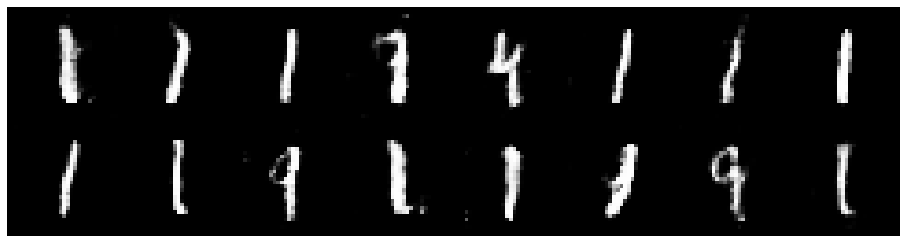

Epoch: [32/50], Batch Num: [500/600]
Discriminator Loss: 0.0653, Generator Loss: 6.2102
D(x): 0.9769, D(G(z)): 0.0221


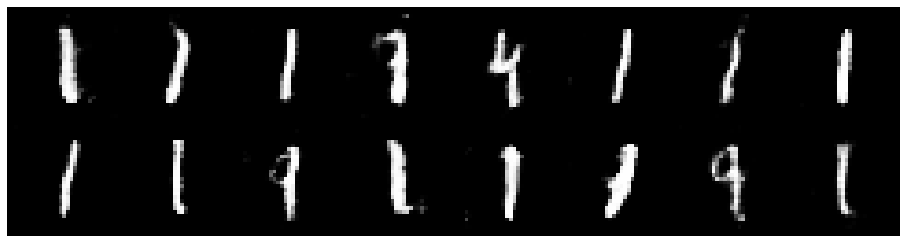

Epoch: [33/50], Batch Num: [0/600]
Discriminator Loss: 0.0991, Generator Loss: 6.0272
D(x): 0.9590, D(G(z)): 0.0149


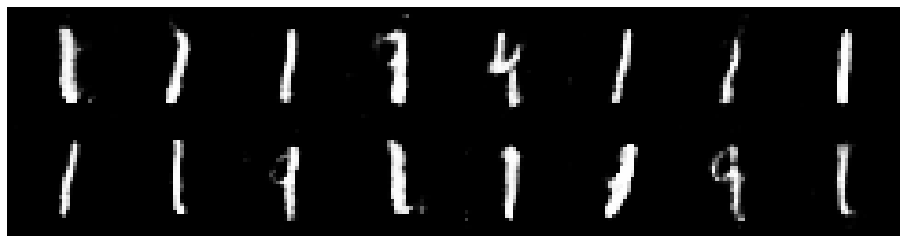

Epoch: [33/50], Batch Num: [100/600]
Discriminator Loss: 0.0963, Generator Loss: 7.8096
D(x): 0.9721, D(G(z)): 0.0306


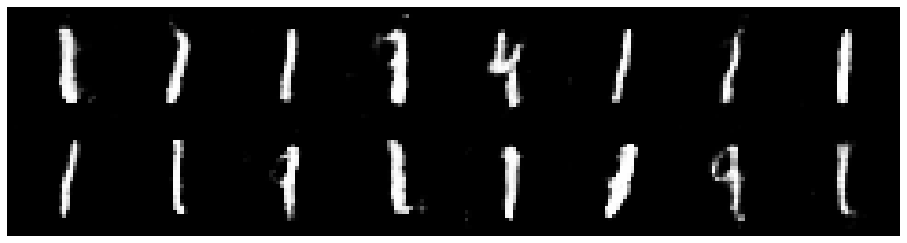

Epoch: [33/50], Batch Num: [200/600]
Discriminator Loss: 0.0621, Generator Loss: 5.6531
D(x): 0.9733, D(G(z)): 0.0167


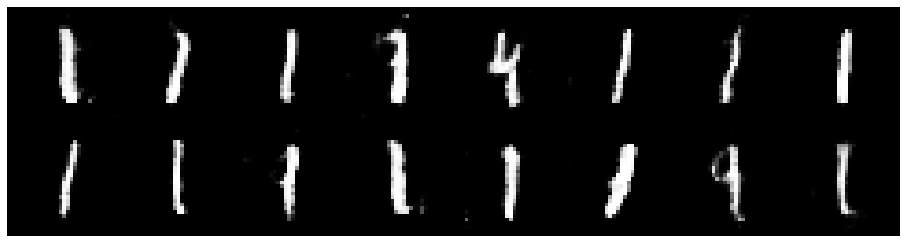

Epoch: [33/50], Batch Num: [300/600]
Discriminator Loss: 0.0823, Generator Loss: 5.9362
D(x): 0.9780, D(G(z)): 0.0383


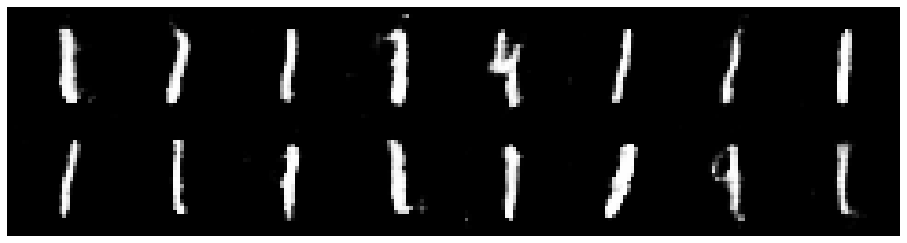

Epoch: [33/50], Batch Num: [400/600]
Discriminator Loss: 0.1764, Generator Loss: 4.8184
D(x): 0.9297, D(G(z)): 0.0306


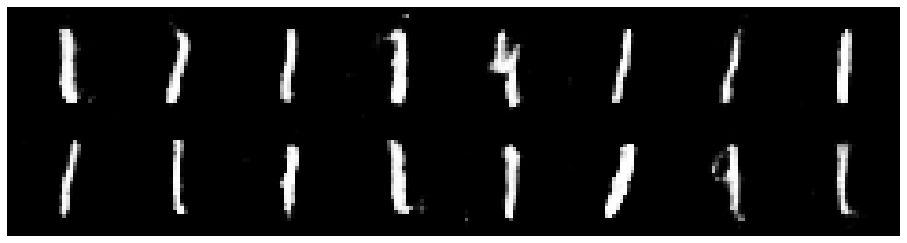

Epoch: [33/50], Batch Num: [500/600]
Discriminator Loss: 0.0855, Generator Loss: 5.9927
D(x): 0.9796, D(G(z)): 0.0321


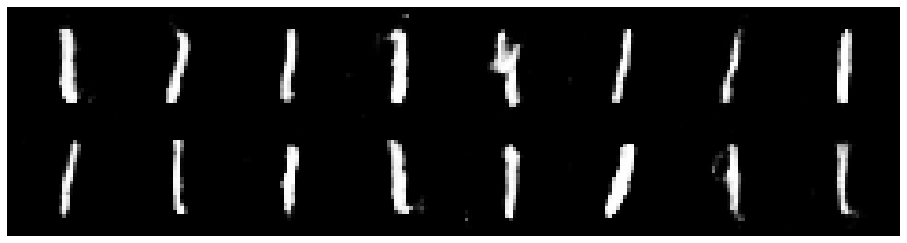

Epoch: [34/50], Batch Num: [0/600]
Discriminator Loss: 0.0867, Generator Loss: 5.1586
D(x): 0.9725, D(G(z)): 0.0280


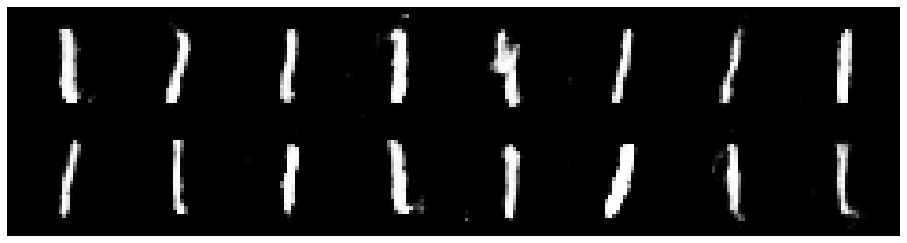

Epoch: [34/50], Batch Num: [100/600]
Discriminator Loss: 0.1027, Generator Loss: 5.2005
D(x): 0.9744, D(G(z)): 0.0396


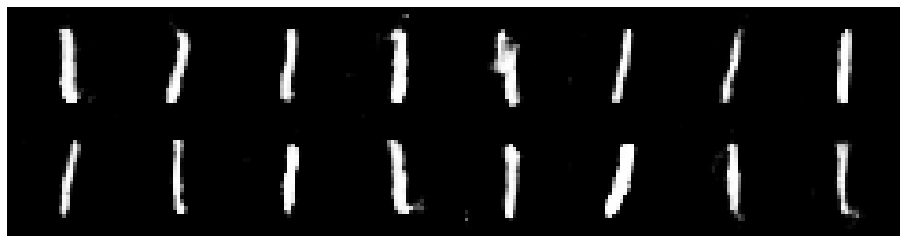

Epoch: [34/50], Batch Num: [200/600]
Discriminator Loss: 0.1927, Generator Loss: 5.2406
D(x): 0.9545, D(G(z)): 0.0343


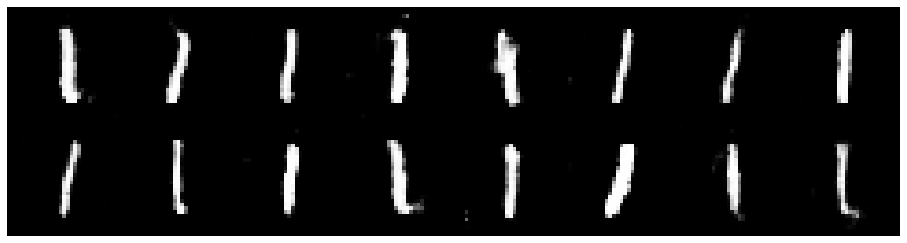

Epoch: [34/50], Batch Num: [300/600]
Discriminator Loss: 0.1506, Generator Loss: 5.5107
D(x): 0.9524, D(G(z)): 0.0131


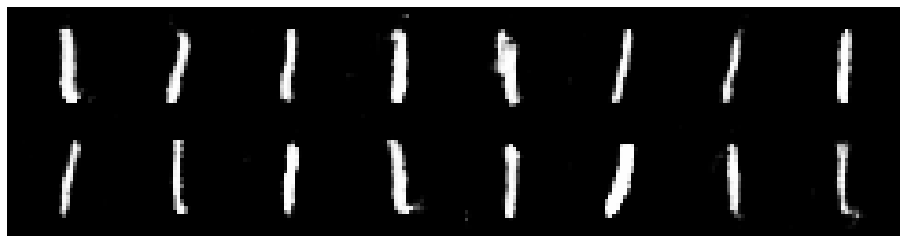

Epoch: [34/50], Batch Num: [400/600]
Discriminator Loss: 0.0756, Generator Loss: 4.8736
D(x): 0.9854, D(G(z)): 0.0239


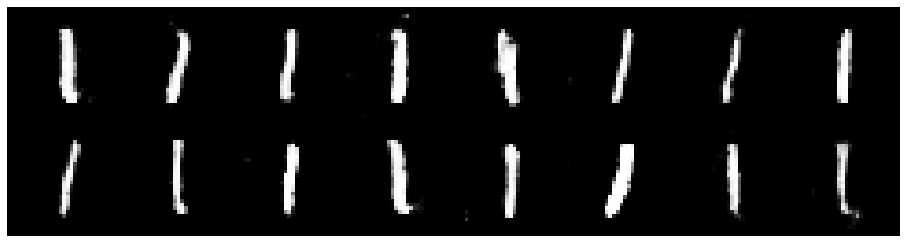

Epoch: [34/50], Batch Num: [500/600]
Discriminator Loss: 0.1619, Generator Loss: 4.2626
D(x): 0.9555, D(G(z)): 0.0443


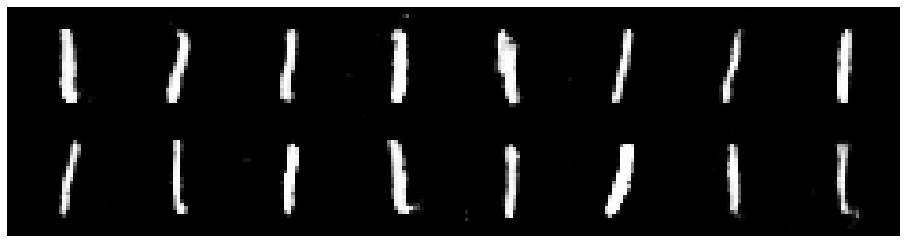

Epoch: [35/50], Batch Num: [0/600]
Discriminator Loss: 0.0495, Generator Loss: 4.4526
D(x): 0.9891, D(G(z)): 0.0308


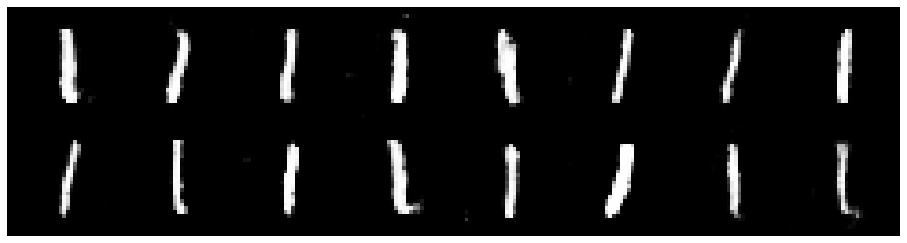

Epoch: [35/50], Batch Num: [100/600]
Discriminator Loss: 0.1254, Generator Loss: 4.0842
D(x): 0.9624, D(G(z)): 0.0367


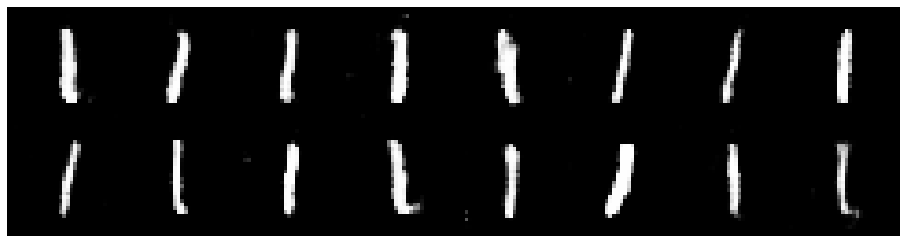

Epoch: [35/50], Batch Num: [200/600]
Discriminator Loss: 0.1519, Generator Loss: 4.5117
D(x): 0.9671, D(G(z)): 0.0548


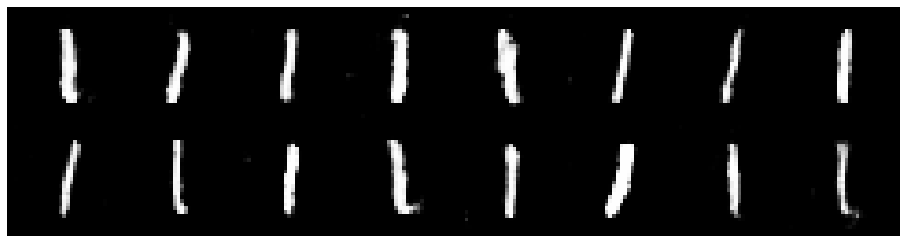

Epoch: [35/50], Batch Num: [300/600]
Discriminator Loss: 0.1788, Generator Loss: 4.7744
D(x): 0.9650, D(G(z)): 0.0422


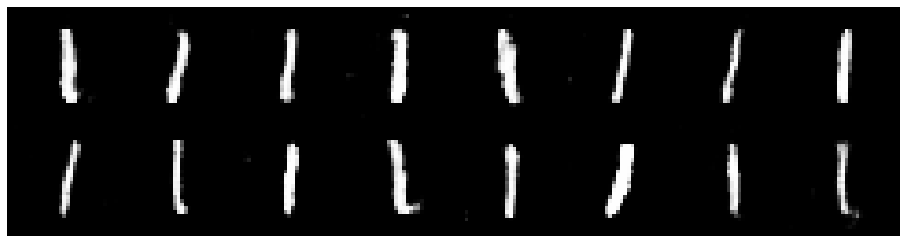

Epoch: [35/50], Batch Num: [400/600]
Discriminator Loss: 0.1256, Generator Loss: 4.0215
D(x): 0.9604, D(G(z)): 0.0333


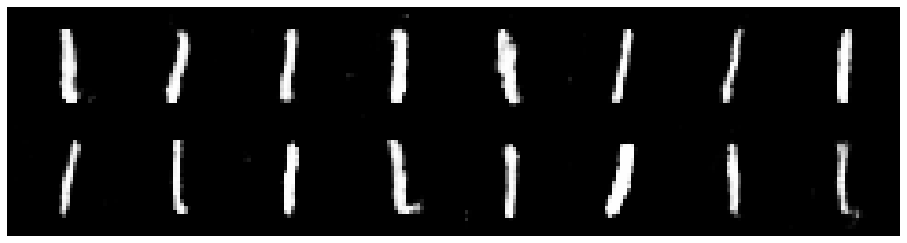

Epoch: [35/50], Batch Num: [500/600]
Discriminator Loss: 0.0932, Generator Loss: 4.3772
D(x): 0.9973, D(G(z)): 0.0629


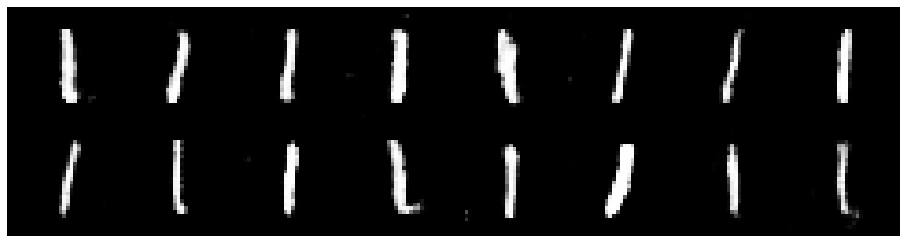

Epoch: [36/50], Batch Num: [0/600]
Discriminator Loss: 0.2263, Generator Loss: 4.2658
D(x): 0.9300, D(G(z)): 0.0526


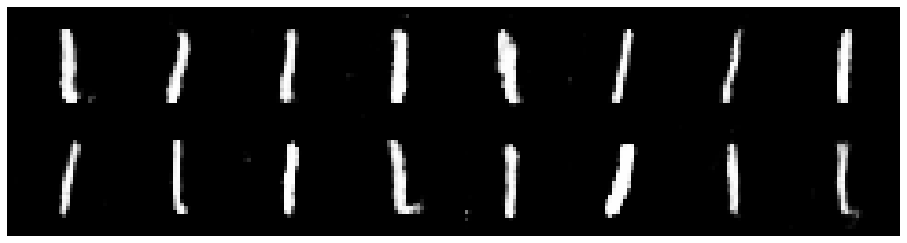

Epoch: [36/50], Batch Num: [100/600]
Discriminator Loss: 0.1215, Generator Loss: 4.5573
D(x): 0.9682, D(G(z)): 0.0406


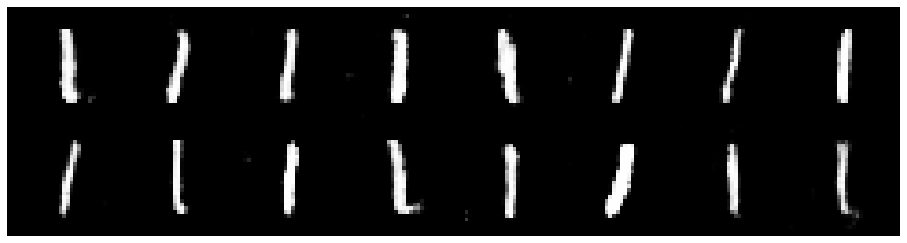

Epoch: [36/50], Batch Num: [200/600]
Discriminator Loss: 0.1605, Generator Loss: 4.3038
D(x): 0.9590, D(G(z)): 0.0431


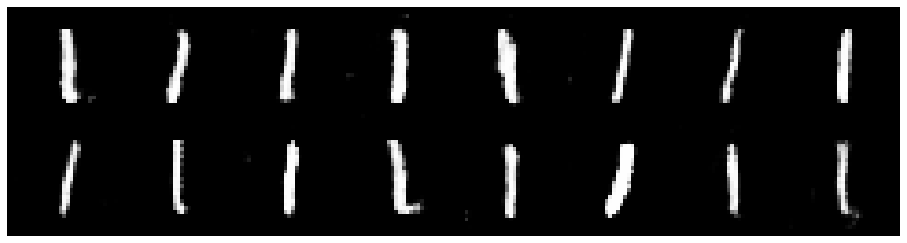

Epoch: [36/50], Batch Num: [300/600]
Discriminator Loss: 0.1946, Generator Loss: 4.8154
D(x): 0.9562, D(G(z)): 0.0558


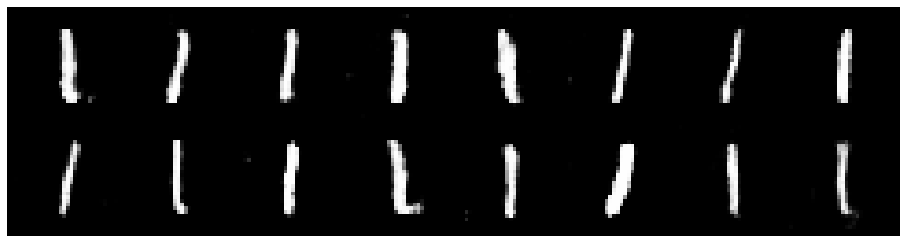

Epoch: [36/50], Batch Num: [400/600]
Discriminator Loss: 0.0899, Generator Loss: 4.4632
D(x): 0.9731, D(G(z)): 0.0373


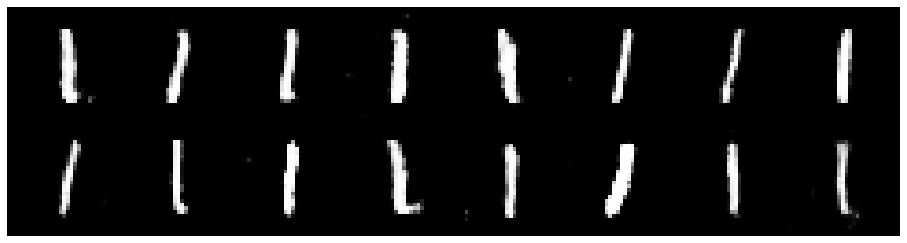

Epoch: [36/50], Batch Num: [500/600]
Discriminator Loss: 0.1103, Generator Loss: 4.9520
D(x): 0.9799, D(G(z)): 0.0351


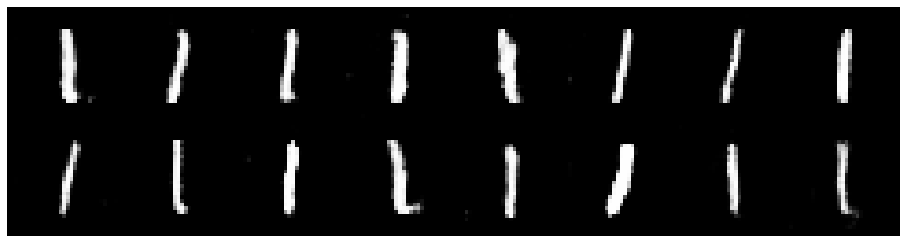

Epoch: [37/50], Batch Num: [0/600]
Discriminator Loss: 0.1485, Generator Loss: 4.7370
D(x): 0.9514, D(G(z)): 0.0280


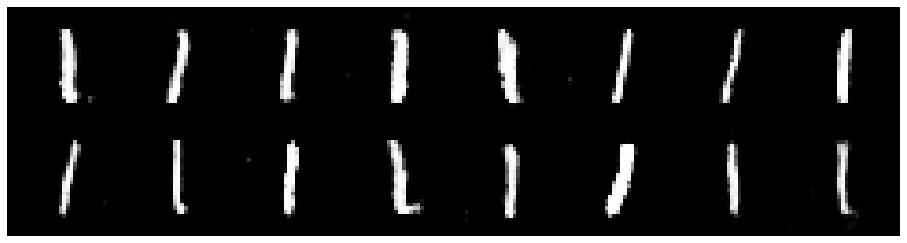

Epoch: [37/50], Batch Num: [100/600]
Discriminator Loss: 0.1679, Generator Loss: 4.7331
D(x): 0.9521, D(G(z)): 0.0308


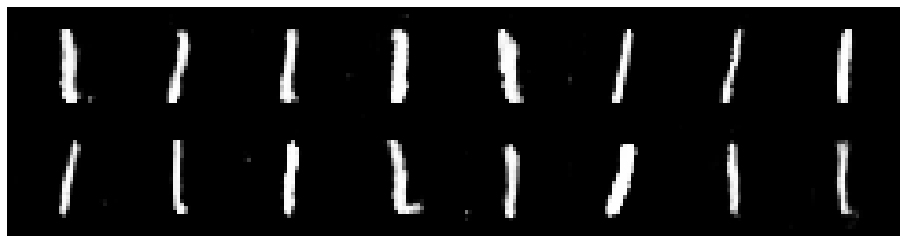

Epoch: [37/50], Batch Num: [200/600]
Discriminator Loss: 0.2144, Generator Loss: 4.1984
D(x): 0.9506, D(G(z)): 0.0730


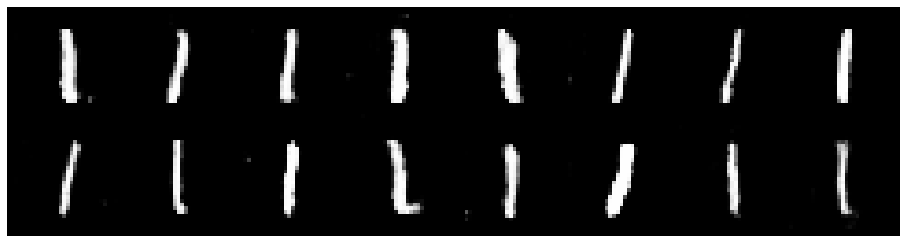

Epoch: [37/50], Batch Num: [300/600]
Discriminator Loss: 0.1197, Generator Loss: 4.7804
D(x): 0.9669, D(G(z)): 0.0198


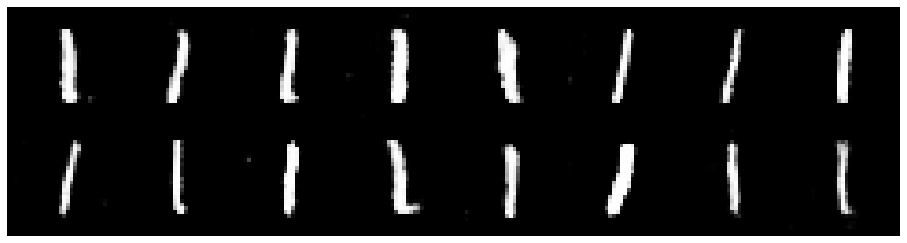

Epoch: [37/50], Batch Num: [400/600]
Discriminator Loss: 0.0882, Generator Loss: 4.8845
D(x): 0.9695, D(G(z)): 0.0209


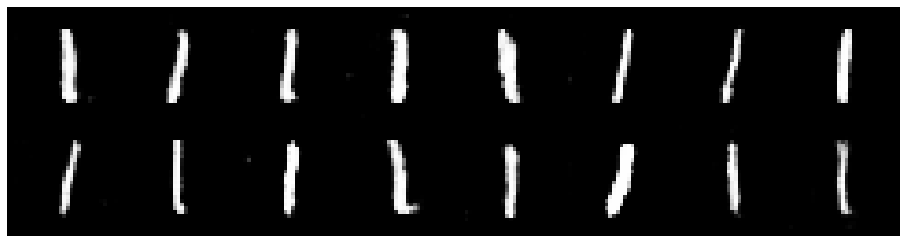

Epoch: [37/50], Batch Num: [500/600]
Discriminator Loss: 0.1295, Generator Loss: 4.6612
D(x): 0.9666, D(G(z)): 0.0325


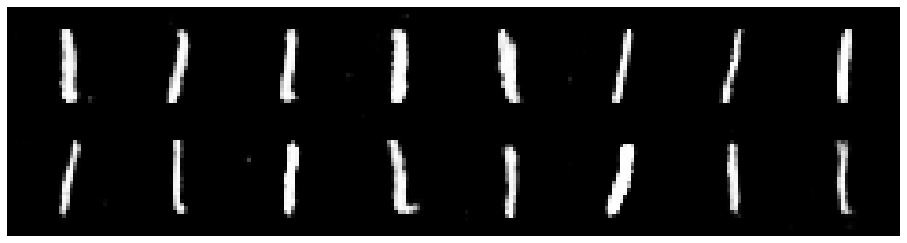

Epoch: [38/50], Batch Num: [0/600]
Discriminator Loss: 0.1356, Generator Loss: 4.5422
D(x): 0.9481, D(G(z)): 0.0146


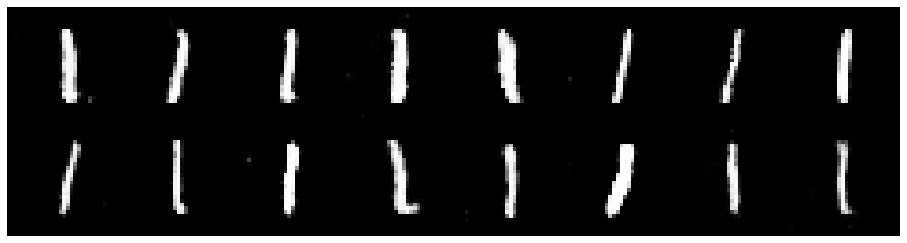

Epoch: [38/50], Batch Num: [100/600]
Discriminator Loss: 0.1330, Generator Loss: 5.8442
D(x): 0.9696, D(G(z)): 0.0231


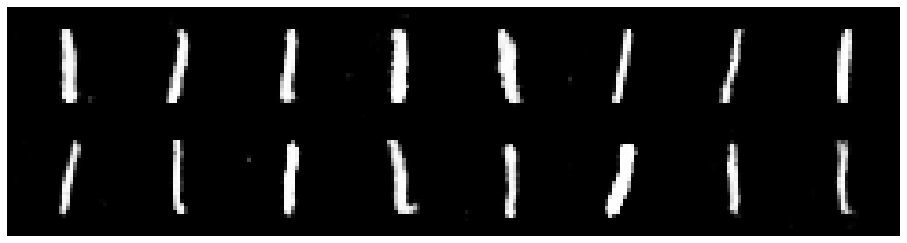

Epoch: [38/50], Batch Num: [200/600]
Discriminator Loss: 0.1354, Generator Loss: 4.5681
D(x): 0.9631, D(G(z)): 0.0384


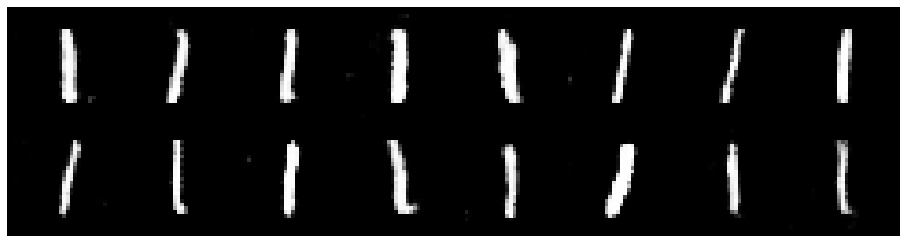

Epoch: [38/50], Batch Num: [300/600]
Discriminator Loss: 0.1300, Generator Loss: 5.4755
D(x): 0.9566, D(G(z)): 0.0138


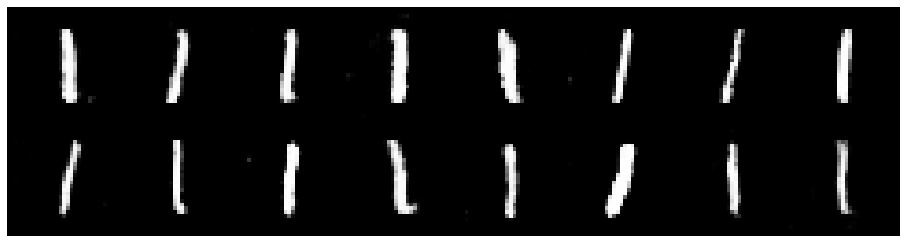

Epoch: [38/50], Batch Num: [400/600]
Discriminator Loss: 0.1988, Generator Loss: 4.1972
D(x): 0.9515, D(G(z)): 0.0652


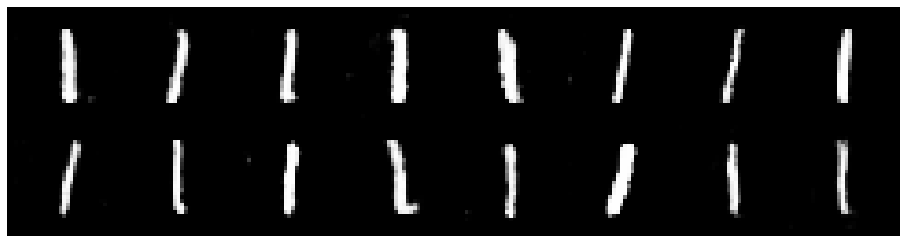

Epoch: [38/50], Batch Num: [500/600]
Discriminator Loss: 0.1870, Generator Loss: 4.9280
D(x): 0.9623, D(G(z)): 0.0250


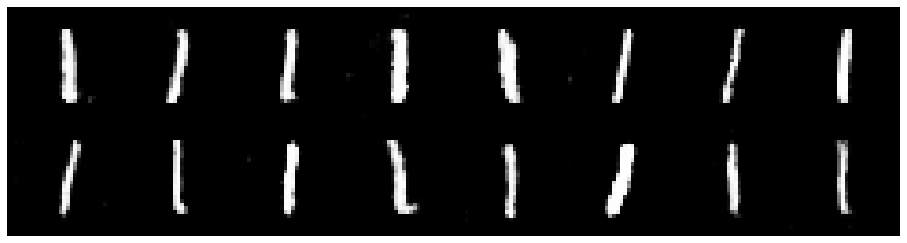

Epoch: [39/50], Batch Num: [0/600]
Discriminator Loss: 0.0975, Generator Loss: 5.3071
D(x): 0.9754, D(G(z)): 0.0414


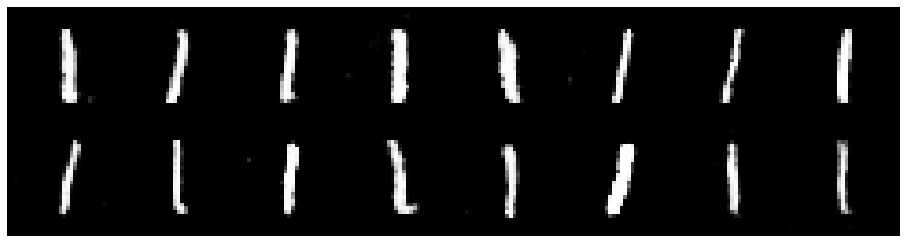

Epoch: [39/50], Batch Num: [100/600]
Discriminator Loss: 0.1268, Generator Loss: 4.2044
D(x): 0.9840, D(G(z)): 0.0783


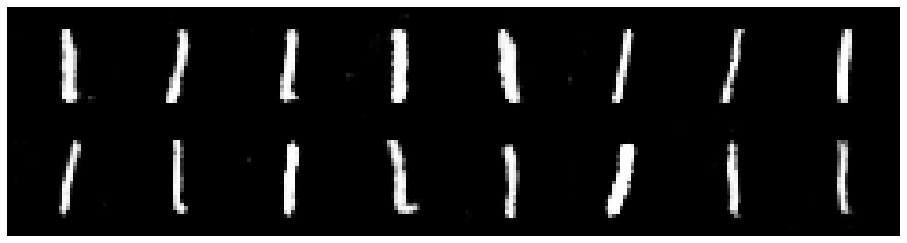

Epoch: [39/50], Batch Num: [200/600]
Discriminator Loss: 0.1225, Generator Loss: 4.5918
D(x): 0.9684, D(G(z)): 0.0312


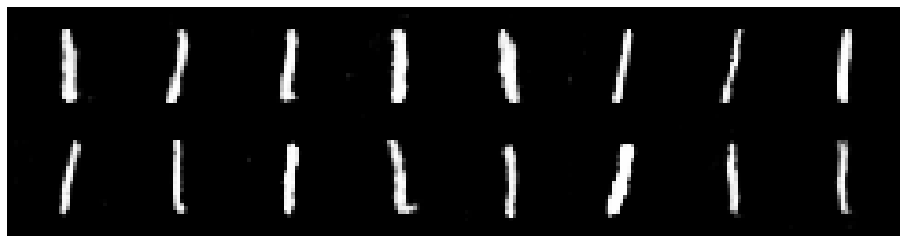

Epoch: [39/50], Batch Num: [300/600]
Discriminator Loss: 0.1018, Generator Loss: 4.6069
D(x): 0.9681, D(G(z)): 0.0258


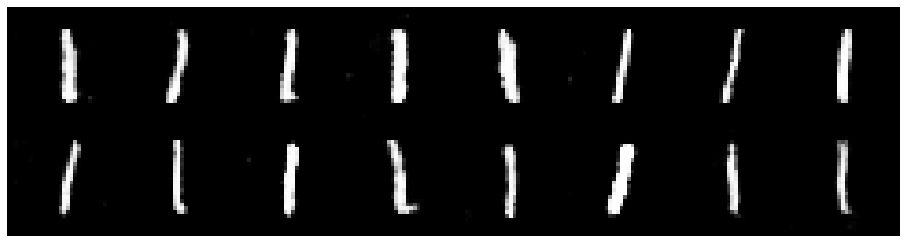

Epoch: [39/50], Batch Num: [400/600]
Discriminator Loss: 0.0800, Generator Loss: 4.5916
D(x): 0.9702, D(G(z)): 0.0204


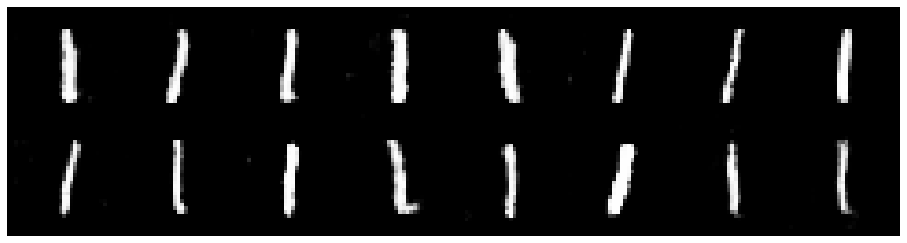

Epoch: [39/50], Batch Num: [500/600]
Discriminator Loss: 0.1053, Generator Loss: 5.2322
D(x): 0.9878, D(G(z)): 0.0539


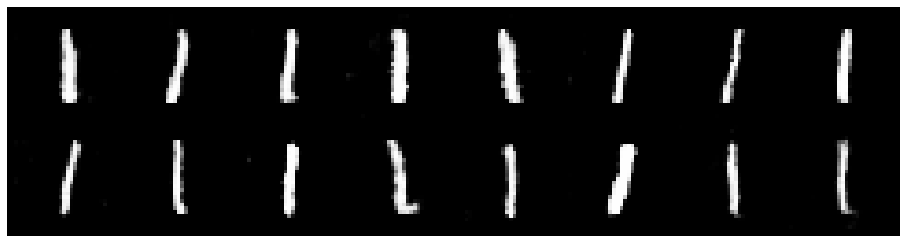

Epoch: [40/50], Batch Num: [0/600]
Discriminator Loss: 0.1595, Generator Loss: 4.4884
D(x): 0.9493, D(G(z)): 0.0368


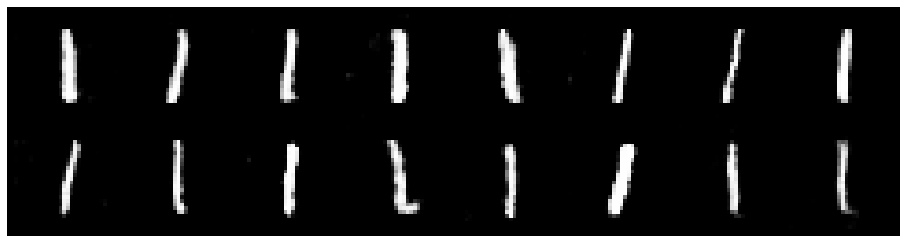

Epoch: [40/50], Batch Num: [100/600]
Discriminator Loss: 0.1856, Generator Loss: 4.0689
D(x): 0.9609, D(G(z)): 0.0853


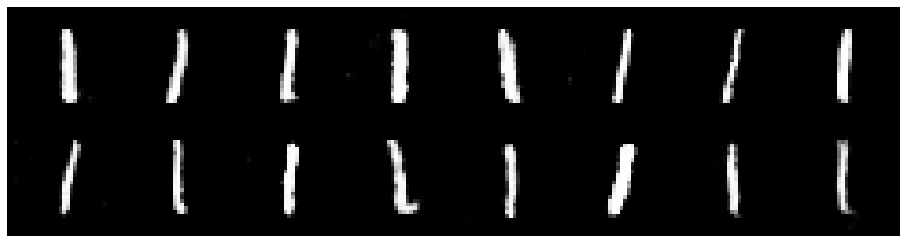

Epoch: [40/50], Batch Num: [200/600]
Discriminator Loss: 0.1207, Generator Loss: 3.7266
D(x): 0.9657, D(G(z)): 0.0602


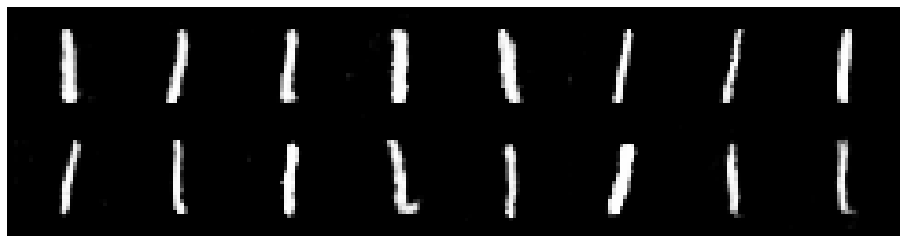

Epoch: [40/50], Batch Num: [300/600]
Discriminator Loss: 0.1255, Generator Loss: 5.0299
D(x): 0.9582, D(G(z)): 0.0334


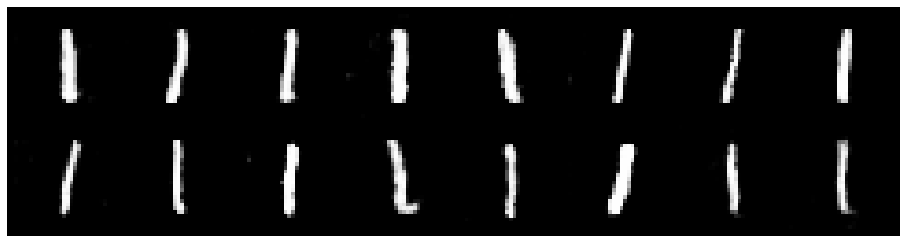

Epoch: [40/50], Batch Num: [400/600]
Discriminator Loss: 0.0459, Generator Loss: 4.2947
D(x): 0.9997, D(G(z)): 0.0398


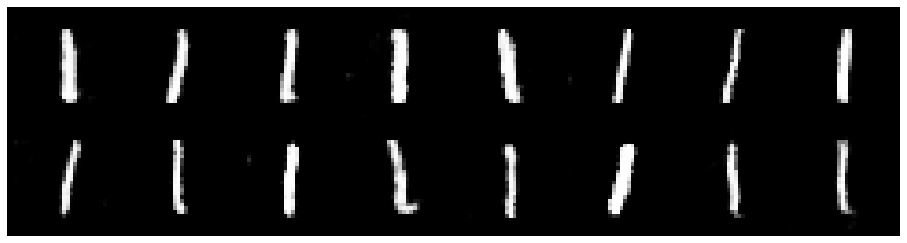

Epoch: [40/50], Batch Num: [500/600]
Discriminator Loss: 0.0653, Generator Loss: 5.3709
D(x): 0.9826, D(G(z)): 0.0130


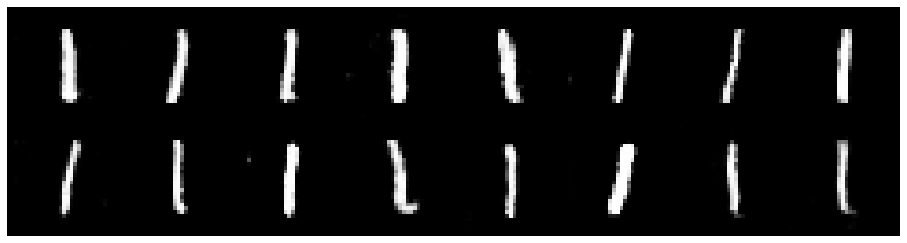

Epoch: [41/50], Batch Num: [0/600]
Discriminator Loss: 0.0944, Generator Loss: 4.5274
D(x): 0.9727, D(G(z)): 0.0404


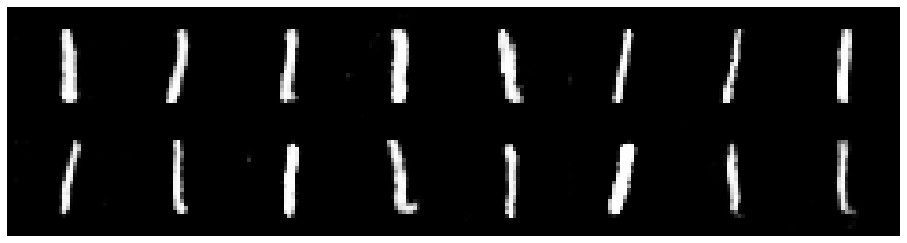

Epoch: [41/50], Batch Num: [100/600]
Discriminator Loss: 0.1029, Generator Loss: 4.6145
D(x): 0.9675, D(G(z)): 0.0408


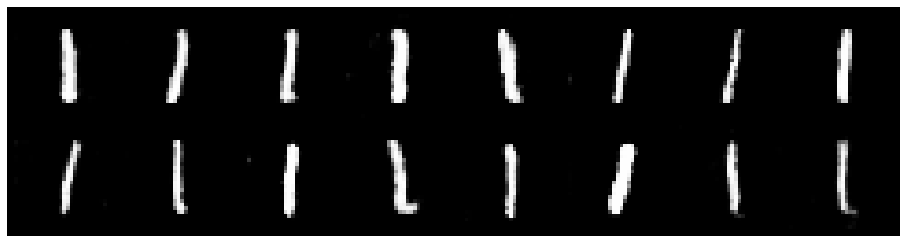

Epoch: [41/50], Batch Num: [200/600]
Discriminator Loss: 0.1370, Generator Loss: 5.0462
D(x): 0.9755, D(G(z)): 0.0368


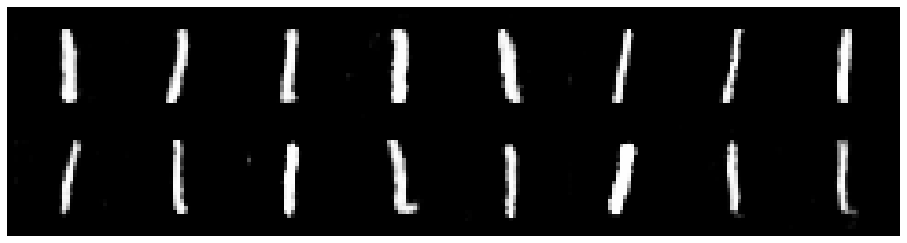

Epoch: [41/50], Batch Num: [300/600]
Discriminator Loss: 0.1671, Generator Loss: 4.4633
D(x): 0.9615, D(G(z)): 0.0522


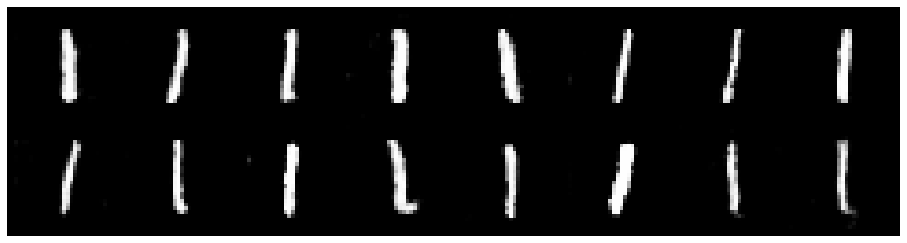

Epoch: [41/50], Batch Num: [400/600]
Discriminator Loss: 0.1218, Generator Loss: 5.1656
D(x): 0.9647, D(G(z)): 0.0339


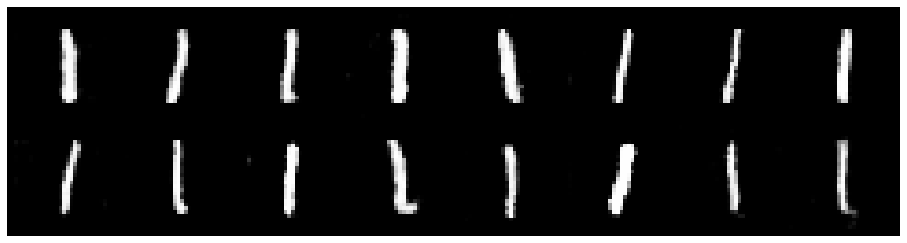

Epoch: [41/50], Batch Num: [500/600]
Discriminator Loss: 0.0932, Generator Loss: 4.8857
D(x): 0.9830, D(G(z)): 0.0331


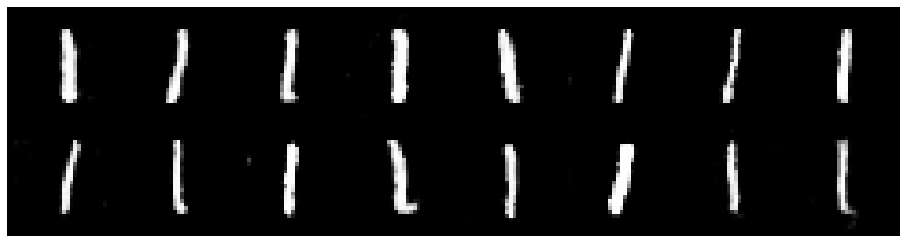

Epoch: [42/50], Batch Num: [0/600]
Discriminator Loss: 0.1458, Generator Loss: 4.8760
D(x): 0.9496, D(G(z)): 0.0265


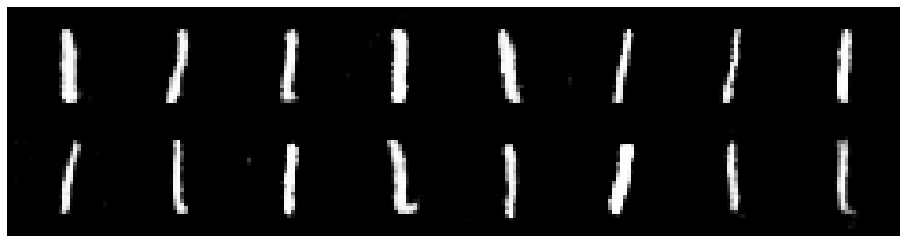

Epoch: [42/50], Batch Num: [100/600]
Discriminator Loss: 0.0660, Generator Loss: 5.4525
D(x): 0.9831, D(G(z)): 0.0329


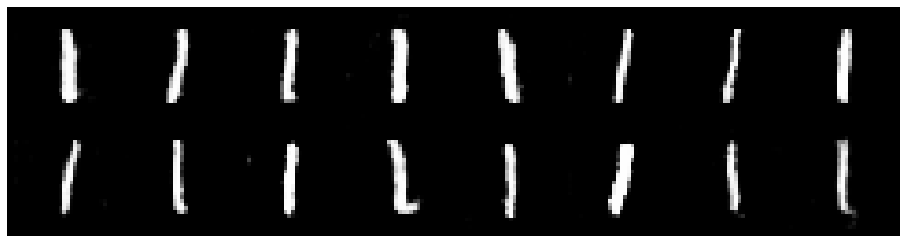

Epoch: [42/50], Batch Num: [200/600]
Discriminator Loss: 0.0853, Generator Loss: 4.3494
D(x): 0.9852, D(G(z)): 0.0559


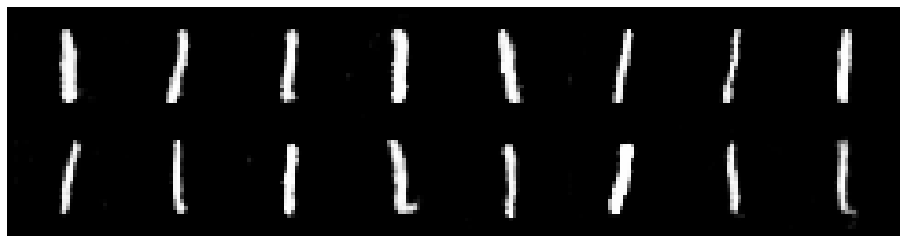

Epoch: [42/50], Batch Num: [300/600]
Discriminator Loss: 0.2170, Generator Loss: 5.0234
D(x): 0.9339, D(G(z)): 0.0272


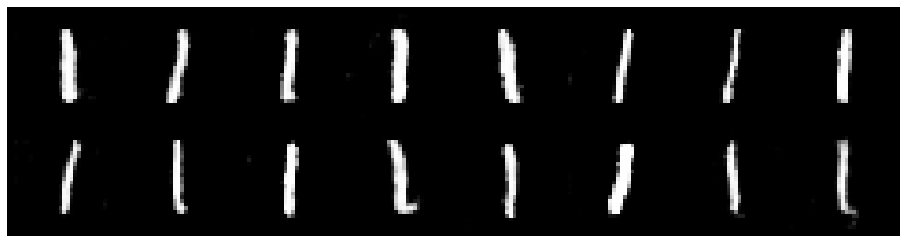

Epoch: [42/50], Batch Num: [400/600]
Discriminator Loss: 0.0999, Generator Loss: 4.6687
D(x): 0.9685, D(G(z)): 0.0363


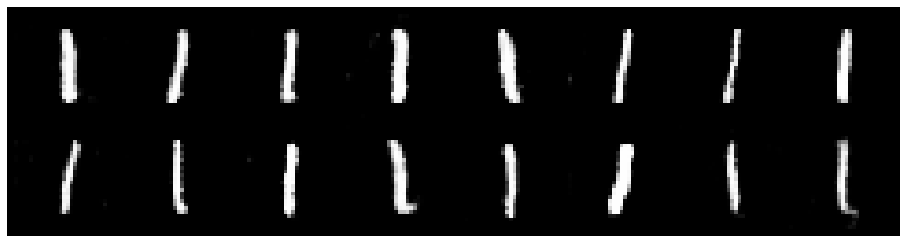

Epoch: [42/50], Batch Num: [500/600]
Discriminator Loss: 0.1527, Generator Loss: 6.1560
D(x): 0.9669, D(G(z)): 0.0165


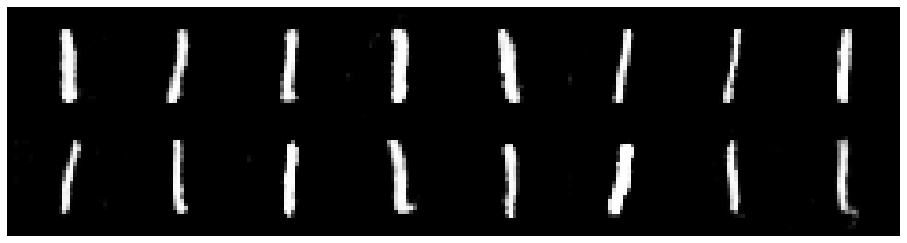

Epoch: [43/50], Batch Num: [0/600]
Discriminator Loss: 0.1634, Generator Loss: 5.0029
D(x): 0.9492, D(G(z)): 0.0347


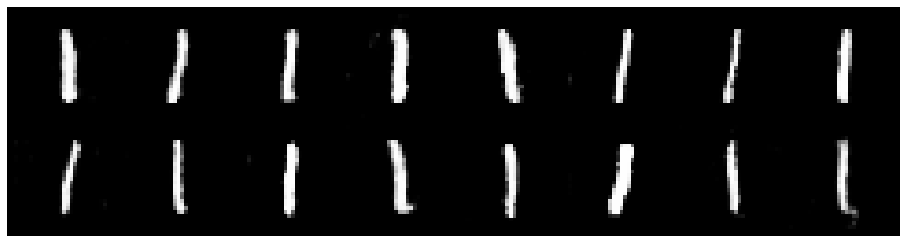

Epoch: [43/50], Batch Num: [100/600]
Discriminator Loss: 0.1028, Generator Loss: 5.3628
D(x): 0.9755, D(G(z)): 0.0299


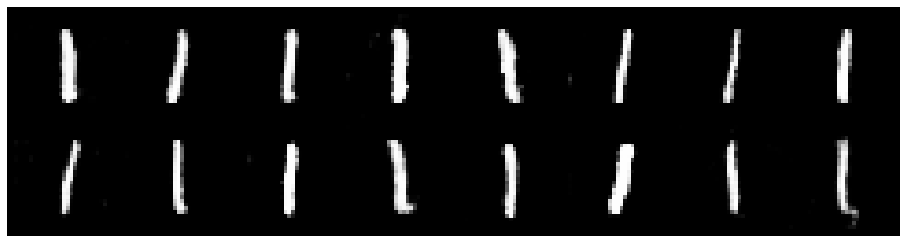

Epoch: [43/50], Batch Num: [200/600]
Discriminator Loss: 0.0485, Generator Loss: 4.9279
D(x): 0.9887, D(G(z)): 0.0197


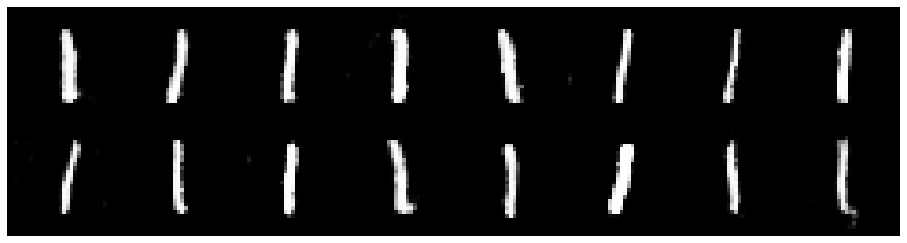

Epoch: [43/50], Batch Num: [300/600]
Discriminator Loss: 0.1227, Generator Loss: 5.1787
D(x): 0.9805, D(G(z)): 0.0325


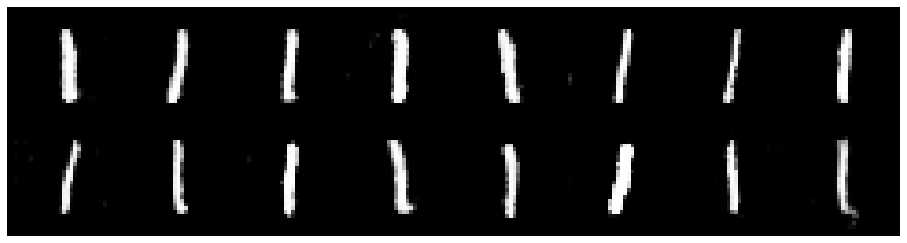

Epoch: [43/50], Batch Num: [400/600]
Discriminator Loss: 0.1067, Generator Loss: 5.1049
D(x): 0.9694, D(G(z)): 0.0454


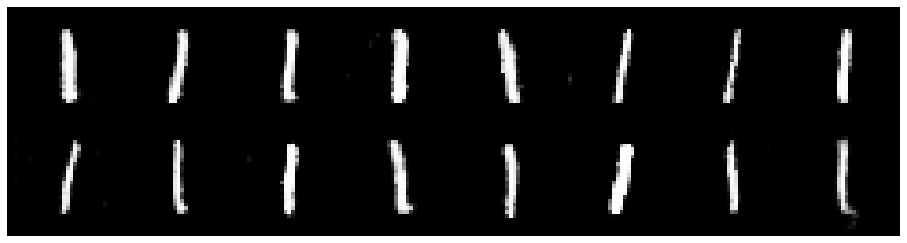

Epoch: [43/50], Batch Num: [500/600]
Discriminator Loss: 0.2438, Generator Loss: 5.9799
D(x): 0.9452, D(G(z)): 0.0119


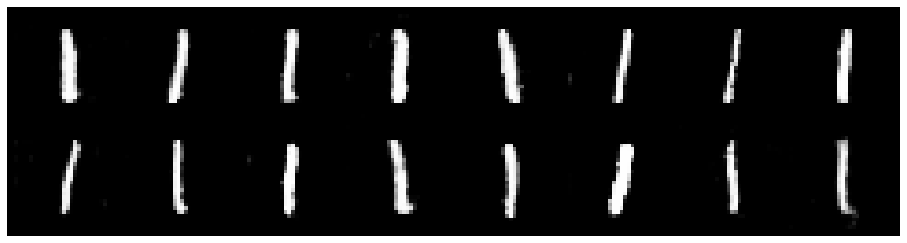

Epoch: [44/50], Batch Num: [0/600]
Discriminator Loss: 0.1474, Generator Loss: 5.2432
D(x): 0.9711, D(G(z)): 0.0299


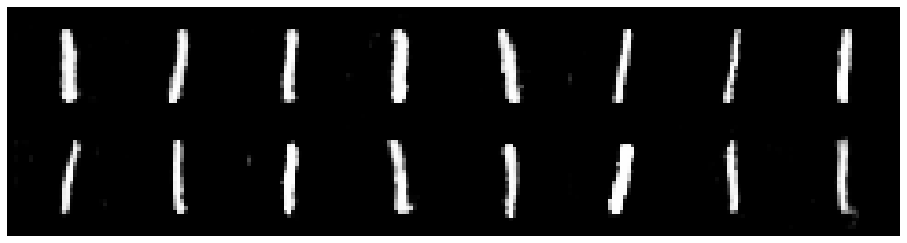

Epoch: [44/50], Batch Num: [100/600]
Discriminator Loss: 0.0464, Generator Loss: 4.3621
D(x): 0.9934, D(G(z)): 0.0347


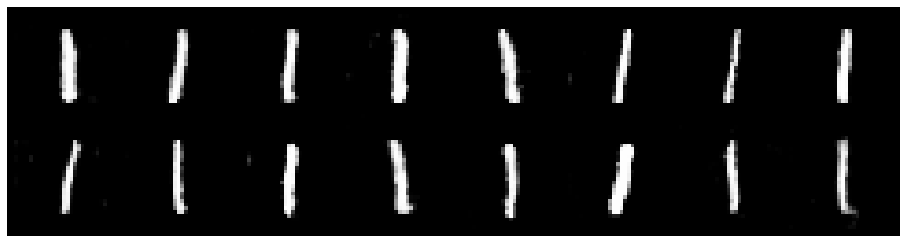

Epoch: [44/50], Batch Num: [200/600]
Discriminator Loss: 0.1174, Generator Loss: 5.5166
D(x): 0.9673, D(G(z)): 0.0263


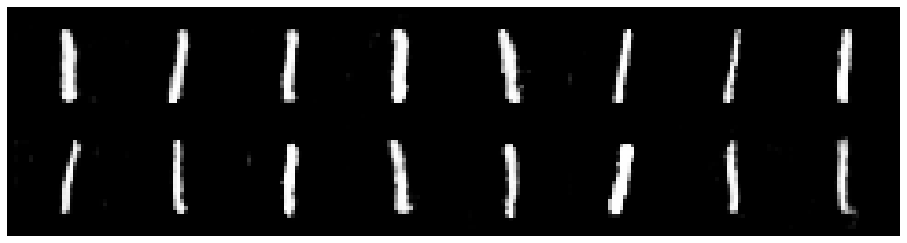

Epoch: [44/50], Batch Num: [300/600]
Discriminator Loss: 0.0509, Generator Loss: 4.9251
D(x): 0.9829, D(G(z)): 0.0200


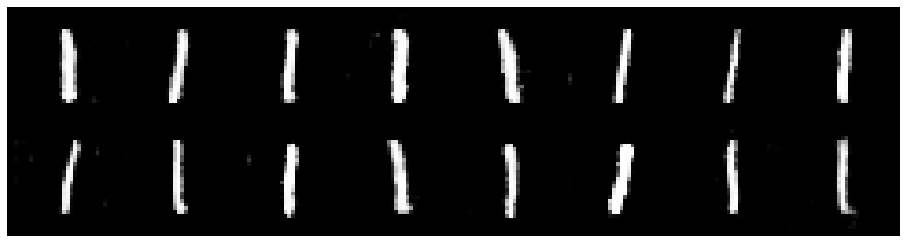

Epoch: [44/50], Batch Num: [400/600]
Discriminator Loss: 0.1035, Generator Loss: 5.1701
D(x): 0.9755, D(G(z)): 0.0293


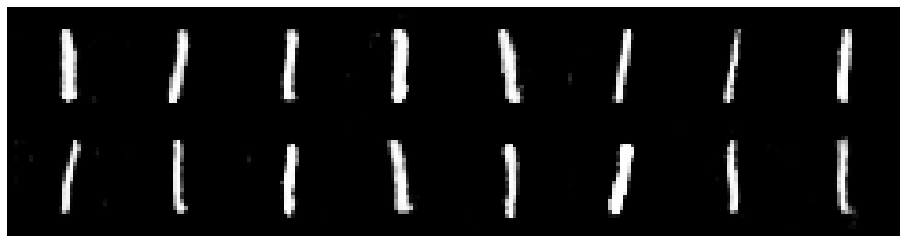

Epoch: [44/50], Batch Num: [500/600]
Discriminator Loss: 0.0850, Generator Loss: 5.6954
D(x): 0.9779, D(G(z)): 0.0154


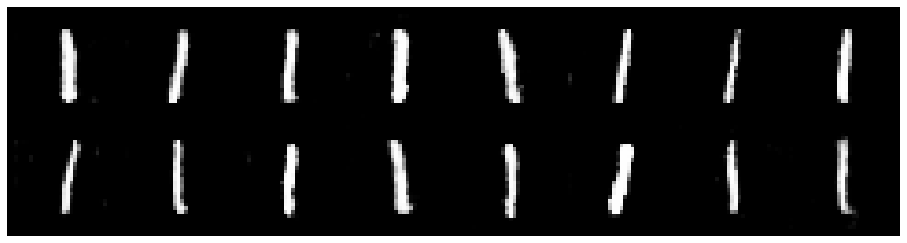

Epoch: [45/50], Batch Num: [0/600]
Discriminator Loss: 0.0693, Generator Loss: 5.1113
D(x): 0.9856, D(G(z)): 0.0211


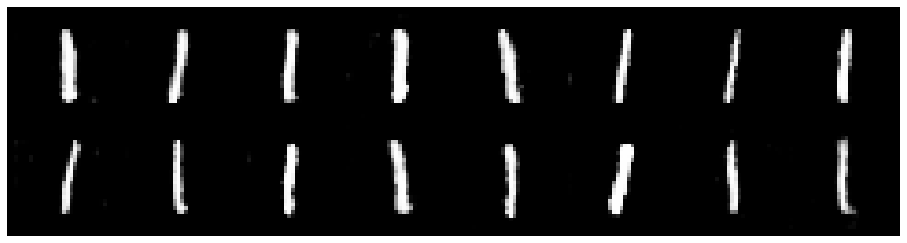

Epoch: [45/50], Batch Num: [100/600]
Discriminator Loss: 0.1031, Generator Loss: 5.1334
D(x): 0.9724, D(G(z)): 0.0307


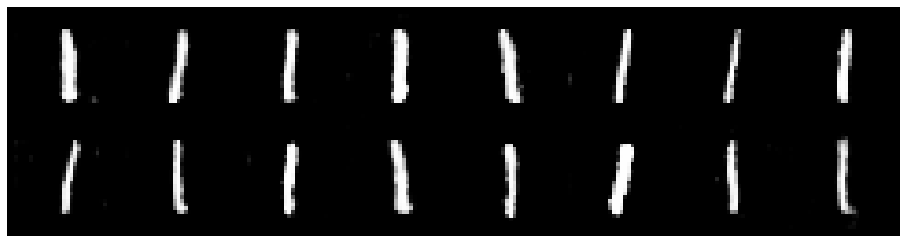

Epoch: [45/50], Batch Num: [200/600]
Discriminator Loss: 0.1139, Generator Loss: 5.4992
D(x): 0.9597, D(G(z)): 0.0263


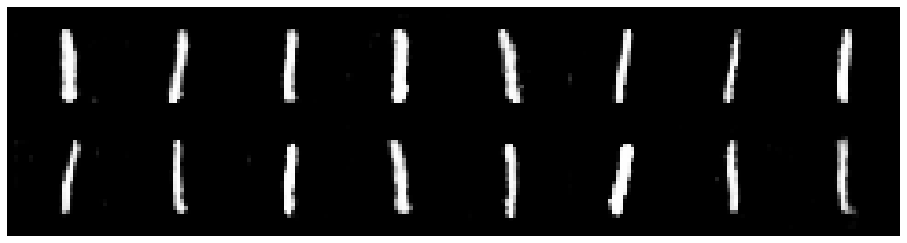

Epoch: [45/50], Batch Num: [300/600]
Discriminator Loss: 0.1941, Generator Loss: 5.7222
D(x): 0.9524, D(G(z)): 0.0289


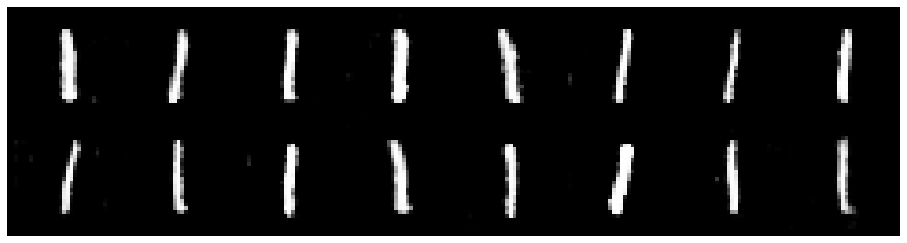

Epoch: [45/50], Batch Num: [400/600]
Discriminator Loss: 0.1936, Generator Loss: 5.1924
D(x): 0.9447, D(G(z)): 0.0217


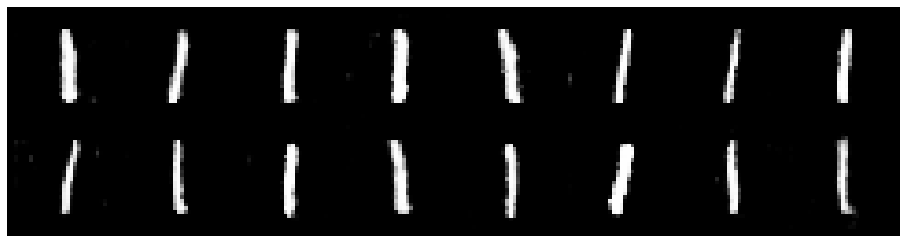

Epoch: [45/50], Batch Num: [500/600]
Discriminator Loss: 0.0679, Generator Loss: 5.3789
D(x): 0.9858, D(G(z)): 0.0316


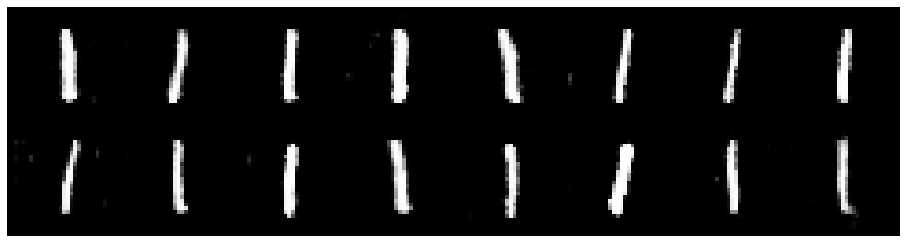

Epoch: [46/50], Batch Num: [0/600]
Discriminator Loss: 0.1172, Generator Loss: 5.7590
D(x): 0.9720, D(G(z)): 0.0154


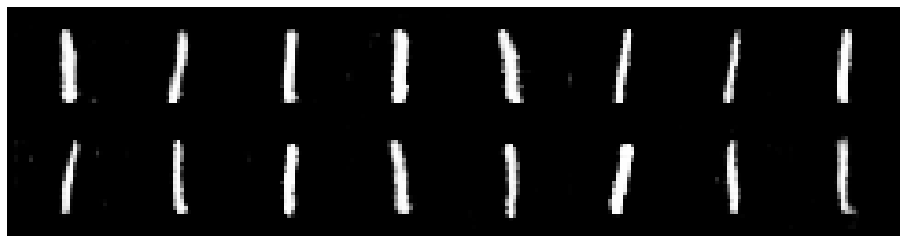

Epoch: [46/50], Batch Num: [100/600]
Discriminator Loss: 0.1825, Generator Loss: 5.2346
D(x): 0.9449, D(G(z)): 0.0338


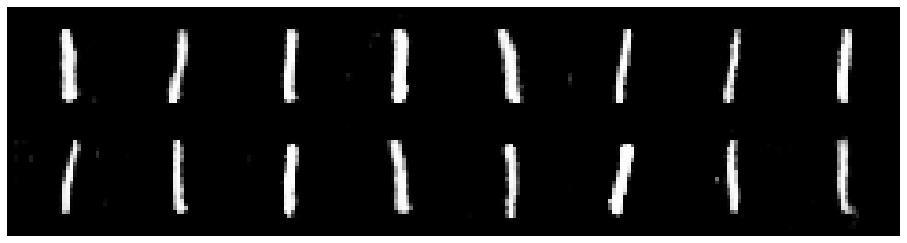

Epoch: [46/50], Batch Num: [200/600]
Discriminator Loss: 0.0283, Generator Loss: 4.9970
D(x): 0.9911, D(G(z)): 0.0170


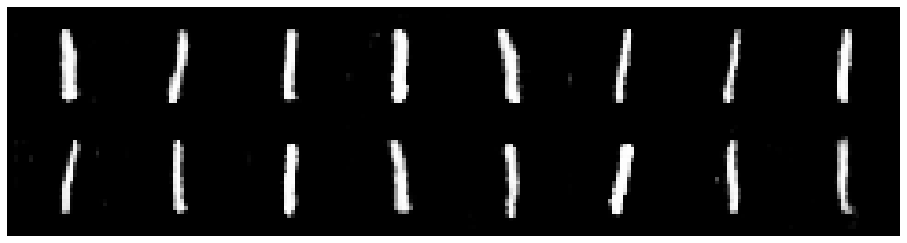

Epoch: [46/50], Batch Num: [300/600]
Discriminator Loss: 0.2063, Generator Loss: 5.0758
D(x): 0.9375, D(G(z)): 0.0232


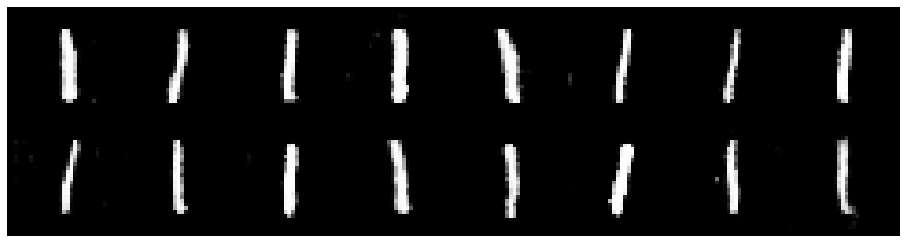

Epoch: [46/50], Batch Num: [400/600]
Discriminator Loss: 0.1478, Generator Loss: 5.4689
D(x): 0.9506, D(G(z)): 0.0276


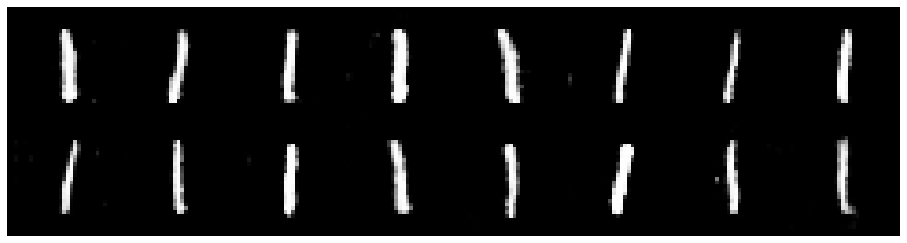

Epoch: [46/50], Batch Num: [500/600]
Discriminator Loss: 0.0489, Generator Loss: 5.7787
D(x): 0.9816, D(G(z)): 0.0173


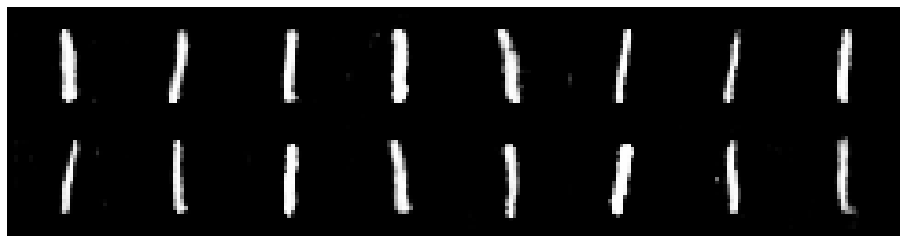

Epoch: [47/50], Batch Num: [0/600]
Discriminator Loss: 0.0949, Generator Loss: 4.4908
D(x): 0.9633, D(G(z)): 0.0294


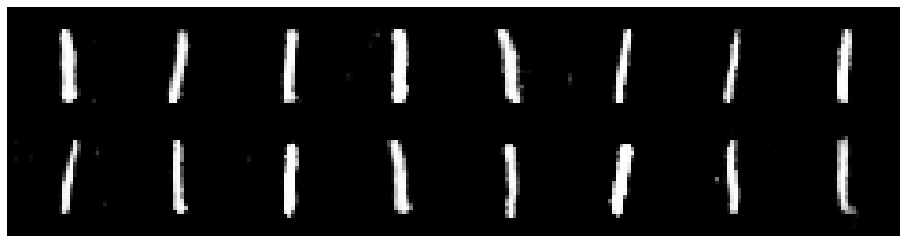

Epoch: [47/50], Batch Num: [100/600]
Discriminator Loss: 0.0587, Generator Loss: 5.2718
D(x): 0.9832, D(G(z)): 0.0222


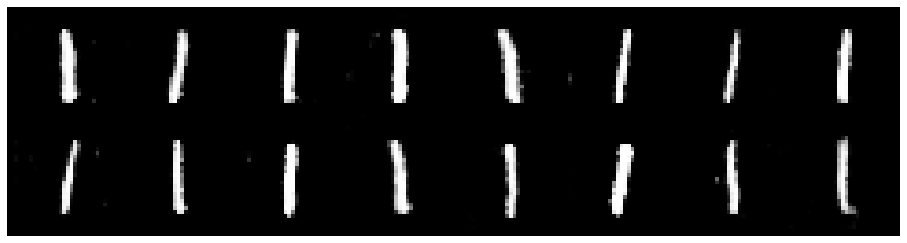

Epoch: [47/50], Batch Num: [200/600]
Discriminator Loss: 0.2228, Generator Loss: 4.6948
D(x): 0.9833, D(G(z)): 0.0724


KeyboardInterrupt: 

In [72]:
# Create logger instance
logger = Logger(model_name='Vannila_GAN', data_name='MNIST')# Total number of epochs to train

num_epochs = 50

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)        
        #print(N)
        real_sample = Variable(real_batch)        
        
        G_sample = G(get_latent_sample(N)).detach()        
        #explain the significance of detach in description
        
        # Train D
        d_loss, d_real_score, d_fake_score = train_D(D_optimizer, real_sample, G_sample)

        G_sample = G(get_latent_sample(N))        
        
        # Train G
        g_loss = train_G(G_optimizer, G_sample)
        
        # Log things
        logger.log(d_loss, g_loss, epoch, n_batch, num_batches)        
        
        # Display Progress after some interval
        if ((n_batch) % 100 == 0) and ((num_epochs) % 2 ==0 ): 
            test_images = G(test_noise)
            test_images = test_images.data            
            
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_loss, g_loss, d_real_score, d_fake_score
            )

torch.Size([100, 1, 28, 28])
torch.Size([100, 1, 28, 28])


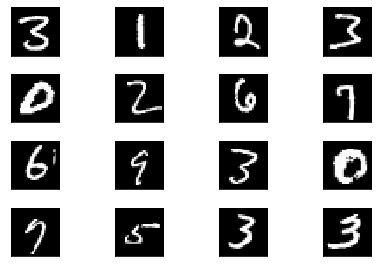

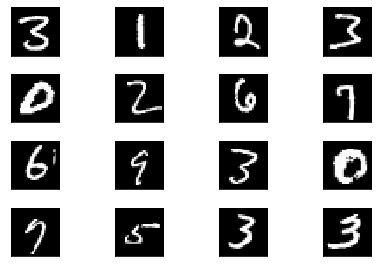

In [106]:
images, labels = next(iter(data_loader))
print(images.shape)
#plt.imshow(images[0].reshape(28,28), cmap="gray")

examples = enumerate(data_loader)
batch_idx, (example_data, example_targets) = next(examples)
print(example_data.shape)

import matplotlib.pyplot as plt

fig = plt.figure()
for i in range(16):
  plt.subplot(4,4,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  #plt.title("Ground Truth: {}".format(example_targets[i]))
  plt.xticks([])
  plt.yticks([])
fig

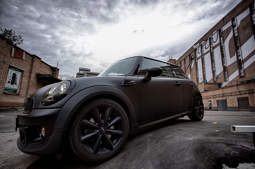

In [50]:
import torch as t
from torchvision.transforms import ToPILImage
from IPython.display import Image
to_img = ToPILImage()

# display tensor
a = t.Tensor(3, 64, 64).normal_()
to_img(a)

# display imagefile
Image('ondemand/sr_data/train_LR/DIV2K_train_LR_x8/0100x8.png')

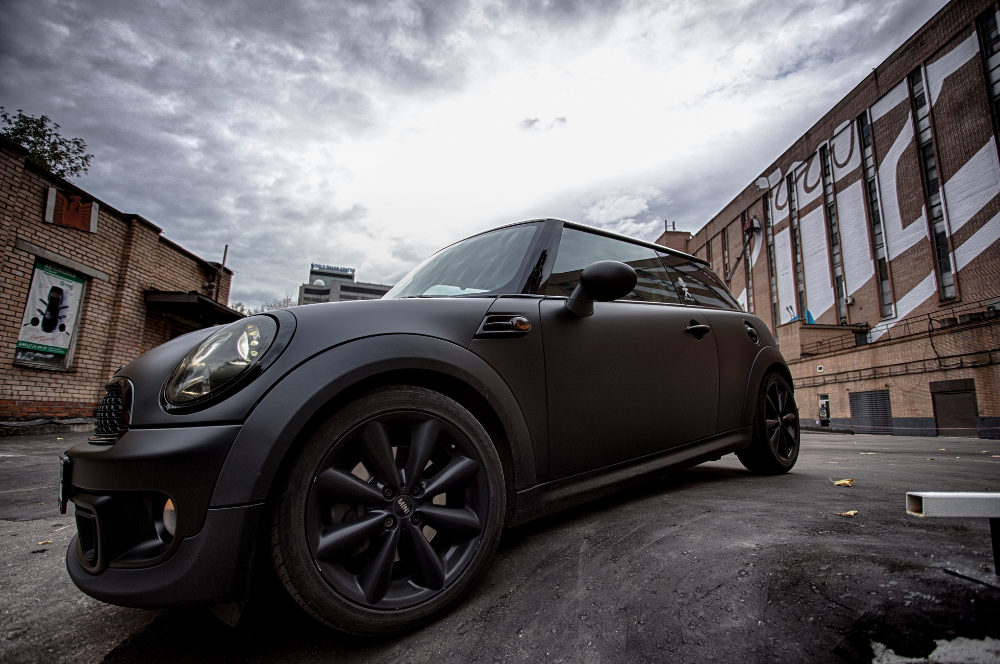

In [51]:
Image('ondemand/sr_data/train_HR/DIV2K_train_HR/0100.png')

This tutorial has been designed with help from the following websites:

a) https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

b) https://medium.com/ai-society/gans-from-scratch-1-a-deep-introduction-with-code-in-pytorch-and-tensorflow-cb03cdcdba0f